In [1]:
import  time
print( 'Last updated: %s' %time.strftime('%d/%m/%Y') )

Last updated: 12/01/2022


In [2]:
# computing modules
import os
import re
import rbo
import math
import numpy as np
import pandas as pd
import scipy as sc
import seaborn as sns
import languageCompute as lc # custom module for computations
import googleNgram as gn # custom module for the Google Ngram data
import pickle as pkl
import wf2020 as wf20
seed = 42 # for reproducibility
from scipy.optimize import curve_fit

# plotting modules
import languagePlot as lp # custom module for plotting utilities
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as cl
import matplotlib as mp
font = {'size':22}
mp.rc('font',**font)
import matplotlib.font_manager as mfm
fontP = mfm.FontProperties(fname='unifont.ttf',size=18) # for printing unicode characters (e.g. simplified chinese)

# directory for the precomputed values and simulations
precomp_gn_dir = 'save/google-1gram-computations'
precomp_wf_dir = 'save/wright-fisher-simulations'
precomp_rc_dir = 'save/rank-change-computations'

# directory to save figures
try:
    os.mkdir('figures/')
except:
    pass
try:
    os.mkdir('figures/MAIN-1')
except:
    pass

## 1. The Wright-Fisher (WF) Inspired Model.

### 1.1. WF as Multinomial Probability Transitions.

#### 1.1.1. Behaviors when Zipf Shape Parameter Varies.

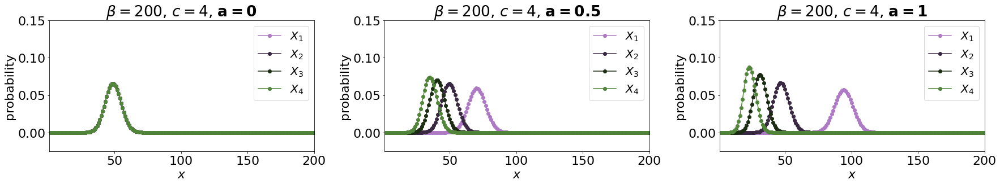

In [3]:
fig, ax = plt.subplots(1,3,figsize=(25,5))
a_examples_vect = [0,0.50,1]

for ii, aa in enumerate(a_examples_vect):
    a_example = aa
    c_example = 4
    beta_example = 200
    pmf_zipf, cdf_zipf = wf20.zipf(range(1,c_example+1),a_example)

    # define colormap given a color
    color = '#AF7AC5'
    match_hex = re.search(r'^#(?:[0-9a-fA-F]{3}){1,2}$', color)
    if not match_hex:
        try:
            color = colors_hex[color]
        except:
            print('Color '+str(color)+' not available. Try converting it to hexadecimal. Using default color...')
            color = colors_hex['red']
    color_complement = lp.get_complementary(color)
    c_conv = cl.ColorConverter().to_rgb
    c_cmap = lp.make_colormap([c_conv(color), c_conv('black'), 0.50, c_conv('black'), c_conv(color_complement)])
    index_color = c_cmap(np.linspace(0,1,c_example))

    binomial_probs = {}
    x_vals = range(1,beta_example+1)
    for i, j in enumerate(range(1,c_example+1)):
        bin_probs = []
        for x in x_vals:
            bin_probs.append(wf20.binomial_wf(beta_example,x,pmf_zipf[i],c_example))
        binomial_probs[j] = bin_probs

    for i, j in enumerate(binomial_probs.keys()):
        ax[ii].plot(x_vals,binomial_probs[j],'.-',color=index_color[i],markersize=12,label=r'$X_{'+str(j)+'}$')
    ax[ii].set_xlabel(r'$x$')
    ax[ii].set_ylabel('probability')
    ax[ii].set_xlim(1-0.025,beta_example+0.025)
    ax[ii].set_ylim(0-0.025,0.15)
    ax[ii].set_title(r'$\beta='+str(beta_example)+r'$, $c='+str(c_example)+r'$, $\mathbf{a='+str(a_example)+'}$')
    ax[ii].legend(loc=1,fontsize=20)
plt.tight_layout()

plt.savefig('figures/MAIN-1/mpt-distributions_a-varies.png')
plt.show()

#### 1.1.2. Behaviors when the Vocabulary and Corpus Size Varies.

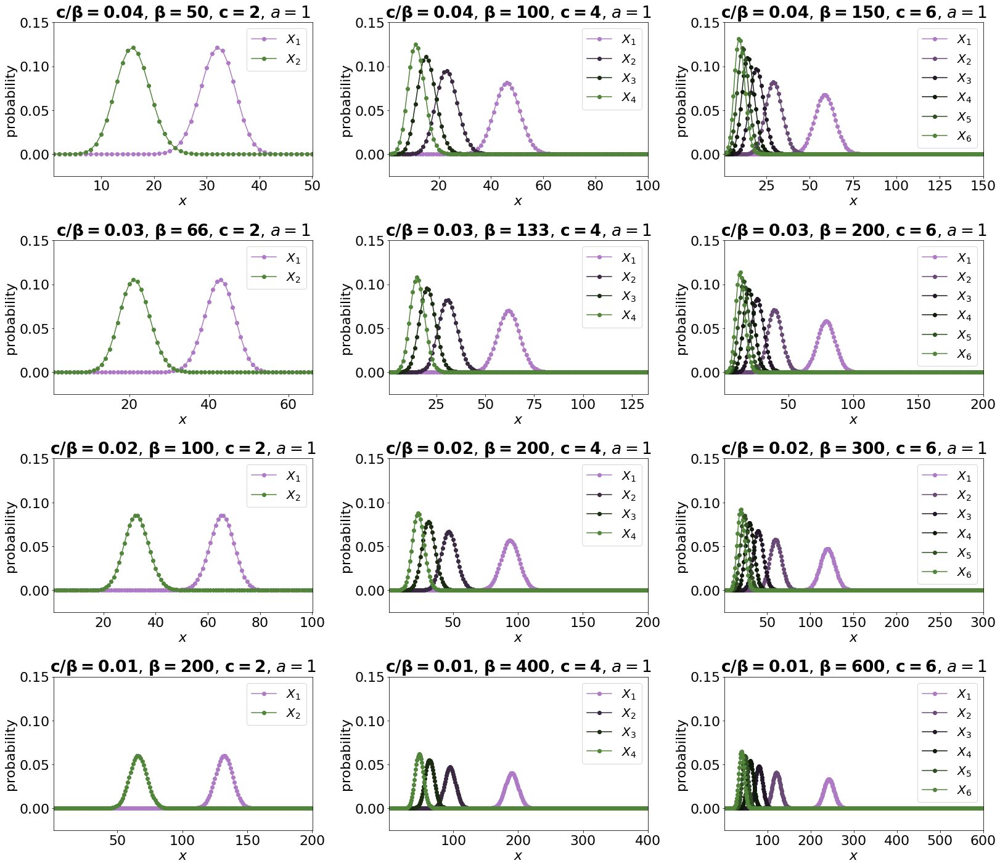

In [4]:
ratios = [0.04,0.03,0.02,0.01]
fig, ax = plt.subplots(len(ratios),3,figsize=(23,20))
c_examples_vect = [2,4,6]

for jj, rr in enumerate(ratios):
    beta_examples_vect = [int(i/rr) for i in c_examples_vect]

    for ii, cc in enumerate(c_examples_vect):
        a_example = 1
        c_example = cc
        beta_example = beta_examples_vect[ii]
        pmf_zipf, cdf_zipf = wf20.zipf(range(1,c_example+1),a_example)

        # define colormap given a color
        color = '#AF7AC5'
        match_hex = re.search(r'^#(?:[0-9a-fA-F]{3}){1,2}$', color)
        if not match_hex:
            try:
                color = colors_hex[color]
            except:
                print('Color '+str(color)+' not available. Try converting it to hexadecimal. Using default color...')
                color = colors_hex['red']
        color_complement = lp.get_complementary(color)
        c_conv = cl.ColorConverter().to_rgb
        c_cmap = lp.make_colormap([c_conv(color), c_conv('black'), 0.50, c_conv('black'), c_conv(color_complement)])
        index_color = c_cmap(np.linspace(0,1,c_example))

        binomial_probs = {}
        x_vals = range(1,beta_example+1)
        for i, j in enumerate(range(1,c_example+1)):
            bin_probs = []
            for x in x_vals:
                bin_probs.append(wf20.binomial_wf(beta_example,x,pmf_zipf[i],c_example))
            binomial_probs[j] = bin_probs

        for i, j in enumerate(binomial_probs.keys()):
            ax[jj,ii].plot(x_vals,binomial_probs[j],'.-',color=index_color[i],markersize=12,label=r'$X_{'+str(j)+'}$')
        ax[jj,ii].set_xlabel(r'$x$')
        ax[jj,ii].set_ylabel('probability')
        ax[jj,ii].set_xlim(1-0.025,beta_example+0.025)
        ax[jj,ii].set_ylim(0-0.025,0.15)
        ax[jj,ii].set_title(r'$\mathbf{c/\beta='+str(round(rr,4))+r'}$, $\mathbf{\beta='+str(beta_example)+r'}$, $\mathbf{c='+str(c_example)+r'}$, $a=$'+str(a_example))
        ax[jj,ii].legend(loc=1,fontsize=20)
plt.tight_layout()
plt.savefig('figures/MAIN-1/mpt-distributions_ratio-constant.png')
plt.show()

#### 1.1.3. Binomial Overlaps.

In [5]:
def overlap(interval1, interval2):
    return max(0, min(max(interval1), max(interval2)) - max(min(interval1), min(interval2)))

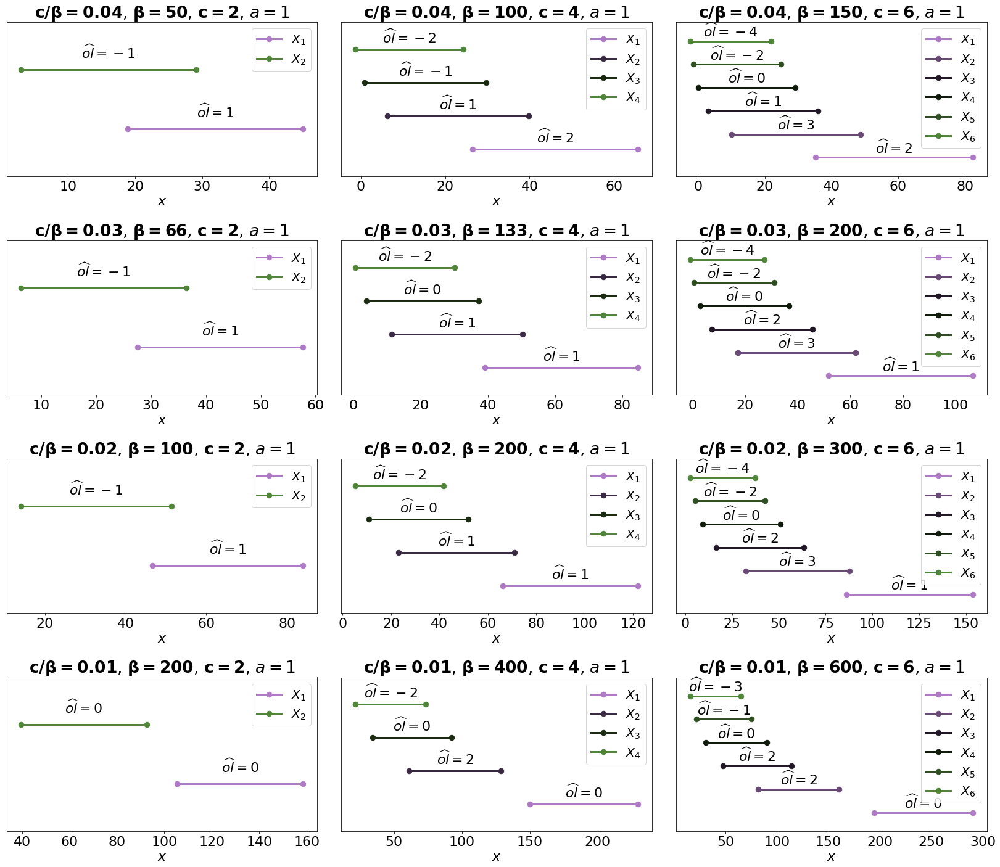

In [6]:
ratios = [0.04,0.03,0.02,0.01]
fig, ax = plt.subplots(len(ratios),3,figsize=(23,20))
c_examples_vect = [2,4,6]

for jj, rr in enumerate(ratios):
    beta_examples_vect = [int(i/rr) for i in c_examples_vect]

    for ii, cc in enumerate(c_examples_vect):
        a_example = 1
        c_example = cc
        beta_example = beta_examples_vect[ii]
        pmf_zipf, cdf_zipf = wf20.zipf(range(1,c_example+1),a_example)

        # define colormap given a color
        color = '#AF7AC5'
        match_hex = re.search(r'^#(?:[0-9a-fA-F]{3}){1,2}$', color)
        if not match_hex:
            try:
                color = colors_hex[color]
            except:
                print('Color '+str(color)+' not available. Try converting it to hexadecimal. Using default color...')
                color = colors_hex['red']
        color_complement = lp.get_complementary(color)
        c_conv = cl.ColorConverter().to_rgb
        c_cmap = lp.make_colormap([c_conv(color), c_conv('black'), 0.50, c_conv('black'), c_conv(color_complement)])
        index_color = c_cmap(np.linspace(0,1,c_example))

        binomial_probs = {}
        x_vals = range(1,beta_example+1)
        for i, j in enumerate(range(1,c_example+1)):
            bin_probs = []
            for x in x_vals:
                bin_probs.append(wf20.binomial_wf(beta_example,x,pmf_zipf[i],c_example))
            binomial_probs[j] = bin_probs
        
        binomial_probs_meansstd = {}
        binomial_probs_ci = {}
        for i, j in enumerate(binomial_probs.keys()):
            mean = (beta_example-c_example)*pmf_zipf[i]
            std = np.sqrt((beta_example-c_example)*pmf_zipf[i]*(1-pmf_zipf[i]))
            binomial_probs_meansstd[j] = (mean,std)
            binomial_probs_ci[j] = (mean-4*std,mean+4*std) # 99.7% confidence interval
            
        number_of_overlaps = {}
        for i, j in enumerate(binomial_probs.keys()):
            noo = 0
            noo_plus = 0
            noo_minus = 0
            for i_i, j_j in enumerate(binomial_probs.keys()):
                if j != j_j:
                    if overlap(binomial_probs_ci[j],binomial_probs_ci[j_j]) > 0:
                        if j < j_j:
                            noo += 1
                        elif j > j_j:
                            noo -= 1
            number_of_overlaps[j] = noo
            
        for i, j in enumerate(binomial_probs.keys()):
            ax[jj,ii].plot(binomial_probs_ci[j],(j,j),'.-',linewidth=3,color=index_color[i],markersize=17,label=r'$X_{'+str(j)+'}$')
            ax[jj,ii].annotate(r'$\widehat{ol}='+str(number_of_overlaps[j])+'$',xy=(binomial_probs_meansstd[j][0],j),xytext=(binomial_probs_meansstd[j][0],j+0.2),ha='center')
        ax[jj,ii].set_xlabel(r'$x$')
        ax[jj,ii].set_yticks([])
        ax[jj,ii].set_ylim(1-0.80,c_example+0.80)
        ax[jj,ii].set_title(r'$\mathbf{c/\beta='+str(round(rr,4))+r'}$, $\mathbf{\beta='+str(beta_example)+r'}$, $\mathbf{c='+str(c_example)+r'}$, $a=$'+str(a_example))
        ax[jj,ii].legend(loc=1,fontsize=20)
plt.tight_layout()
plt.savefig('figures/MAIN-1/mpt-distributions_ratio-constant_intervals-and-overlaps.png')
plt.show()

A discrete binomial distribution can be approximated using a normal distribution with mean $(N-c)p$ and variance $(N-c)p(1-p)$. Approximately 100% of the distribution lies within the interval $(N-c)p \pm 4\sqrt{(N-c)p(1-p)}$. This interval is the segment where a word is most likely to have a frequency when randomly sampled. These segments can overlap and likely that two words can change ranks. We count these number of overlaps by computing the length of the segment overlaps.

First, compute the length of the overlap of any two segments of word $w$ and word $v$. 

$$l_{wv}(\beta,p_w,p_v) = min\left( \beta p_w + 4\sqrt{\beta p_w(1-p_w)} , \beta p_v + 4\sqrt{\beta p_v(1-p_v)} \right) - max\left( \beta p_w - 4\sqrt{\beta p_w(1-p_w)} , \beta p_v - 4\sqrt{\beta p_v(1-p_v} \right)$$

Next, count the number of words that overlapped with word w.

$$ol_w(\beta,Zipf(a,c)) = \sum_{v=1,v \ne w}^c
\begin{cases} 
      1 & l_{wv}(\beta,p_w,p_v) > 0 \\
      0 & otherwise 
\end{cases}$$

Note that $\sum_{w=1}^c p_w = 1$ where the values of $p_w$ came from the Zipf distribution with shape parameter $a$ and number of vocabulary words $c$.

If you have $c$ vocabulary words, the end result is that you will have $c$ values of $ol_w$.

Question: At what $w$ would the $ol_w$ value become non-zero (assume that the Zipf shape parameter is $a = 1$)?

We compute this algorithmically.

In [7]:
def l(beta,c,pw,pv,z=4):
    N = beta-c
    mu_w = N*pw
    sigma_w = N*pw*(1-pw)
    mu_v = N*pv
    sigma_v = N*pv*(1-pv)
    return min(mu_w+z*np.sqrt(sigma_w),mu_v+z*np.sqrt(sigma_v)) - max(mu_w-z*np.sqrt(sigma_w),mu_v-z*np.sqrt(sigma_v))

def ol(w,beta,c,p_vect):
    ol_sum = 0
    for i, v in enumerate(p_vect):
        if (w-1) != i:
            if l(beta,c,p_vect[w-1],p_vect[i]) > 0:
                if w-1 < i:
                    ol_sum += 1
                elif w-1 > i:
                    ol_sum -= 1
    return ol_sum

In [8]:
# example 1
a_example = 1
c_example = 6
beta_example = 600
pmf_zipf, cdf_zipf = wf20.zipf(range(1,c_example+1),a_example)

# compute overlap vector
ol_vect = []
for w in range(1,c_example+1):
    ol_vect.append(ol(w,beta_example,c_example,pmf_zipf))

for i, j in enumerate(ol_vect):
    print('Rank',i+1,', ol',j)
print()    
    
# find first non-zero entry in the overlap vector
first_nonzero_word = None
if all(i == 0 for i in ol_vect) == False: # check if there are overlaps
    first_nonzero_word = next((i for i, x in enumerate(ol_vect) if x), None) + 1
    
print(first_nonzero_word)

Rank 1 , ol 0
Rank 2 , ol 2
Rank 3 , ol 2
Rank 4 , ol 0
Rank 5 , ol -1
Rank 6 , ol -3

2


For $c=6$ and $\beta=600$, we would expect to see rank changes from the 2nd initially ranked word to all other lower ranked words.

In [9]:
# example 2
a_example = 1
c_example = 1000
beta_example = 1e5
pmf_zipf, cdf_zipf = wf20.zipf(range(1,c_example+1),a_example)

# compute overlap vector
ol_vect = []
for w in range(1,c_example+1)[0:1000]:
    ol_vect.append(ol(w,beta_example,c_example,pmf_zipf))
    
# find first non-zero entry in the overlap vector
first_nonzero_word = None
if all(i == 0 for i in ol_vect) == False: # check if there are overlaps
    first_nonzero_word = next((i for i, x in enumerate(ol_vect) if x), None) + 1
    
print(first_nonzero_word)

6


For $c=1000$ and $\beta=100000$, we would expect to see rank changes from the 7th initially ranked word to all other lower ranked words.

In [10]:
# example 2
a_example = 1
c_example = 1000
beta_example = 1e8
pmf_zipf, cdf_zipf = wf20.zipf(range(1,c_example+1),a_example)

# compute overlap vector
ol_vect = []
for w in range(1,c_example+1):
    ol_vect.append(ol(w,beta_example,c_example,pmf_zipf))
    
# find first non-zero entry in the overlap vector
first_nonzero_word = None
if all(i == 0 for i in ol_vect) == False: # check if there are overlaps
    first_nonzero_word = next((i for i, x in enumerate(ol_vect) if x), None) + 1
    
print(first_nonzero_word)

59


For $c=1000$ and $\beta=100000000$, we would expect to see rank changes from the 72nd initially ranked word to all other lower ranked words.

Overlap counts as a function of $c$ and $\beta$.

In [11]:
from tqdm import tqdm

a_example = 1
beta_vect = np.linspace(1000, 100000, 10, endpoint=True, dtype=int)

10it [00:00, 668.39it/s]
10it [00:00, 159.09it/s]
10it [00:00, 39.09it/s]
10it [00:01,  9.79it/s]


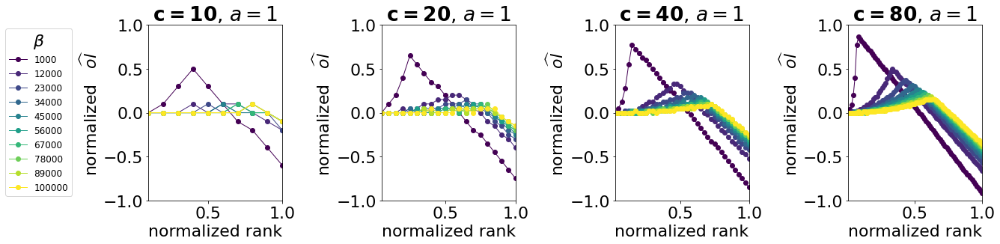

In [12]:
c_vect = [10,20,40,80]
c_vect_ax = [(0,0),(0,1),(0,2),(0,3)]

max_ol = {}
max_rank = {}

fig, ax = plt.subplots(1,4,figsize=(20,5))
for k, c in enumerate(c_vect):

    c_example = c
    
    max_ol[c_example] = {}
    max_rank[c_example] = {}

    ols = {}
    for i, j in tqdm(enumerate(beta_vect)):
        beta_example = j
        pmf_zipf, cdf_zipf = wf20.zipf(range(1,c_example+1),a_example)

        # compute overlap vector
        ol_vect = []
        for w in range(1,c_example+1):
            ol_vect.append(ol(w,beta_example,c_example,pmf_zipf)/c_example)
        ols[j] = ol_vect
        
        max_ol[c_example][beta_example] = np.max(ol_vect)
        max_rank[c_example][beta_example] = np.argmax(ol_vect)+1
        
    ols_df = pd.DataFrame(ols,index=[r_i/c_example for r_i in range(1,c_example+1)])
    
    cmap = cm.get_cmap('viridis')

    ols_df.plot(ax=ax[k],cmap=cmap,linewidth=1,linestyle='-', marker='o')

    ax[k].legend(loc=3,fontsize=12,title=r'$\beta$',bbox_to_anchor=(-1.10,0))
    if k != 0:
        ax[k].legend().set_visible(False)
    ax[k].set_xlabel('normalized rank')
    ax[k].set_xlim(1/c_example,1)
    ax[k].set_ylabel('normalized   '+r'$\widehat{ol}$')
    ax[k].set_ylim(-1,1)
    ax[k].set_title(r'$\mathbf{c='+str(c_example)+r'}$, $a=$'+str(a_example))

plt.tight_layout()
plt.savefig('figures/MAIN-1/word-by-overlap.png',bbox_inches='tight')
plt.show()

In [13]:
def critical_function(X,q1,q2,q3):
    c, beta = X
    f = (c*(beta**2) + q1*beta) / ((beta**2) + q2*beta + q3)
    
    return f

critical_function((80,1000),2/3,10000,2/3)

7.272787438012883

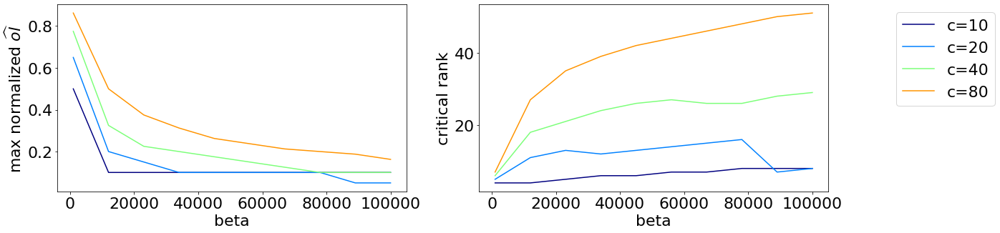

In [14]:
cmap = cm.get_cmap('jet')
cols = [cmap(i/len(max_ol.keys())) for i in range(0,len(max_ol.keys()))]

fig, ax = plt.subplots(1,2,figsize=(20,5))

df_1 = pd.DataFrame(max_ol)
for i_i, i in enumerate(df_1.columns):
    ax[0].plot(df_1[i].index,df_1[i],'-',color=cols[i_i],label='c='+str(i))
ax[0].legend().set_visible(False)
ax[0].set_ylabel('max normalized '+r'$\widehat{ol}$')
ax[0].set_xlabel('beta')

df_2 = pd.DataFrame(max_rank)
for i_i, i in enumerate(df_2.keys()):
    ax[1].plot(df_2[i].index,df_2[i],'-',color=cols[i_i],label='c='+str(i))
ax[1].legend(loc=0,bbox_to_anchor=(1.50,1))
ax[1].set_ylabel('critical rank')
ax[1].set_xlabel('beta')

plt.tight_layout()
plt.show()

In [15]:
x = list(df_2.columns)
y = list(df_2.index)
x_all, y_all = np.meshgrid(x,y)
x_all = x_all.flatten()
y_all = y_all.flatten()
z_all = df_2.values.flatten()

popt, pcov = sc.optimize.curve_fit(critical_function, (x_all,y_all), z_all)
popt

array([ 349154.88622436,   49857.94641361, 9947624.85614471])

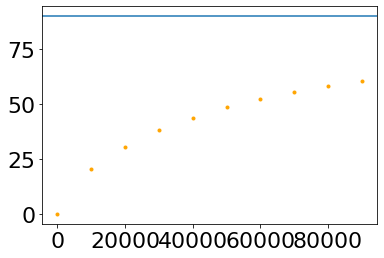

In [16]:
c = 90

for i in range(0,100000,10000):
    plt.plot(i,critical_function((c,i),popt[0],popt[1],popt[2]),'.',color='orange')
#plt.plot(df_2[c].index,df_2[c].values)
plt.axhline(c)
plt.show()

100%|██████████| 1000/1000 [00:08<00:00, 115.82it/s]


(-1.0, 1.0)

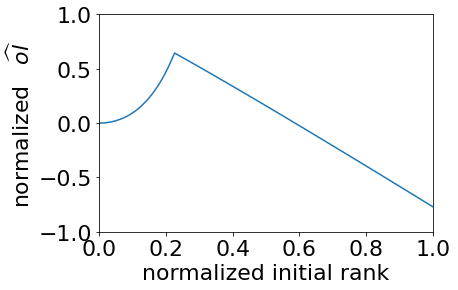

In [17]:
c_example = 1000
beta_example = 1e5
a_example = 1

pmf_zipf, cdf_zipf = wf20.zipf(range(1,c_example+1),a_example)

# compute overlap vector
ol_vect = []
for w in tqdm(range(1,c_example+1)):
    ol_vect.append(ol(w,beta_example,c_example,pmf_zipf)/c_example)

rank_vect = [i/c_example for i in range(1,c_example+1)]
plt.plot(rank_vect,ol_vect)
plt.xlabel('normalized initial rank')
plt.xlim(0,1)
plt.ylabel('normalized   '+r'$\widehat{ol}$')
plt.ylim(-1,1)

100%|██████████| 1000/1000 [00:09<00:00, 110.94it/s]


(-1.0, 1.0)

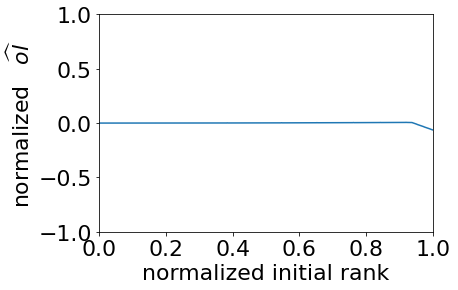

In [18]:
c_example = 1000
beta_example = 1e8
a_example = 1

pmf_zipf, cdf_zipf = wf20.zipf(range(1,c_example+1),a_example)

# compute overlap vector
ol_vect = []
for w in tqdm(range(1,c_example+1)):
    ol_vect.append(ol(w,beta_example,c_example,pmf_zipf)/c_example)
    
rank_vect = [i/c_example for i in range(1,c_example+1)]
plt.plot(rank_vect,ol_vect)
plt.xlabel('normalized initial rank')
plt.xlim(0,1)
plt.ylabel('normalized   '+r'$\widehat{ol}$')
plt.ylim(-1,1)

#### 1.1.4 WF Simulations Example Compared Against the Binomial Probabilities.

In [19]:
seed_vect = range(0,1000) # 1000 simulations

simulating multiple wf_c4_a1_alpha0_beta200_T109...
Done in 1.82 minutes
simulating multiple wf_c4_a1_alpha0.01_beta200_T109...
Done in 1.87 minutes
simulating multiple wf_c4_a1_alpha0.03_beta200_T109...
Done in 1.96 minutes


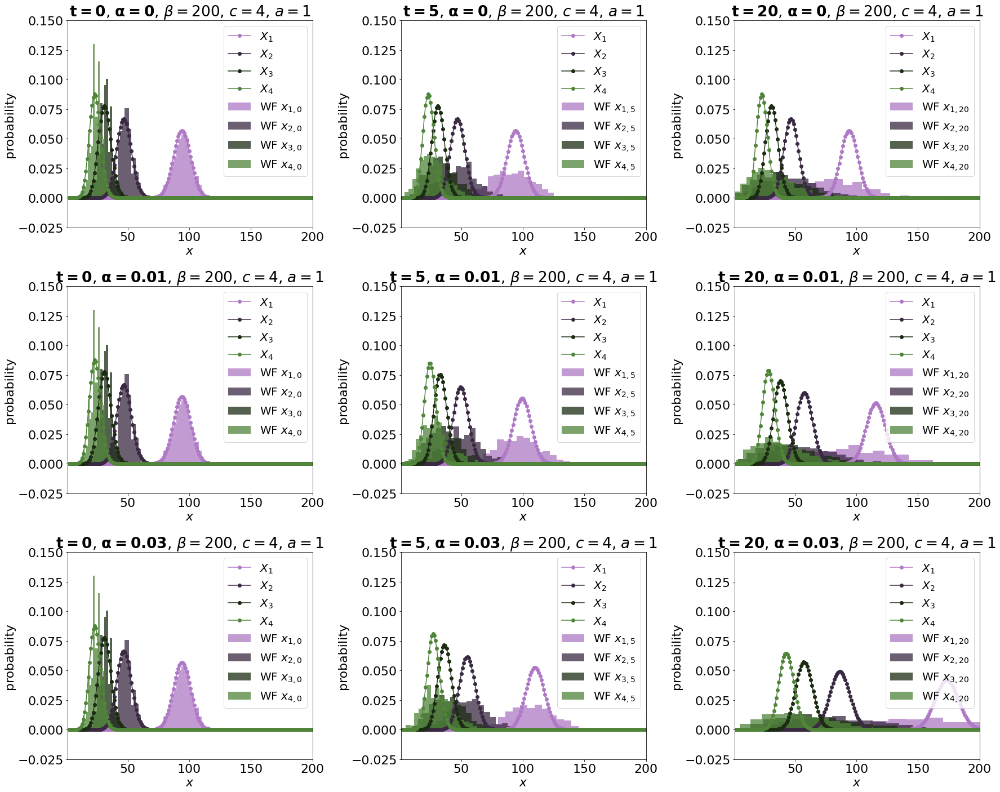

In [20]:
alpha_vect = [0,0.01,0.03]
t_time_vect = [0,5,20]

fig, ax = plt.subplots(len(alpha_vect),len(t_time_vect),figsize=(25,20))
for alpha_index, alpha_val in enumerate(alpha_vect):
    c = 4 # vocabulary words
    a = 1 # Zipf parameter
    alpha = alpha_val # corpus size rate of change
    beta = 200 # initial corpus size
    T = 109 # total time elapsed (years)
    color_wf = '#F1C40F'

    # sampling of the next time step is the word proportions from the current time step
    timer_start = time.process_time()
    print('simulating multiple wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'...')
    R_vect = []
    P_vect = []
    Z_vect = []
    RK_vect = []
    for k in seed_vect:
        R, P, Z, S, N = wf20.wright_fisher(c,a,alpha,beta,0,0,T,[],[],0,set_seed=k,steady=False)
        R_vect.append(R)
        P_vect.append(P)
        Z_vect.append(Z)

        # compute the ranks of the simulation
        t_vect = P.columns
        ranks = pd.DataFrame(np.zeros(P.shape,dtype=int),index=P.index,columns=P.columns)
        olist = pd.DataFrame(np.zeros(P.shape,dtype=str),index=range(1,P.shape[0]+1),columns=P.columns)
        for t in t_vect:
            val = lc.return_ranks(P[t])
            for ii, jj in val.items():
                ranks[t][ii] = jj
                olist[t][jj] = ii
        dranks = lc.generate_delta(ranks)
        rc_la = {'drank-variance':{},'drank-sum':{}}
        drank_sum = np.sum(dranks,axis=1)
        drank_var = np.var(dranks,axis=1)
        RK = {'ranks':ranks,'dranks':dranks,'olist':olist,'drank-variance':drank_var,'drank-sum':drank_sum}
        RK_vect.append(RK)
    timer_end = time.process_time()
    time_elapsed = timer_end - timer_start
    print('Done in '+str(round(time_elapsed/60,2))+' minutes')


    for tt_i, tt in enumerate(t_time_vect):
        t_R_vect = {}
        for i  in range(1,c+1):
            R_vect_temp = []
            for k in seed_vect:
                R_vect_temp.append(R_vect[k][tt][i])
            t_R_vect[i] = R_vect_temp
        t_R_vect = pd.DataFrame(t_R_vect)

        a_example = a
        c_example = c
        beta_example = beta
        alpha_example = alpha
        pmf_zipf, cdf_zipf = wf20.zipf(range(1,c_example+1),a_example)
        
        # compute corpus size at given time t
        N_t = wf20.corpus_size(tt,alpha_example,beta_example)

        # define colormap given a color
        color = '#AF7AC5'
        match_hex = re.search(r'^#(?:[0-9a-fA-F]{3}){1,2}$', color)
        if not match_hex:
            try:
                color = colors_hex[color]
            except:
                print('Color '+str(color)+' not available. Try converting it to hexadecimal. Using default color...')
                color = colors_hex['red']
        color_complement = lp.get_complementary(color)
        c_conv = cl.ColorConverter().to_rgb
        c_cmap = lp.make_colormap([c_conv(color), c_conv('black'), 0.50, c_conv('black'), c_conv(color_complement)])
        index_color = c_cmap(np.linspace(0,1,c_example))
        
        binomial_probs = {}
        x_vals = range(1,beta_example+1)
        for i, j in enumerate(range(1,c_example+1)):
            bin_probs = []
            for x in x_vals:
                #bin_probs.append(wf20.binomial_wf(beta_example,x,pmf_zipf[i],c_example))
                bin_probs.append(wf20.binomial_wf(N_t,x,pmf_zipf[i],c_example))
            binomial_probs[j] = bin_probs

        for i, j in enumerate(binomial_probs.keys()):
            ax[alpha_index,tt_i].hist(t_R_vect[j],bins=20,density=True,color=index_color[i],alpha=0.75,label=r'WF $x_{'+str(j)+','+str(tt)+'}$')
            ax[alpha_index,tt_i].plot(x_vals,binomial_probs[j],'.-',color=index_color[i],alpha=1,markersize=12,label=r'$X_{'+str(j)+'}$')
        ax[alpha_index,tt_i].set_xlabel(r'$x$')
        ax[alpha_index,tt_i].set_ylabel('probability')
        ax[alpha_index,tt_i].set_xlim(1-0.025,beta_example+0.025)
        ax[alpha_index,tt_i].set_ylim(0-0.025,0.15)
        ax[alpha_index,tt_i].set_title(r'$\mathbf{t='+str(tt)+r'}$, $\mathbf{\alpha='+str(alpha_example)+r'}$, $\beta='+str(beta_example)+r'$, $c='+str(c_example)+r'$, $a='+str(a_example)+'$')
        ax[alpha_index,tt_i].legend(loc=0,fontsize=20)
    
plt.tight_layout()
plt.savefig('figures/MAIN-1/mpt-distributions-vs-wf-sims_t-varies_alpha-varies_c'+str(c)+'_a'+str(a)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

### 1.2. WF Simulations.

In [21]:
seed_vect = range(0,100) # 100 simulations

#### 1.2.1. Time-series Visualizations $c = 2$ with Varying $\beta$.

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


simulating multiple wf_c2_a1_alpha0.01_beta100_T109...
Done in 0.14 minutes
simulating multiple wf_c2_a1_alpha0.01_beta1000_T109...
Done in 0.19 minutes
simulating multiple wf_c2_a1_alpha0.01_beta10000_T109...
Done in 0.27 minutes
simulating multiple wf_c2_a1_alpha0.01_beta100000_T109...
Done in 1.17 minutes


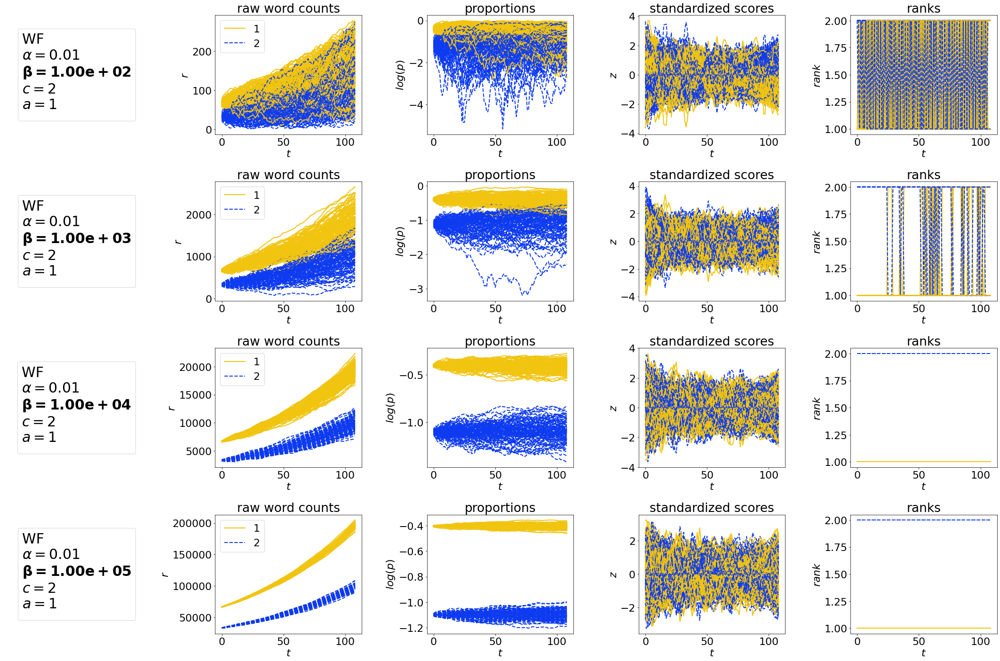

In [22]:
beta_vect = [100,1000,10000,100000]

c = 2 # vocabulary words
a = 1 # Zipf parameter
alpha = 0.01 # corpus size rate of change
T = 109 # total time elapsed (years)

color_wf = '#F1C40F'

fig, ax = plt.subplots(len(beta_vect),5,figsize=(30,20))
for i, j in enumerate(beta_vect):
    ax[i,0].set_axis_off()
    ax[i,0].legend(loc=10,
                   title='WF'+'\n'+r'$\alpha=$'+str(alpha)+'\n'+r'$\mathbf{\beta='+"{:.2e}".format(j)+r'}$'+'\n'+r'$c=$'+str(c)+'\n'+r'$a=$'+str(a),
                   title_fontsize=30)

for bvi, bv in enumerate(beta_vect):

    beta = bv # initial corpus size

    # sampling of the next time step is the word proportions from the current time step
    timer_start = time.process_time()
    print('simulating multiple wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'...')
    R_vect = []
    P_vect = []
    Z_vect = []
    RK_vect = []
    for k in seed_vect:
        R, P, Z, S, N = wf20.wright_fisher(c,a,alpha,beta,0,0,T,[],[],0,set_seed=k,steady=False)
        R_vect.append(R)
        P_vect.append(P)
        Z_vect.append(Z)

        # compute the ranks of the simulation
        t_vect = P.columns
        ranks = pd.DataFrame(np.zeros(P.shape,dtype=int),index=P.index,columns=P.columns) 
        olist = pd.DataFrame(np.zeros(P.shape,dtype=str),index=range(1,P.shape[0]+1),columns=P.columns)
        for t in t_vect:
            val = lc.return_ranks(P[t])
            for ii, jj in val.items():
                ranks[t][ii] = jj
                olist[t][jj] = ii
        dranks = lc.generate_delta(ranks)
        rc_la = {'drank-variance':{},'drank-sum':{}}
        drank_sum = np.sum(dranks,axis=1)
        drank_var = np.var(dranks,axis=1)
        RK = {'ranks':ranks,'dranks':dranks,'olist':olist,'drank-variance':drank_var,'drank-sum':drank_sum}
        RK_vect.append(RK)
    timer_end = time.process_time()
    time_elapsed = timer_end - timer_start
    print('Done in '+str(round(time_elapsed/60,2))+' minutes')

    WF_example_words = list(range(1,c+1))

    # FIGURE: selected time series
    for k, j in enumerate(seed_vect):
        if k == 0:
            lp.time_series_plot(data=R_vect[k].loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$r$',title='raw word counts',color='#F1C40F',
                       legend=True,annotation=False,ax=ax[bvi,1])
            lp.time_series_plot(data=np.log(P_vect[k].loc[WF_example_words,:].T),xlabel=r'$t$',ylabel=r'$log(p)$',title='proportions',color='#F1C40F',
                       legend=False,annotation=False,ax=ax[bvi,2])
            lp.time_series_plot(data=Z_vect[k].loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$z$',title='standardized scores',color='#F1C40F',
                       legend=False,annotation=False,ax=ax[bvi,3])
            lp.time_series_plot(data=RK_vect[k]['ranks'].loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$rank$',title='ranks',color='#F1C40F',
                       legend=False,annotation=False,ax=ax[bvi,4])
            ax[bvi,1].legend(loc=0,fontsize=22)
        else:
            lp.time_series_plot(data=R_vect[k].loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$r$',title='raw word counts',color='#F1C40F',
                       legend=False,annotation=False,ax=ax[bvi,1])
            lp.time_series_plot(data=np.log(P_vect[k].loc[WF_example_words,:].T),xlabel=r'$t$',ylabel=r'$log(p)$',title='proportions',color='#F1C40F',
                       legend=False,annotation=False,ax=ax[bvi,2])
            lp.time_series_plot(data=Z_vect[k].loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$z$',title='standardized scores',color='#F1C40F',
                       legend=False,annotation=False,ax=ax[bvi,3])
            lp.time_series_plot(data=RK_vect[k]['ranks'].loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$rank$',title='ranks',color='#F1C40F',
                       legend=False,annotation=False,ax=ax[bvi,4])

plt.tight_layout()
plt.savefig('figures/MAIN-1/multiple-time-series-rpz-sims_wf_beta-varies_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_T'+str(T)+'.png')
plt.show()

#### 1.2.2. Time-series Visualizations $\beta = 10000$ with Varying $c$.

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


simulating multiple wf_c2_a1_alpha0.01_beta10000_T109...
Done in 0.23 minutes
simulating multiple wf_c3_a1_alpha0.01_beta10000_T109...
Done in 0.25 minutes
simulating multiple wf_c4_a1_alpha0.01_beta10000_T109...
Done in 0.28 minutes
simulating multiple wf_c5_a1_alpha0.01_beta10000_T109...
Done in 0.3 minutes


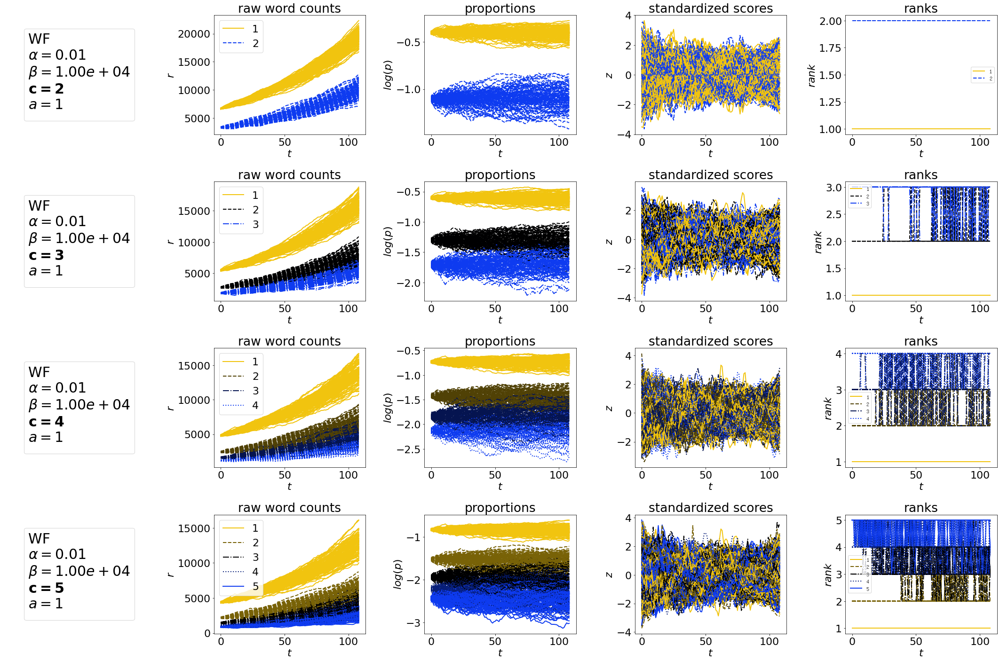

In [23]:
c_vect = [2,3,4,5]

a = 1 # Zipf parameter
alpha = 0.01 # corpus size rate of change
beta = 10000 # initial corpus size
T = 109 # total time elapsed (years)

color_wf = '#F1C40F'

fig, ax = plt.subplots(len(c_vect),5,figsize=(30,20))
for i, j in enumerate(c_vect):
    ax[i,0].set_axis_off()
    ax[i,0].legend(loc=10,
                   title='WF'+'\n'+r'$\alpha=$'+str(alpha)+'\n'+r'$\beta='+"{:.2e}".format(beta)+r'$'+'\n'+r'$\mathbf{c='+str(j)+r'}$'+'\n'+r'$a=$'+str(a),
                   title_fontsize=30)

for cvi, cv in enumerate(c_vect):

    c = cv # vocabulary words

    # sampling of the next time step is the word proportions from the current time step
    timer_start = time.process_time()
    print('simulating multiple wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'...')
    R_vect = []
    P_vect = []
    Z_vect = []
    RK_vect = []
    for k in seed_vect:
        R, P, Z, S, N = wf20.wright_fisher(c,a,alpha,beta,0,0,T,[],[],0,set_seed=k,steady=False)
        R_vect.append(R)
        P_vect.append(P)
        Z_vect.append(Z)

        # compute the ranks of the simulation
        t_vect = P.columns
        ranks = pd.DataFrame(np.zeros(P.shape,dtype=int),index=P.index,columns=P.columns) 
        olist = pd.DataFrame(np.zeros(P.shape,dtype=str),index=range(1,P.shape[0]+1),columns=P.columns)
        for t in t_vect:
            val = lc.return_ranks(P[t])
            for ii, jj in val.items():
                ranks[t][ii] = jj
                olist[t][jj] = ii
        dranks = lc.generate_delta(ranks)
        rc_la = {'drank-variance':{},'drank-sum':{}}
        drank_sum = np.sum(dranks,axis=1)
        drank_var = np.var(dranks,axis=1)
        RK = {'ranks':ranks,'dranks':dranks,'olist':olist,'drank-variance':drank_var,'drank-sum':drank_sum}
        RK_vect.append(RK)
    timer_end = time.process_time()
    time_elapsed = timer_end - timer_start
    print('Done in '+str(round(time_elapsed/60,2))+' minutes')

    WF_example_words = list(range(1,c+1))

    # FIGURE: selected time series
    for k, j in enumerate(seed_vect):
        if k == 0:
            lp.time_series_plot(data=R_vect[k].loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$r$',title='raw word counts',color='#F1C40F',
                       legend=True,annotation=False,ax=ax[cvi,1])
            lp.time_series_plot(data=np.log(P_vect[k].loc[WF_example_words,:].T),xlabel=r'$t$',ylabel=r'$log(p)$',title='proportions',color='#F1C40F',
                       legend=False,annotation=False,ax=ax[cvi,2])
            lp.time_series_plot(data=Z_vect[k].loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$z$',title='standardized scores',color='#F1C40F',
                       legend=False,annotation=False,ax=ax[cvi,3])
            lp.time_series_plot(data=RK_vect[k]['ranks'].loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$rank$',title='ranks',color='#F1C40F',
                       legend=True,annotation=False,ax=ax[cvi,4])
            ax[cvi,1].legend(loc=0,fontsize=22)
        else:
            lp.time_series_plot(data=R_vect[k].loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$r$',title='raw word counts',color='#F1C40F',
                       legend=False,annotation=False,ax=ax[cvi,1])
            lp.time_series_plot(data=np.log(P_vect[k].loc[WF_example_words,:].T),xlabel=r'$t$',ylabel=r'$log(p)$',title='proportions',color='#F1C40F',
                       legend=False,annotation=False,ax=ax[cvi,2])
            lp.time_series_plot(data=Z_vect[k].loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$z$',title='standardized scores',color='#F1C40F',
                       legend=False,annotation=False,ax=ax[cvi,3])
            lp.time_series_plot(data=RK_vect[k]['ranks'].loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$rank$',title='ranks',color='#F1C40F',
                       legend=False,annotation=False,ax=ax[cvi,4])

plt.tight_layout()
plt.savefig('figures/MAIN-1/multiple-time-series-rpz-sims_wf_c-varies_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

#### 1.2.3. WF Multiple Simulations with Parameter Set $\alpha=0.01$, $\beta=100000$, $c=1000$, and $a=1$.

In [24]:
c = 1000 # vocabulary words
a = 1 # Zipf parameter
alpha = 0.01 # corpus size rate of change
beta = 100000 # initial corpus size
T = 109 # total time elapsed (years)
color_wf = '#F1C40F'

# sampling of the next time step is the word proportions from the current time step
timer_start = time.process_time()
print('simulating multiple wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'...')
R_vect = []
P_vect = []
Z_vect = []
RK_vect = []
for k in seed_vect:
    R, P, Z, S, N = wf20.wright_fisher(c,a,alpha,beta,0,0,T,[],[],0,set_seed=k,steady=False)
    R_vect.append(R)
    P_vect.append(P)
    Z_vect.append(Z)

    # compute the ranks of the simulation
    t_vect = P.columns
    ranks = pd.DataFrame(np.zeros(P.shape,dtype=int),index=P.index,columns=P.columns) 
    olist = pd.DataFrame(np.zeros(P.shape,dtype=str),index=range(1, P.shape[0]+1),columns=P.columns)
    for t in t_vect:
        val = lc.return_ranks(P[t])
        for ii, jj in val.items():
            ranks[t][ii] = jj
            olist[t][jj] = ii
    dranks = lc.generate_delta(ranks)
    rc_la = {'drank-variance':{},'drank-sum':{}}
    drank_sum = np.sum(dranks,axis=1)
    drank_var = np.var(dranks,axis=1)
    RK = {'ranks':ranks,'dranks':dranks,'olist':olist,'drank-variance':drank_var,'drank-sum':drank_sum}
    RK_vect.append(RK)
timer_end = time.process_time()
time_elapsed = timer_end - timer_start
print('Done in '+str(round(time_elapsed/60,2))+' minutes')

simulating multiple wf_c1000_a1_alpha0.01_beta100000_T109...
Done in 19.92 minutes


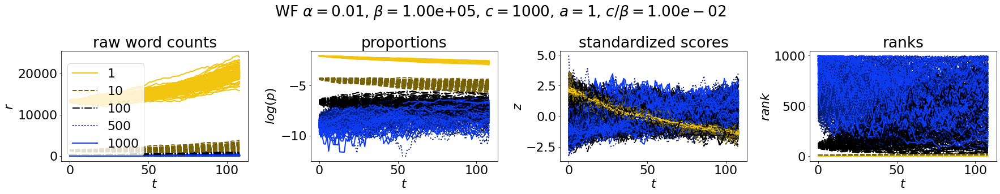

In [25]:
WF_example_words = [1,10,100,500,1000]

# FIGURE: selected time series
fig, ax = plt.subplots(1,4,figsize=(25,5))
for k, j in enumerate(seed_vect):
    if k == 0:
        lp.time_series_plot(data=R_vect[k].loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$r$',title='raw word counts',color='#F1C40F',
                   legend=True,annotation=False,ax=ax[0])
        lp.time_series_plot(data=np.log(P_vect[k].loc[WF_example_words,:].T),xlabel=r'$t$',ylabel=r'$log(p)$',title='proportions',color='#F1C40F',
                   legend=True,annotation=False,ax=ax[1])
        lp.time_series_plot(data=Z_vect[k].loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$z$',title='standardized scores',color='#F1C40F',
                   legend=True,annotation=False,ax=ax[2])
        lp.time_series_plot(data=RK_vect[k]['ranks'].loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$rank$',title='ranks',color='#F1C40F',
                   legend=True,annotation=False,ax=ax[3])
        ax[0].legend(fontsize=22,loc=3)
        ax[1].get_legend().remove()
        ax[2].get_legend().remove()
        ax[3].get_legend().remove()
    else:
        lp.time_series_plot(data=R_vect[k].loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$r$',title='raw word counts',color='#F1C40F',
                   legend=False,annotation=False,ax=ax[0])
        lp.time_series_plot(data=np.log(P_vect[k].loc[WF_example_words,:].T),xlabel=r'$t$',ylabel=r'$log(p)$',title='proportions',color='#F1C40F',
                   legend=False,annotation=False,ax=ax[1])
        lp.time_series_plot(data=Z_vect[k].loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$z$',title='standardized scores',color='#F1C40F',
                   legend=False,annotation=False,ax=ax[2])
        lp.time_series_plot(data=RK_vect[k]['ranks'].loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$rank$',title='ranks',color='#F1C40F',
                   legend=False,annotation=False,ax=ax[3])
plt.suptitle(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+r', $c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$')
plt.tight_layout()
plt.subplots_adjust(top=0.75)
plt.savefig('figures/MAIN-1/multiple-time-series-rpz-sims_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

In [26]:
t = 0

initial_ranks_vect_normed = {}
drank_sum_vect_normed = {}
drank_var_vect_normed = {}
for k, j in enumerate(RK_vect):
    initial_ranks_vect_normed[k] = j['ranks'][t]/len(j['ranks'][t])
    drank_sum_vect_normed[k] = j['drank-sum']/len(j['drank-sum'])
    drank_var_vect_normed[k] = np.log(j['drank-variance']) #j['drank-variance']/np.max(j['drank-variance'])
initial_ranks_vect_normed = pd.DataFrame(initial_ranks_vect_normed)
drank_sum_vect_normed = pd.DataFrame(drank_sum_vect_normed)
drank_var_vect_normed = pd.DataFrame(drank_var_vect_normed)

C:\Users\ajavq\anaconda3\lib\site-packages\pandas\core\arraylike.py:358: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [27]:
WF_example_words = list(range(0,1010,10))
WF_example_words[0] = 1

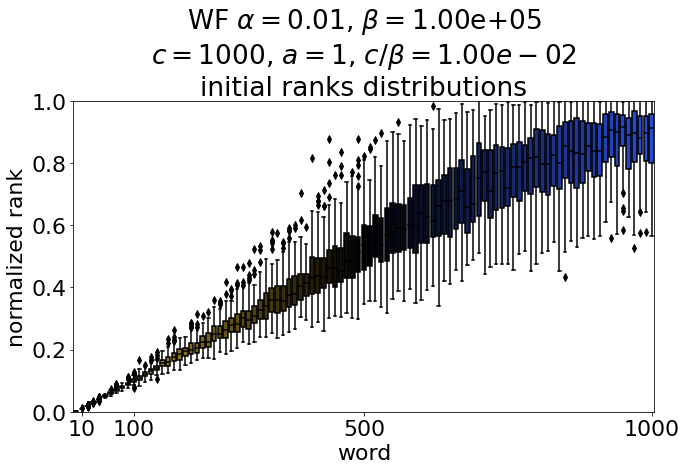

In [28]:
# define colormap given a color
color = '#F1C40F'
match_hex = re.search(r'^#(?:[0-9a-fA-F]{3}){1,2}$', color)
if not match_hex:
    try:
        color = colors_hex[color]
    except:
        print('Color '+str(color)+' not available. Try converting it to hexadecimal. Using default color...')
        color = colors_hex['red']
color_complement = lp.get_complementary(color)
c_conv = cl.ColorConverter().to_rgb
c_cmap = lp.make_colormap([c_conv(color), c_conv('black'), 0.50, c_conv('black'), c_conv(color_complement)])
index_color = c_cmap(np.linspace(0,1,len(WF_example_words)))

fig, ax = plt.subplots(1,1,figsize=(10,7))
sns.boxplot(data=initial_ranks_vect_normed.loc[WF_example_words,:].T,palette=index_color,ax=ax)
ax.set_xlabel('word')
ax.set_xticks([WF_example_words.index(10), WF_example_words.index(100), 
               WF_example_words.index(500), WF_example_words.index(1000)])
ax.set_xticklabels(['10','100','500','1000'])
ax.set_ylabel('normalized rank')
ax.set_ylim(0,1)
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$'+'\n'+'initial ranks distributions')
plt.tight_layout()
plt.savefig('figures/MAIN-1/rc-initial-rank-distribution_list-of-words_wf-sims_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

In [29]:
# compute overlap vector
pmf_zipf, cdf_zipf = wf20.zipf(range(1,c+1),a)
ol_vect = []
for w in tqdm(range(1,c+1)):
    ol_vect.append(ol(w,beta,c,pmf_zipf)/c)

ol_vect_chosen = np.array(ol_vect)[np.array([i-1 for i in WF_example_words])]

100%|██████████| 1000/1000 [00:09<00:00, 106.63it/s]


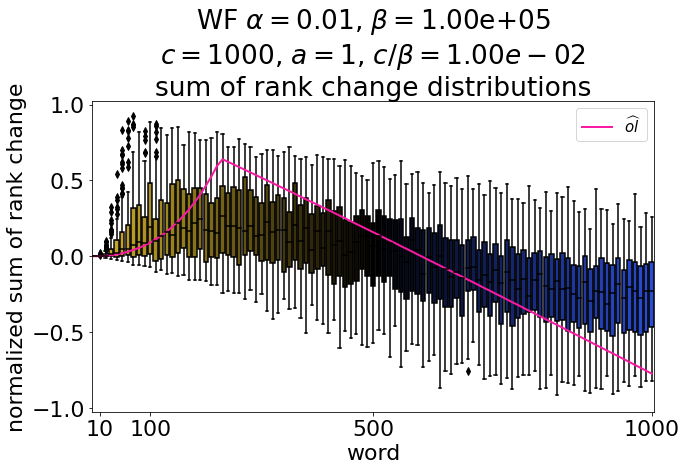

In [30]:
fig, ax = plt.subplots(1,1,figsize=(10,7))
sns.boxplot(data=drank_sum_vect_normed.loc[WF_example_words,:].T,palette=index_color,ax=ax)
ax.plot(ol_vect_chosen,'-',color='#F81AA1',linewidth=2,label=r'$\widehat{ol}$')
ax.legend(loc=0,fontsize=15)
ax.set_xlabel('word')
ax.set_xticks([WF_example_words.index(10), WF_example_words.index(100), 
               WF_example_words.index(500), WF_example_words.index(1000)])
ax.set_xticklabels(['10','100','500','1000'])
ax.set_ylabel('normalized sum of rank change')
ax.set_ylim(-1-0.025,1+0.025)
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$'+'\n'+'sum of rank change distributions')
plt.tight_layout()
plt.savefig('figures/MAIN-1/rc-sum-distribution_list-of-words_wf-sims_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

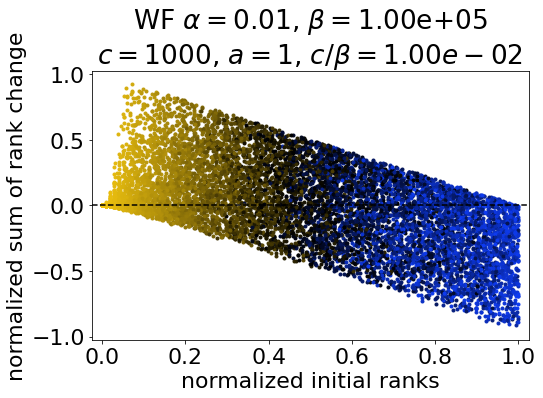

In [31]:
fig, ax = plt.subplots(1,1,figsize=(8,6))
for k, j in enumerate(RK_vect):
    if k == 0:
        for f, i in enumerate(WF_example_words):
            ax.plot(initial_ranks_vect_normed[k][i],drank_sum_vect_normed[k][i],'.',color=index_color[f])
    else:
        for f, i in enumerate(WF_example_words):
            ax.plot(initial_ranks_vect_normed[k][i],drank_sum_vect_normed[k][i],'.',color=index_color[f])
ax.axhline(0,linestyle='--',color='black')
ax.set_xlim(0-0.025,1+0.025)
ax.set_ylim(-1-0.025,1+0.025)
ax.set_xlabel('normalized initial ranks')
ax.set_ylabel('normalized sum of rank change')
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$')
plt.tight_layout()
plt.savefig('figures/MAIN-1/rc-sum_vs_initial-ranks_wf-sims_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

C:\Users\ajavq\anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1183: RuntimeWarning: invalid value encountered in double_scalars
  stats['iqr'] = q3 - q1


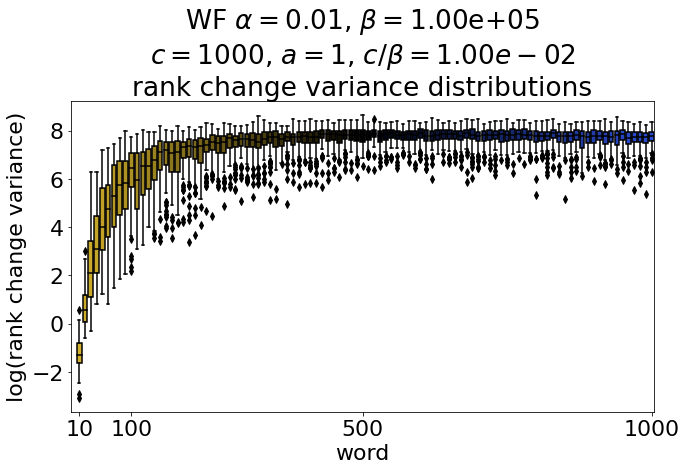

In [32]:
fig, ax = plt.subplots(1,1,figsize=(10,7))
sns.boxplot(data=drank_var_vect_normed.loc[WF_example_words,:].T,palette=index_color,ax=ax)
ax.set_xlabel('word')
ax.set_xticks([WF_example_words.index(10), WF_example_words.index(100), 
               WF_example_words.index(500), WF_example_words.index(1000)])
ax.set_xticklabels(['10','100','500','1000'])
ax.set_ylabel('log(rank change variance)')
#ax.set_ylim(0-0.025,1+0.025)
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$'+'\n'+'rank change variance distributions')
plt.tight_layout()
plt.savefig('figures/MAIN-1/rc-variance-distribution_list-of-words_wf-sims_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

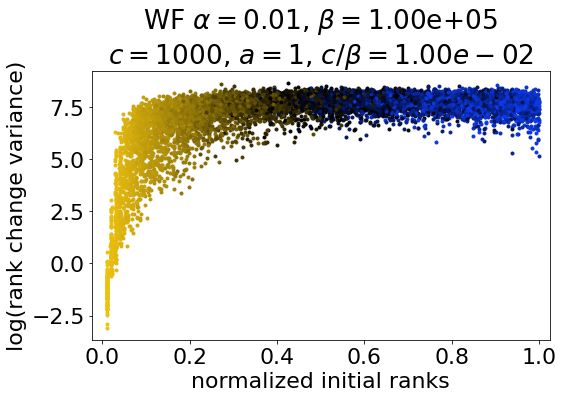

In [33]:
fig, ax = plt.subplots(1,1,figsize=(8,6))
for k, j in enumerate(RK_vect):
    if k == 0:
        for f, i in enumerate(WF_example_words):
            ax.plot(initial_ranks_vect_normed[k][i],drank_var_vect_normed[k][i],'.',color=index_color[f],label=i)
    else:
        for f, i in enumerate(WF_example_words):
            ax.plot(initial_ranks_vect_normed[k][i],drank_var_vect_normed[k][i],'.',color=index_color[f])
ax.set_xlim(0-0.025,1+0.025)
#ax.set_ylim(0-0.025,1+0.025)
ax.set_xlabel('normalized initial ranks')
ax.set_ylabel('log(rank change variance)')
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$')
#ax.legend(fontsize=15, bbox_to_anchor=(1.025, 1), loc='upper left',title='word')
plt.tight_layout()
plt.savefig('figures/MAIN-1/rc-variance_vs_initial-ranks_wf-sims_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

In [34]:
WF_RBO_ttp1 = []
WF_RBO_ttp1_delta = []
WF_RBO_ttp10 = []
WF_RBO_ttp10_delta = []
WF_RBO_initt = []
WF_RBO_initt_delta = []

for k in RK_vect:
    WF_LIST = k['olist']
    t_initial = WF_LIST.columns[0]

    # RBO t -- t+1
    ttp1 = []
    for i in list(WF_LIST.keys())[:-1]:
        ttp1.append(rbo.RankingSimilarity(WF_LIST[i+1].values,WF_LIST[i].values).rbo())
    WF_RBO_ttp1.append(ttp1)

    # delta RBO t -- t+1
    ttp1_delta = []
    for i in range(0,len(ttp1)-1):
        ttp1_delta.append(ttp1[i+1]-ttp1[i])
    WF_RBO_ttp1_delta.append(ttp1_delta)

    # RBO t -- t+10
    ttp10 = []
    for i in list(WF_LIST.keys())[:-10]:
        ttp10.append(rbo.RankingSimilarity(WF_LIST[i+10].values,WF_LIST[i].values).rbo())
    WF_RBO_ttp10.append(ttp1)

    # delta RBO t -- t+10
    ttp10_delta = []
    for i in range(0,len(ttp10)-10):
        ttp10_delta.append(ttp10[i+10]-ttp10[i])
    WF_RBO_ttp10_delta.append(ttp10_delta)

    # RBO 0 -- t
    initt = []
    for i in list(WF_LIST.keys()):
        initt.append(rbo.RankingSimilarity(WF_LIST[t_initial].values,WF_LIST[i].values).rbo())
    WF_RBO_initt.append(initt)

    # delta RBO 0 -- t
    initt_delta = []
    for i in range(0,len(initt)-1):
        initt_delta.append(initt[i+1]-initt[i])
    WF_RBO_initt_delta.append(initt_delta)

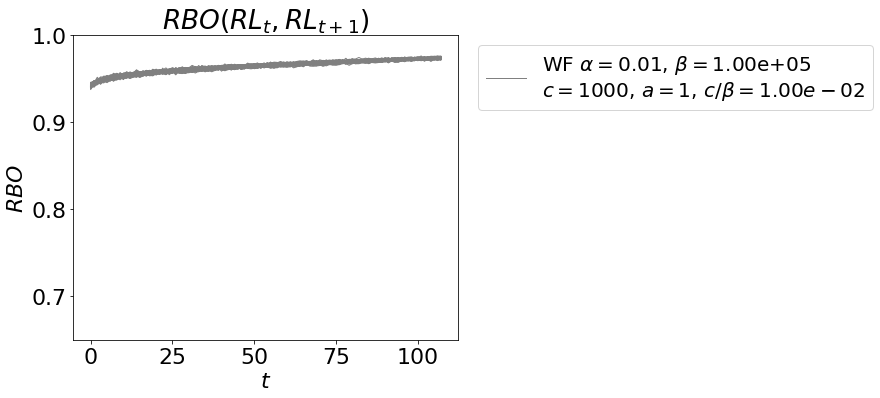

In [35]:
fig, ax = plt.subplots(1,1,figsize=(13,6))
for k, j in enumerate(WF_RBO_ttp1):
    if k == 0:
        ax.plot(j,color='gray',label=r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$',linewidth=1)
    else:
        ax.plot(j,color='gray',linewidth=1)  
ax.set_xlabel(r'$t$')
ax.set_ylabel(r'$RBO$')
ax.set_ylim(0.65,1)
ax.set_title(r'$RBO(RL_{t},RL_{t+1})$')
ax.legend(fontsize=20, bbox_to_anchor=(1.025, 1), loc='upper left')
plt.tight_layout()
plt.savefig('figures/MAIN-1/rbo-ttp1_wf-sims_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

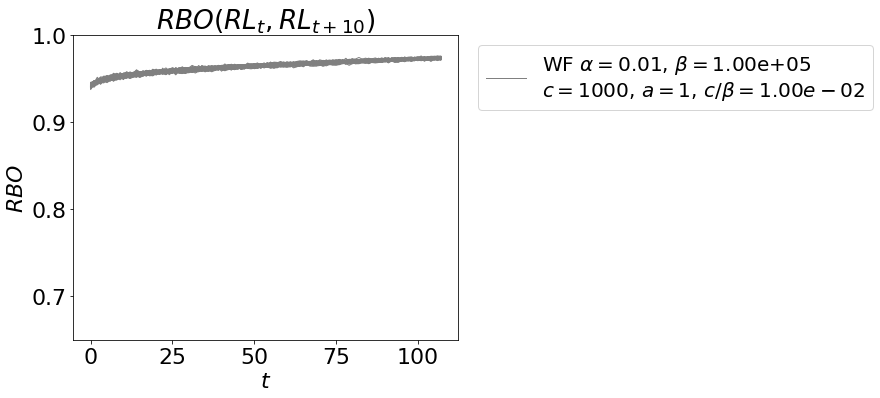

In [36]:
fig, ax = plt.subplots(1,1,figsize=(13,6))
for k, j in enumerate(WF_RBO_ttp10):
    if k == 0:
        ax.plot(j,color='gray',label=r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$',linewidth=1)
    else:
        ax.plot(j,color='gray',linewidth=1)  
ax.set_xlabel(r'$t$')
ax.set_ylabel(r'$RBO$')
ax.set_ylim(0.65,1)
ax.set_title(r'$RBO(RL_{t},RL_{t+10})$')
ax.legend(fontsize=20, bbox_to_anchor=(1.025, 1), loc='upper left')
plt.tight_layout()
plt.savefig('figures/MAIN-1/rbo-ttp10_wf-sims_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

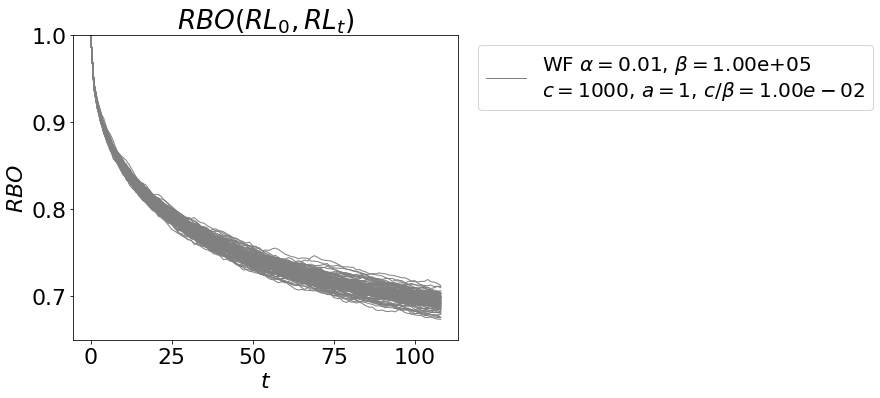

In [37]:
fig, ax = plt.subplots(1,1,figsize=(13,6))
for k, j in enumerate(WF_RBO_initt):
    if k == 0:
        ax.plot(j,color='gray',label=r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$',linewidth=1)
    else:
        ax.plot(j,color='gray',linewidth=1)
ax.set_xlabel(r'$t$')
ax.set_ylabel(r'$RBO$')
ax.set_ylim(0.65,1)
ax.set_title(r'$RBO(RL_{0},RL_{t})$')
ax.legend(fontsize=20, bbox_to_anchor=(1.025, 1), loc='upper left')
plt.tight_layout()
plt.savefig('figures/MAIN-1/rbo-initt_wf-sims_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

#### 1.2.4.-2 WF One Simulation with Parameter Set $\alpha=0.01$, $\beta=2000$, $c=1000$, and $a=1$.

In [38]:
seed = 42

In [39]:
c = 1000 # vocabulary words
a = 1 # Zipf parameter
alpha = 0.01 # corpus size rate of change
beta = 2000 # initial corpus size
T = 109 # total time elapsed (years)
color_wf = '#F1C40F'

# sampling of the next time step is the word proportions from the current time step
timer_start = time.process_time()
print('simulating one wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'...')
R, P, Z, S, N = wf20.wright_fisher(c,a,alpha,beta,0,0,T,[],[],0,set_seed=seed,steady=False)

# compute the ranks of the simulation
t_vect = P.columns
ranks = pd.DataFrame(np.zeros(P.shape,dtype=int),index=P.index,columns=P.columns)
olist = pd.DataFrame(np.zeros(P.shape,dtype=str),index=range(1,P.shape[0]+1),columns=P.columns)
for t in t_vect:
    val = lc.return_ranks(P[t])
    for ii, jj in val.items():
        ranks[t][ii] = jj
        olist[t][jj] = ii
dranks = lc.generate_delta(ranks)
rc_la = {'drank-variance':{},'drank-sum':{}}
drank_sum = np.sum(dranks,axis=1)
drank_var = np.var(dranks,axis=1)
RK = {'ranks':ranks,'dranks':dranks,'olist':olist,'drank-variance':drank_var,'drank-sum':drank_sum}
timer_end = time.process_time()
time_elapsed = timer_end - timer_start
print('Done in '+str(round(time_elapsed/60,2))+' minutes')

simulating one wf_c1000_a1_alpha0.01_beta2000_T109...
Done in 0.17 minutes


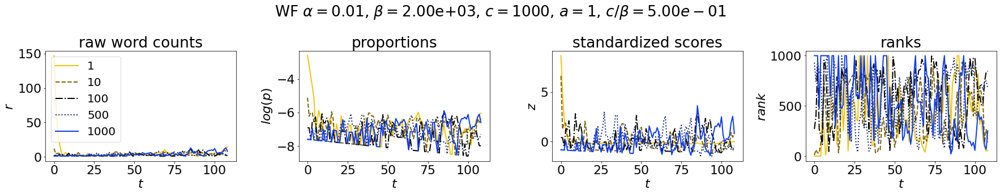

In [40]:
WF_example_words = [1,10,100,500,1000]

# FIGURE: selected time series
fig, ax = plt.subplots(1,4,figsize=(25,5))
lp.time_series_plot(data=R.loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$r$',title='raw word counts',color='#F1C40F',
               legend=True,annotation=False,ax=ax[0])
lp.time_series_plot(data=np.log(P.loc[WF_example_words,:].T),xlabel=r'$t$',ylabel=r'$log(p)$',title='proportions',color='#F1C40F',
               legend=True,annotation=False,ax=ax[1])
lp.time_series_plot(data=Z.loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$z$',title='standardized scores',color='#F1C40F',
               legend=True,annotation=False,ax=ax[2])
lp.time_series_plot(data=RK['ranks'].loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$rank$',title='ranks',color='#F1C40F',
               legend=True,annotation=False,ax=ax[3])
ax[0].legend(loc=2,fontsize=20)
ax[1].get_legend().remove()
ax[2].get_legend().remove()
ax[3].get_legend().remove()
plt.suptitle(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+r', $c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$'+'\n')
plt.tight_layout()
plt.subplots_adjust(top=0.75)
plt.savefig('figures/MAIN-1/multiple-time-series-rpz_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

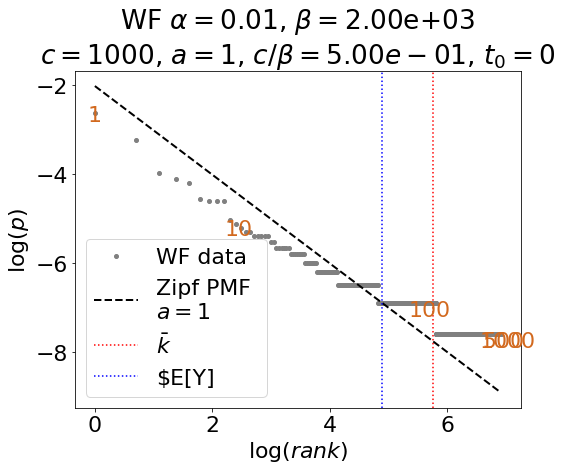

In [41]:
# FIGURE: WF visualization of the initial Zipf distribution
t = 0

fig, ax = plt.subplots(1,1,figsize=(8,7))
p_vect = P[t]
empirical_ranks = lc.return_ranks(p_vect)
er = np.array(list(empirical_ranks.values()),dtype=float)
er_keys = list(empirical_ranks.keys())
p_vect_sorted = np.array(list(p_vect.loc[er_keys].values),dtype=float)

zipf_pmf, zipf_cdf = wf20.zipf(er,a)

E_theory = wf20.zipf_E(er,a)
E_empirical = lc.zipf_E_data(er,p_vect)

example_words_p_vect = []
example_words_empirical_ranks = []
for ew in WF_example_words:
    example_words_p_vect.append(p_vect[ew])
    example_words_empirical_ranks.append(empirical_ranks[ew])

ax.plot(np.log(er),np.log(p_vect_sorted),'.',
                         markersize=8,color='gray',label='WF data')
for i, j in enumerate(WF_example_words):
    xy_vect = (np.log(example_words_empirical_ranks[i]), np.log(example_words_p_vect[i]))
    ax.annotate(j,
                xy=xy_vect, xycoords='data',
                xytext=(xy_vect[0], xy_vect[1]), textcoords='offset points',color='chocolate',
                horizontalalignment='center', verticalalignment='center')
ax.plot(np.log(er),np.log(zipf_pmf),
                         linewidth=2,linestyle='--',color='black',
                         label='Zipf PMF \n'+r'$a='+str(a)+'$')
ax.axvline(np.log(E_empirical),label=r'$\bar{k}$',linestyle=':',color='red')
ax.axvline(np.log(E_theory),label=r'$E[Y]',linestyle=':',color='blue')
ax.set_xlabel(r'$\log{(rank)}$')
ax.set_ylabel(r'$\log{(p)}$')
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$'+r', $t_0='+str(t)+'$')
ax.legend(loc=3)
plt.tight_layout()
plt.savefig('figures/MAIN-1/initial-zipf_data-curve-fit_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

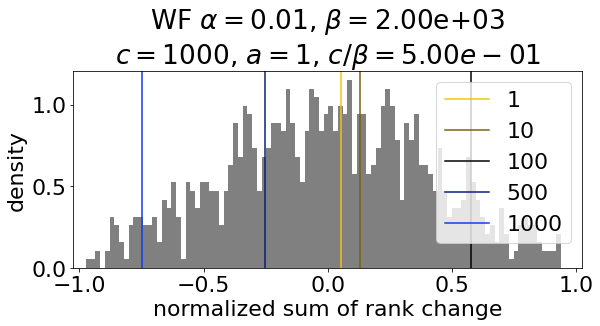

In [42]:
# define colormap given a color
color = '#F1C40F'
match_hex = re.search(r'^#(?:[0-9a-fA-F]{3}){1,2}$', color)
if not match_hex:
    try:
        color = colors_hex[color]
    except:
        print('Color '+str(color)+' not available. Try converting it to hexadecimal. Using default color...')
        color = colors_hex['red']
color_complement = lp.get_complementary(color)
c_conv = cl.ColorConverter().to_rgb
c_cmap = lp.make_colormap([c_conv(color), c_conv('black'), 0.50, c_conv('black'), c_conv(color_complement)])
index_color = c_cmap(np.linspace(0,1,len(WF_example_words)))

fig, ax = plt.subplots(1,1,figsize=(9,5))
ds_all = RK['drank-sum']
al_vals = {}
for i in ds_all.keys(): 
    al_vals[i] = ds_all[i]/len(ds_all)
al_vals = pd.DataFrame({'drank-sum':al_vals})

ax.hist(al_vals.values,bins=100,density=True,color='gray')
for i, j in enumerate(WF_example_words):
    ax.axvline(al_vals['drank-sum'][j],color=index_color[i],label=j)
ax.set_xlim(-1-0.025,1+0.025)
ax.set_xlabel('normalized sum of rank change')
ax.set_ylabel('density')
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$')
ax.legend(loc=1)

plt.tight_layout()
plt.savefig('figures/MAIN-1/rc-sum-distribution_list-of-words_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

In [43]:
# compute overlap vector
pmf_zipf, cdf_zipf = wf20.zipf(range(1,c+1),a)
ol_vect = []
for w in tqdm(range(1,c+1)):
    ol_vect.append(ol(w,beta,c,pmf_zipf)/c)

100%|██████████| 1000/1000 [00:09<00:00, 104.39it/s]


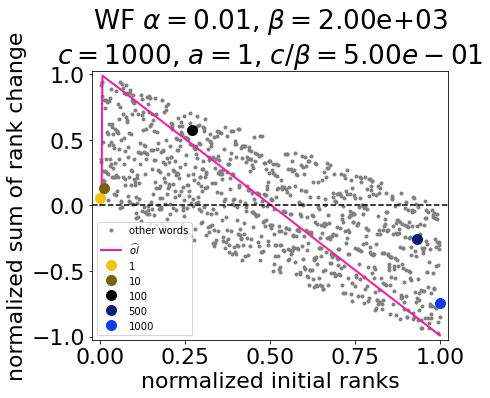

In [44]:
t = 0
dayta = RK

initial_ranks = dayta['ranks'][t].sort_index()
initial_ranks_normed = initial_ranks.values / len(initial_ranks.values)
drank_sum = dayta['drank-sum'].sort_index()
drank_sum_normed = np.array(drank_sum.values) / len(np.array(drank_sum.values))

fig, ax = plt.subplots(1,1,figsize=(7,6))
ax.plot(initial_ranks_normed,drank_sum_normed,'.',color='gray',label='other words')
ax.plot(np.linspace(0,1,len(ol_vect)),ol_vect,'-',linewidth=2,color='#F81AA1',label=r'$\widehat{ol}$')
ax.axhline(0,linestyle='--',color='black')
for i, j in enumerate(WF_example_words):
    plt.plot(initial_ranks_normed[j-1],drank_sum_normed[j-1],'.',markersize=20,label=j,color=index_color[i])
ax.set_xlim(0-0.025,1+0.025)
ax.set_ylim(-1-0.025,1+0.025)
ax.set_xlabel('normalized initial ranks')
ax.set_ylabel('normalized sum of rank change')
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$')
ax.legend(loc=3,fontsize=10)

plt.tight_layout()
plt.savefig('figures/MAIN-1/rc-sum_vs_initial-ranks_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

X = drank_sum_normed

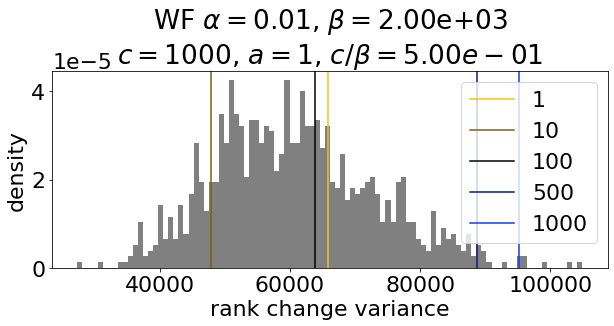

In [45]:
fig, ax = plt.subplots(1,1,figsize=(9,5))
al_vals = RK['drank-variance']
#al_vals = al_vals/np.max(abs(al_vals))

ax.hist(al_vals.values,bins=100,density=True,color='gray')
for i, j in enumerate(WF_example_words):
    ax.axvline(al_vals[j],color=index_color[i],label=j)
#ax.set_xlim(0-0.025,1+0.025)
ax.set_xlabel('rank change variance')
ax.set_ylabel('density')
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$')
ax.legend(loc=0)

plt.tight_layout()
plt.savefig('figures/MAIN-1/rc-variance-distribution_list-of-words_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

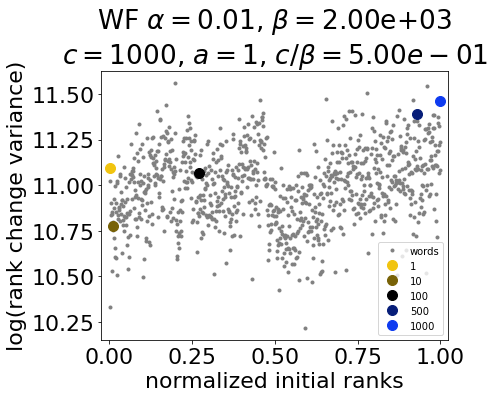

In [46]:
t = 0
dayta = RK

initial_ranks = dayta['ranks'][t].sort_index()
vocab_size = len(initial_ranks.values)
initial_ranks_normed = initial_ranks.values / vocab_size
drank_var = pd.DataFrame({'drank-variance':dayta['drank-variance']}).sort_index()
max_norm = np.max(abs(drank_var)).values[0]
drank_var_normed = np.log(drank_var) #drank_var / max_norm

fig, ax = plt.subplots(1,1,figsize=(7,6))
ax.plot(initial_ranks_normed,drank_var_normed,'.',color='gray',label='words')
for i, j in enumerate(WF_example_words):
    plt.plot(initial_ranks_normed[j-1],drank_var_normed['drank-variance'][j],'.',markersize=20,label=j,color=index_color[i])
ax.set_xlim(0-0.025,1+0.025)
#ax.set_ylim(0-0.025,1+0.025)
ax.set_xlabel('normalized initial ranks')
ax.set_ylabel('log(rank change variance)')
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$')
ax.legend(loc=4,fontsize=10)

plt.tight_layout()
plt.savefig('figures/MAIN-1/rc-variance_vs_initial-ranks_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

Y = drank_var_normed

In [47]:
WF_LIST = RK['olist']
t_initial = WF_LIST.columns[0]

# RBO t -- t+1
ttp1 = []
for i in list(WF_LIST.keys())[:-1]:
    ttp1.append(rbo.RankingSimilarity(WF_LIST[i+1].values,WF_LIST[i].values).rbo())
WF_RBO_ttp1 = ttp1

# delta RBO t -- t+1
ttp1_delta = []
for i in range(0,len(ttp1)-1):
    ttp1_delta.append(ttp1[i+1]-ttp1[i])
WF_RBO_ttp1_delta = ttp1_delta

# RBO t -- t+10
ttp10 = []
for i in list(WF_LIST.keys())[:-10]:
    ttp10.append(rbo.RankingSimilarity(WF_LIST[i+10].values,WF_LIST[i].values).rbo())
WF_RBO_ttp10 = ttp10

# delta RBO t -- t+10
ttp10_delta = []
for i in range(0,len(ttp10)-1):
    ttp10_delta.append(ttp10[i+1]-ttp10[i])
WF_RBO_ttp10_delta = ttp10_delta

# RBO 0 -- t
initt = []
for i in list(WF_LIST.keys()):
    initt.append(rbo.RankingSimilarity(WF_LIST[t_initial].values,WF_LIST[i].values).rbo())
WF_RBO_initt = initt

# delta RBO 0 -- t
initt_delta = []
for i in range(0,len(initt)-1):
    initt_delta.append(initt[i+1]-initt[i])
WF_RBO_initt_delta = initt_delta

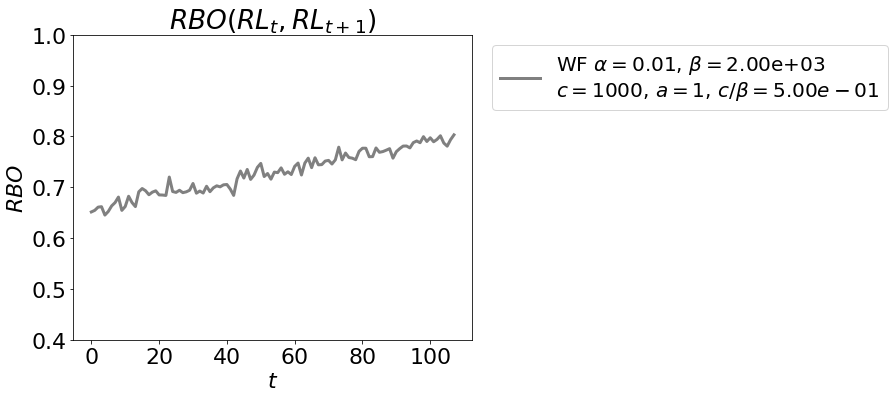

In [48]:
fig, ax = plt.subplots(1,1,figsize=(13,6))
ax.plot(WF_RBO_ttp1,color='gray',label=r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$',linewidth=3)
ax.set_xlabel(r'$t$')
ax.set_ylabel(r'$RBO$')
ax.set_ylim(0.40,1)
ax.set_title(r'$RBO(RL_{t},RL_{t+1})$')
ax.legend(fontsize=20, bbox_to_anchor=(1.025, 1), loc='upper left')
plt.tight_layout()
plt.savefig('figures/MAIN-1/rbo-ttp1_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

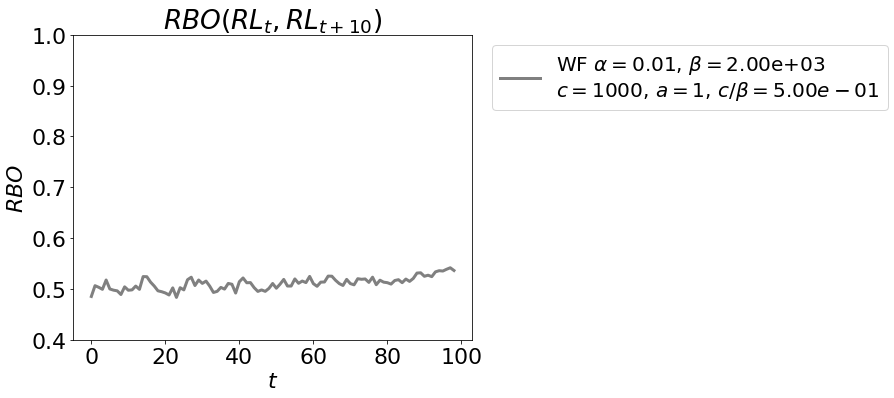

In [49]:
fig, ax = plt.subplots(1,1,figsize=(13,6))
ax.plot(WF_RBO_ttp10,color='gray',label=r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$',linewidth=3)
ax.set_xlabel(r'$t$')
ax.set_ylabel(r'$RBO$')
ax.set_ylim(0.40,1)
ax.set_title(r'$RBO(RL_{t},RL_{t+10})$')
ax.legend(fontsize=20, bbox_to_anchor=(1.025, 1), loc='upper left')
plt.tight_layout()
plt.savefig('figures/MAIN-1/rbo-ttp10_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

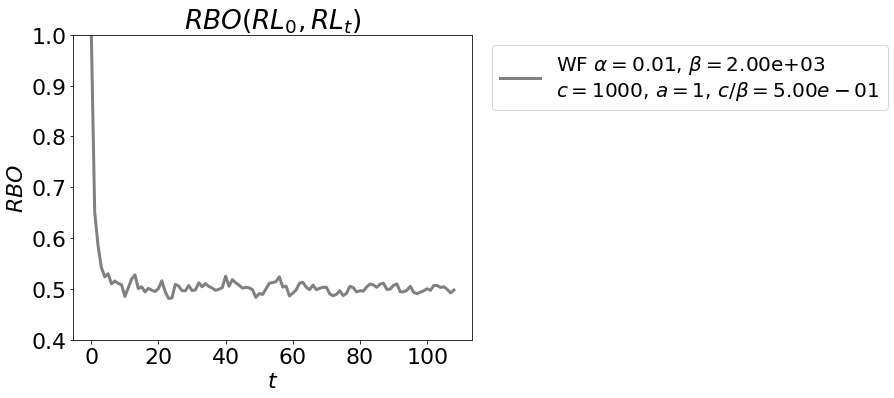

In [50]:
fig, ax = plt.subplots(1,1,figsize=(13,6))
ax.plot(WF_RBO_initt,color='gray',label=r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$',linewidth=3)
ax.set_xlabel(r'$t$')
ax.set_ylabel(r'$RBO$')
ax.set_ylim(0.40,1)
ax.set_title(r'$RBO(RL_{0},RL_{t})$')
ax.legend(fontsize=20, bbox_to_anchor=(1.025, 1), loc='upper left')
plt.tight_layout()
plt.savefig('figures/MAIN-1/rbo-initt_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

#### Extra Section - Turnover

In [51]:
# turnover equation (Evans and Giometto 2011 eq. 4), (Acerbi et. al. 2014 eq. 1) and/or (Ruck et. al. 2017 eq. 1)
# b = 0.86 means unbiased copying according to Acerbu i et. al. 2014 and Ruck et. al. 2017
def turnover(mu,y,n,d=1.38,a=0.55,b=0.86,c=0.13):
    return d*(np.power(mu,a))*(np.power(y,b))*(np.power(n,c))

# generic turnover equation
def turnover_gen(y,a,b=0.86):
    return a*(np.power(y,b))

In [52]:
y = list(range(0,100,1)) # top y list
a = 1
b = 0.86
z_theory = turnover_gen(y,a,b)

In [53]:
turnover_rates = {'y':[],'z':[],'z-theory':z_theory}

for i in y:
    new_words = []
    for j in range(1,109,1):
        t_turn = set(RK['olist'][0:i][j-1])
        t1_turn = set(RK['olist'][0:i][j])

        new_words.extend(list(t1_turn.difference(t_turn)))
        
    turnover_rates['y'].append(i)
    turnover_rates['z'].append(len(np.unique(new_words)))
    
TR = pd.DataFrame(turnover_rates)

In [54]:
# fit
parameters, covariance = curve_fit(turnover_gen, TR['y'], TR['z'])
a_fit = round(parameters[0],2)
b_fit = round(parameters[1],2)
TR['z-fit'] = turnover_gen(y,a=parameters[0],b=parameters[1])

In [55]:
# mean normalizations
TR['z-norm'] = TR['z']/np.mean(TR['z'])
TR['z-fit-norm'] = TR['z-fit']/np.mean(TR['z-fit'])
TR['z-theory-norm'] = TR['z-theory']/np.mean(TR['z-theory'])

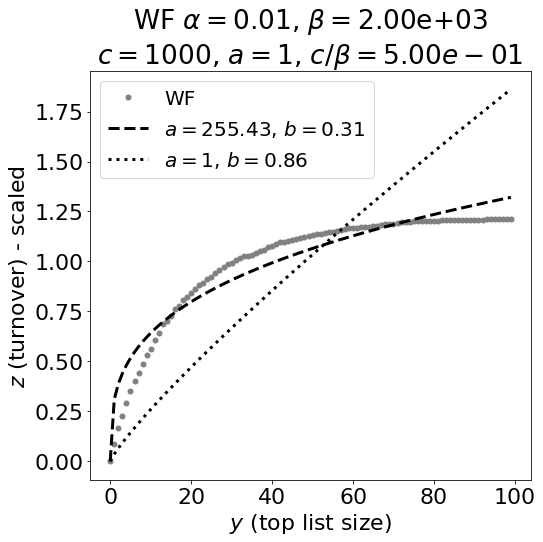

In [56]:
fig, ax = plt.subplots(1,1,figsize=(8,8))

ax.plot(TR['y'],TR['z-norm'],'.',markersize=10,color='gray',label='WF')
ax.plot(TR['y'],TR['z-fit-norm'],'--',linewidth=3,color='black',label=r'$a=$'+str(a_fit)+r', $b=$'+str(b_fit))
ax.plot(TR['y'],TR['z-theory-norm'],':',linewidth=3,label=r'$a=$'+str(a)+r', $b=$'+str(b),color='black')
ax.set_xlabel(r'$y$ (top list size)')
ax.set_ylabel(r'$z$ (turnover) - scaled')
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$')
ax.legend(fontsize=20, loc=2)
plt.tight_layout()
plt.savefig('figures/MAIN-1/turnover_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

#### 1.2.4.-1 WF One Simulation with Parameter Set $\alpha=0.01$, $\beta=10000$, $c=1000$, and $a=1$.

In [57]:
seed = 42

In [58]:
c = 1000 # vocabulary words
a = 1 # Zipf parameter
alpha = 0.01 # corpus size rate of change
beta = 10000 # initial corpus size
T = 109 # total time elapsed (years)
color_wf = '#F1C40F'

# sampling of the next time step is the word proportions from the current time step
timer_start = time.process_time()
print('simulating one wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'...')
R, P, Z, S, N = wf20.wright_fisher(c,a,alpha,beta,0,0,T,[],[],0,set_seed=seed,steady=False)

# compute the ranks of the simulation
t_vect = P.columns
ranks = pd.DataFrame(np.zeros(P.shape,dtype=int),index=P.index,columns=P.columns)
olist = pd.DataFrame(np.zeros(P.shape,dtype=str),index=range(1,P.shape[0]+1),columns=P.columns)
for t in t_vect:
    val = lc.return_ranks(P[t])
    for ii, jj in val.items():
        ranks[t][ii] = jj
        olist[t][jj] = ii
dranks = lc.generate_delta(ranks)
rc_la = {'drank-variance':{},'drank-sum':{}}
drank_sum = np.sum(dranks,axis=1)
drank_var = np.var(dranks,axis=1)
RK = {'ranks':ranks,'dranks':dranks,'olist':olist,'drank-variance':drank_var,'drank-sum':drank_sum}
timer_end = time.process_time()
time_elapsed = timer_end - timer_start
print('Done in '+str(round(time_elapsed/60,2))+' minutes')

simulating one wf_c1000_a1_alpha0.01_beta10000_T109...
Done in 0.17 minutes


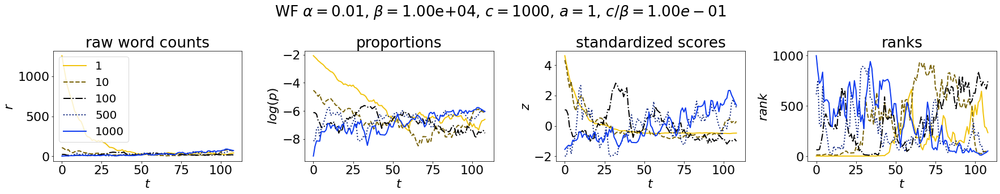

In [59]:
WF_example_words = [1,10,100,500,1000]

# FIGURE: selected time series
fig, ax = plt.subplots(1,4,figsize=(25,5))
lp.time_series_plot(data=R.loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$r$',title='raw word counts',color='#F1C40F',
               legend=True,annotation=False,ax=ax[0])
lp.time_series_plot(data=np.log(P.loc[WF_example_words,:].T),xlabel=r'$t$',ylabel=r'$log(p)$',title='proportions',color='#F1C40F',
               legend=True,annotation=False,ax=ax[1])
lp.time_series_plot(data=Z.loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$z$',title='standardized scores',color='#F1C40F',
               legend=True,annotation=False,ax=ax[2])
lp.time_series_plot(data=RK['ranks'].loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$rank$',title='ranks',color='#F1C40F',
               legend=True,annotation=False,ax=ax[3])
ax[0].legend(loc=2,fontsize=20)
ax[1].get_legend().remove()
ax[2].get_legend().remove()
ax[3].get_legend().remove()
plt.suptitle(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+r', $c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$'+'\n')
plt.tight_layout()
plt.subplots_adjust(top=0.75)
plt.savefig('figures/MAIN-1/multiple-time-series-rpz_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

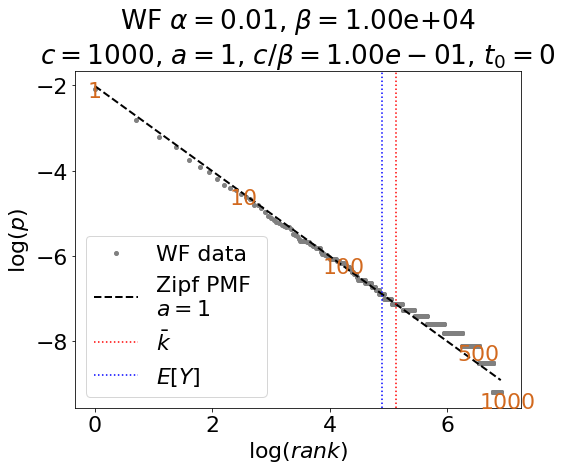

In [60]:
# FIGURE: WF visualization of the initial Zipf distribution
t = 0

fig, ax = plt.subplots(1,1,figsize=(8,7))
p_vect = P[t]
empirical_ranks = lc.return_ranks(p_vect)
er = np.array(list(empirical_ranks.values()),dtype=float)
er_keys = list(empirical_ranks.keys())
p_vect_sorted = np.array(list(p_vect.loc[er_keys].values),dtype=float)

zipf_pmf, zipf_cdf = wf20.zipf(er,a)

E_theory = wf20.zipf_E(er,a)
E_empirical = lc.zipf_E_data(er,p_vect)

example_words_p_vect = []
example_words_empirical_ranks = []
for ew in WF_example_words:
    example_words_p_vect.append(p_vect[ew])
    example_words_empirical_ranks.append(empirical_ranks[ew])

ax.plot(np.log(er),np.log(p_vect_sorted),'.',
                         markersize=8,color='gray',label='WF data')
for i, j in enumerate(WF_example_words):
    xy_vect = (np.log(example_words_empirical_ranks[i]), np.log(example_words_p_vect[i]))
    ax.annotate(j,
                xy=xy_vect, xycoords='data',
                xytext=(xy_vect[0], xy_vect[1]), textcoords='offset points',color='chocolate',
                horizontalalignment='center', verticalalignment='center')
ax.plot(np.log(er),np.log(zipf_pmf),
                         linewidth=2,linestyle='--',color='black',
                         label='Zipf PMF \n'+r'$a='+str(a)+'$')
ax.axvline(np.log(E_empirical),label=r'$\bar{k}$',linestyle=':',color='red')
ax.axvline(np.log(E_theory),label=r'$E[Y]$',linestyle=':',color='blue')
ax.set_xlabel(r'$\log{(rank)}$')
ax.set_ylabel(r'$\log{(p)}$')
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$'+r', $t_0='+str(t)+'$')
ax.legend(loc=3)
plt.tight_layout()
plt.savefig('figures/MAIN-1/initial-zipf_data-curve-fit_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

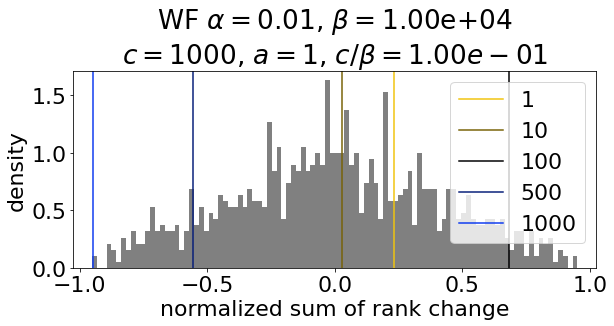

In [61]:
# define colormap given a color
color = '#F1C40F'
match_hex = re.search(r'^#(?:[0-9a-fA-F]{3}){1,2}$', color)
if not match_hex:
    try:
        color = colors_hex[color]
    except:
        print('Color '+str(color)+' not available. Try converting it to hexadecimal. Using default color...')
        color = colors_hex['red']
color_complement = lp.get_complementary(color)
c_conv = cl.ColorConverter().to_rgb
c_cmap = lp.make_colormap([c_conv(color), c_conv('black'), 0.50, c_conv('black'), c_conv(color_complement)])
index_color = c_cmap(np.linspace(0,1,len(WF_example_words)))

fig, ax = plt.subplots(1,1,figsize=(9,5))
ds_all = RK['drank-sum']
al_vals = {}
for i in ds_all.keys(): 
    al_vals[i] = ds_all[i]/len(ds_all)
al_vals = pd.DataFrame({'drank-sum':al_vals})

ax.hist(al_vals.values,bins=100,density=True,color='gray')
for i, j in enumerate(WF_example_words):
    ax.axvline(al_vals['drank-sum'][j],color=index_color[i],label=j)
ax.set_xlim(-1-0.025,1+0.025)
ax.set_xlabel('normalized sum of rank change')
ax.set_ylabel('density')
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$')
ax.legend(loc=1)

plt.tight_layout()
plt.savefig('figures/MAIN-1/rc-sum-distribution_list-of-words_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

In [62]:
# compute overlap vector
pmf_zipf, cdf_zipf = wf20.zipf(range(1,c+1),a)
ol_vect = []
for w in tqdm(range(1,c+1)):
    ol_vect.append(ol(w,beta,c,pmf_zipf)/c)

100%|██████████| 1000/1000 [00:09<00:00, 105.04it/s]


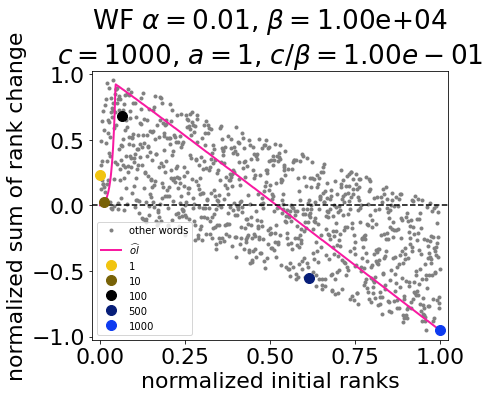

In [63]:
t = 0
dayta = RK

initial_ranks = dayta['ranks'][t].sort_index()
initial_ranks_normed = initial_ranks.values / len(initial_ranks.values)
drank_sum = dayta['drank-sum'].sort_index()
drank_sum_normed = np.array(drank_sum.values) / len(np.array(drank_sum.values))

fig, ax = plt.subplots(1,1,figsize=(7,6))
ax.plot(initial_ranks_normed,drank_sum_normed,'.',color='gray',label='other words')
ax.plot(np.linspace(0,1,len(ol_vect)),ol_vect,'-',linewidth=2,color='#F81AA1',label=r'$\widehat{ol}$')
ax.axhline(0,linestyle='--',color='black')
for i, j in enumerate(WF_example_words):
    plt.plot(initial_ranks_normed[j-1],drank_sum_normed[j-1],'.',markersize=20,label=j,color=index_color[i])
ax.set_xlim(0-0.025,1+0.025)
ax.set_ylim(-1-0.025,1+0.025)
ax.set_xlabel('normalized initial ranks')
ax.set_ylabel('normalized sum of rank change')
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$')
ax.legend(loc=3,fontsize=10)

plt.tight_layout()
plt.savefig('figures/MAIN-1/rc-sum_vs_initial-ranks_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

X = drank_sum_normed

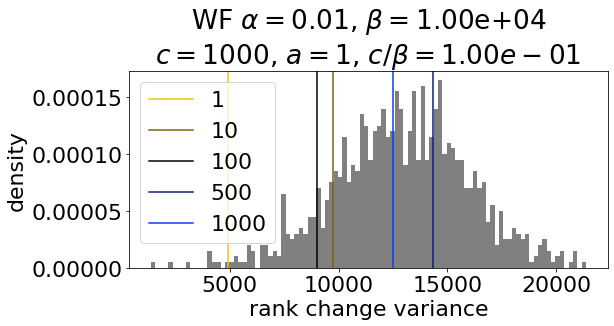

In [64]:
fig, ax = plt.subplots(1,1,figsize=(9,5))
al_vals = RK['drank-variance']
#al_vals = al_vals/np.max(abs(al_vals))

ax.hist(al_vals.values,bins=100,density=True,color='gray')
for i, j in enumerate(WF_example_words):
    ax.axvline(al_vals[j],color=index_color[i],label=j)
#ax.set_xlim(0-0.025,1+0.025)
ax.set_xlabel('rank change variance')
ax.set_ylabel('density')
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$')
ax.legend(loc=0)

plt.tight_layout()
plt.savefig('figures/MAIN-1/rc-variance-distribution_list-of-words_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

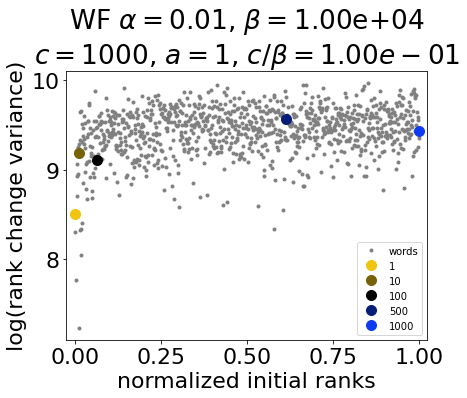

In [65]:
t = 0
dayta = RK

initial_ranks = dayta['ranks'][t].sort_index()
vocab_size = len(initial_ranks.values)
initial_ranks_normed = initial_ranks.values / vocab_size
drank_var = pd.DataFrame({'drank-variance':dayta['drank-variance']}).sort_index()
max_norm = np.max(abs(drank_var)).values[0]
drank_var_normed = np.log(drank_var) #drank_var / max_norm

fig, ax = plt.subplots(1,1,figsize=(7,6))
ax.plot(initial_ranks_normed,drank_var_normed,'.',color='gray',label='words')
for i, j in enumerate(WF_example_words):
    plt.plot(initial_ranks_normed[j-1],drank_var_normed['drank-variance'][j],'.',markersize=20,label=j,color=index_color[i])
ax.set_xlim(0-0.025,1+0.025)
#ax.set_ylim(0-0.025,1+0.025)
ax.set_xlabel('normalized initial ranks')
ax.set_ylabel('log(rank change variance)')
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$')
ax.legend(loc=4,fontsize=10)

plt.tight_layout()
plt.savefig('figures/MAIN-1/rc-variance_vs_initial-ranks_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

Y = drank_var_normed

In [66]:
WF_LIST = RK['olist']
t_initial = WF_LIST.columns[0]

# RBO t -- t+1
ttp1 = []
for i in list(WF_LIST.keys())[:-1]:
    ttp1.append(rbo.RankingSimilarity(WF_LIST[i+1].values,WF_LIST[i].values).rbo())
WF_RBO_ttp1 = ttp1

# delta RBO t -- t+1
ttp1_delta = []
for i in range(0,len(ttp1)-1):
    ttp1_delta.append(ttp1[i+1]-ttp1[i])
WF_RBO_ttp1_delta = ttp1_delta

# RBO t -- t+10
ttp10 = []
for i in list(WF_LIST.keys())[:-10]:
    ttp10.append(rbo.RankingSimilarity(WF_LIST[i+10].values,WF_LIST[i].values).rbo())
WF_RBO_ttp10 = ttp10

# delta RBO t -- t+10
ttp10_delta = []
for i in range(0,len(ttp10)-1):
    ttp10_delta.append(ttp10[i+1]-ttp10[i])
WF_RBO_ttp10_delta = ttp10_delta

# RBO 0 -- t
initt = []
for i in list(WF_LIST.keys()):
    initt.append(rbo.RankingSimilarity(WF_LIST[t_initial].values,WF_LIST[i].values).rbo())
WF_RBO_initt = initt

# delta RBO 0 -- t
initt_delta = []
for i in range(0,len(initt)-1):
    initt_delta.append(initt[i+1]-initt[i])
WF_RBO_initt_delta = initt_delta

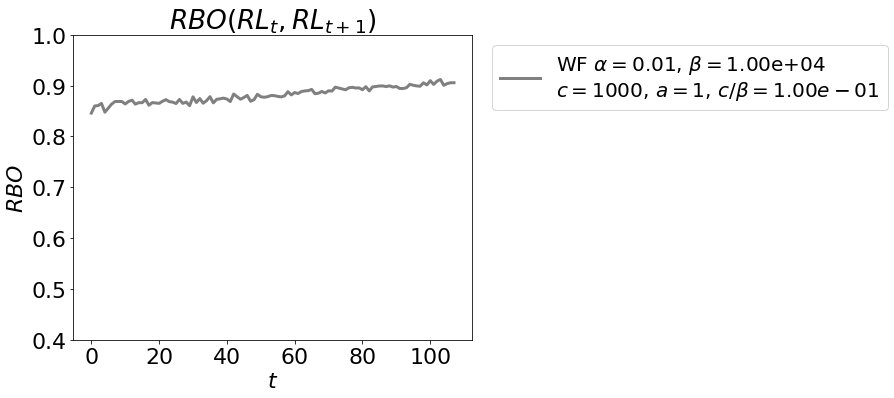

In [67]:
fig, ax = plt.subplots(1,1,figsize=(13,6))
ax.plot(WF_RBO_ttp1,color='gray',label=r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$',linewidth=3)
ax.set_xlabel(r'$t$')
ax.set_ylabel(r'$RBO$')
ax.set_ylim(0.40,1)
ax.set_title(r'$RBO(RL_{t},RL_{t+1})$')
ax.legend(fontsize=20, bbox_to_anchor=(1.025, 1), loc='upper left')
plt.tight_layout()
plt.savefig('figures/MAIN-1/rbo-ttp1_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

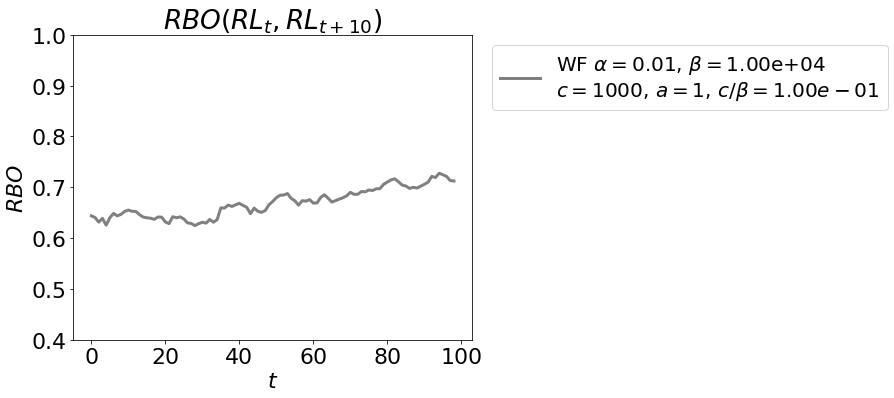

In [68]:
fig, ax = plt.subplots(1,1,figsize=(13,6))
ax.plot(WF_RBO_ttp10,color='gray',label=r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$',linewidth=3)
ax.set_xlabel(r'$t$')
ax.set_ylabel(r'$RBO$')
ax.set_ylim(0.40,1)
ax.set_title(r'$RBO(RL_{t},RL_{t+10})$')
ax.legend(fontsize=20, bbox_to_anchor=(1.025, 1), loc='upper left')
plt.tight_layout()
plt.savefig('figures/MAIN-1/rbo-ttp10_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

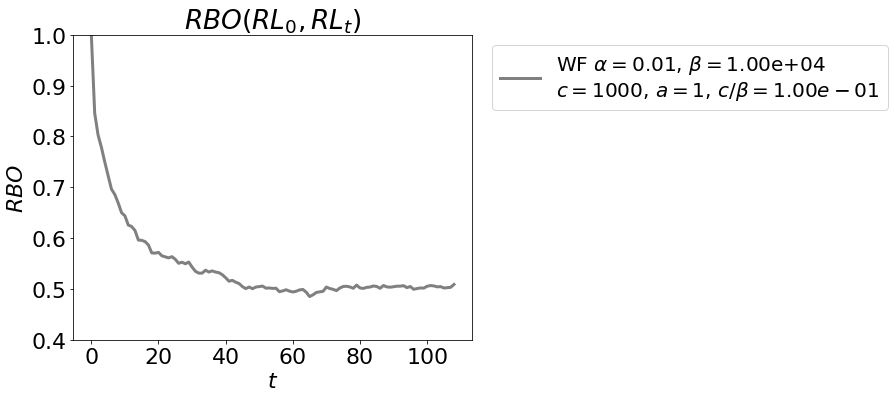

In [69]:
fig, ax = plt.subplots(1,1,figsize=(13,6))
ax.plot(WF_RBO_initt,color='gray',label=r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$',linewidth=3)
ax.set_xlabel(r'$t$')
ax.set_ylabel(r'$RBO$')
ax.set_ylim(0.40,1)
ax.set_title(r'$RBO(RL_{0},RL_{t})$')
ax.legend(fontsize=20, bbox_to_anchor=(1.025, 1), loc='upper left')
plt.tight_layout()
plt.savefig('figures/MAIN-1/rbo-initt_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

#### Extra Section - Turnover

In [70]:
# turnover equation (Evans and Giometto 2011 eq. 4), (Acerbi et. al. 2014 eq. 1) and/or (Ruck et. al. 2017 eq. 1)
# b = 0.86 means unbiased copying according to Acerbu i et. al. 2014 and Ruck et. al. 2017
def turnover(mu,y,n,d=1.38,a=0.55,b=0.86,c=0.13):
    return d*(np.power(mu,a))*(np.power(y,b))*(np.power(n,c))

# generic turnover equation
def turnover_gen(y,a,b=0.86):
    return a*(np.power(y,b))

In [71]:
y = list(range(0,100,1)) # top y list
a = 1
b = 0.86
z_theory = turnover_gen(y,a,b)

In [72]:
turnover_rates = {'y':[],'z':[],'z-theory':z_theory}

for i in y:
    new_words = []
    for j in range(1,109,1):
        t_turn = set(RK['olist'][0:i][j-1])
        t1_turn = set(RK['olist'][0:i][j])

        new_words.extend(list(t1_turn.difference(t_turn)))
        
    turnover_rates['y'].append(i)
    turnover_rates['z'].append(len(np.unique(new_words)))
    
TR = pd.DataFrame(turnover_rates)

In [73]:
# fit
parameters, covariance = curve_fit(turnover_gen, TR['y'], TR['z'])
a_fit = round(parameters[0],2)
b_fit = round(parameters[1],2)
TR['z-fit'] = turnover_gen(y,a=parameters[0],b=parameters[1])

In [74]:
# mean normalizations
TR['z-norm'] = TR['z']/np.mean(TR['z'])
TR['z-fit-norm'] = TR['z-fit']/np.mean(TR['z-fit'])
TR['z-theory-norm'] = TR['z-theory']/np.mean(TR['z-theory'])

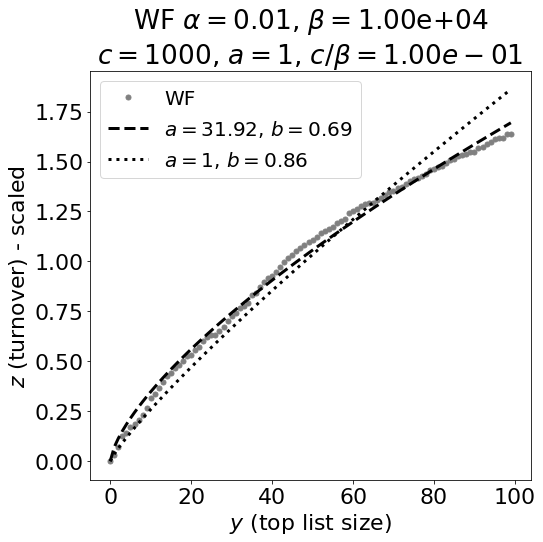

In [75]:
fig, ax = plt.subplots(1,1,figsize=(8,8))

ax.plot(TR['y'],TR['z-norm'],'.',markersize=10,color='gray',label='WF')
ax.plot(TR['y'],TR['z-fit-norm'],'--',linewidth=3,color='black',label=r'$a=$'+str(a_fit)+r', $b=$'+str(b_fit))
ax.plot(TR['y'],TR['z-theory-norm'],':',linewidth=3,label=r'$a=$'+str(a)+r', $b=$'+str(b),color='black')
ax.set_xlabel(r'$y$ (top list size)')
ax.set_ylabel(r'$z$ (turnover) - scaled')
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$')
ax.legend(fontsize=20, loc=2)
plt.tight_layout()
plt.savefig('figures/MAIN-1/turnover_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

#### 1.2.4. WF One Simulation with Parameter Set $\alpha=0.01$, $\beta=100000$, $c=1000$, and $a=1$.

In [76]:
seed = 42

In [77]:
c = 1000 # vocabulary words
a = 1 # Zipf parameter
alpha = 0.01 # corpus size rate of change
beta = 100000 # initial corpus size
T = 109 # total time elapsed (years)
color_wf = '#F1C40F'

# sampling of the next time step is the word proportions from the current time step
timer_start = time.process_time()
print('simulating one wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'...')
R, P, Z, S, N = wf20.wright_fisher(c,a,alpha,beta,0,0,T,[],[],0,set_seed=seed,steady=False)

# compute the ranks of the simulation
t_vect = P.columns
ranks = pd.DataFrame(np.zeros(P.shape,dtype=int),index=P.index,columns=P.columns)
olist = pd.DataFrame(np.zeros(P.shape,dtype=str),index=range(1,P.shape[0]+1),columns=P.columns)
for t in t_vect:
    val = lc.return_ranks(P[t])
    for ii, jj in val.items():
        ranks[t][ii] = jj
        olist[t][jj] = ii
dranks = lc.generate_delta(ranks)
rc_la = {'drank-variance':{},'drank-sum':{}}
drank_sum = np.sum(dranks,axis=1)
drank_var = np.var(dranks,axis=1)
RK = {'ranks':ranks,'dranks':dranks,'olist':olist,'drank-variance':drank_var,'drank-sum':drank_sum}
timer_end = time.process_time()
time_elapsed = timer_end - timer_start
print('Done in '+str(round(time_elapsed/60,2))+' minutes')

simulating one wf_c1000_a1_alpha0.01_beta100000_T109...
Done in 0.2 minutes


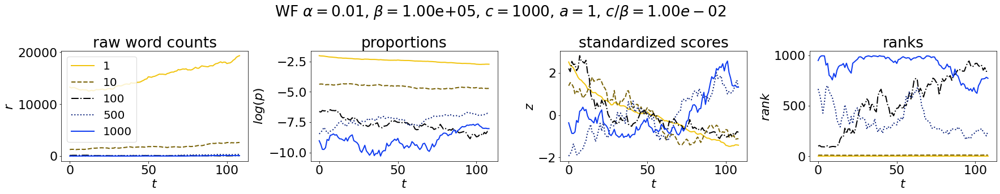

In [78]:
WF_example_words = [1,10,100,500,1000]

# FIGURE: selected time series
fig, ax = plt.subplots(1,4,figsize=(25,5))
lp.time_series_plot(data=R.loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$r$',title='raw word counts',color='#F1C40F',
               legend=True,annotation=False,ax=ax[0])
lp.time_series_plot(data=np.log(P.loc[WF_example_words,:].T),xlabel=r'$t$',ylabel=r'$log(p)$',title='proportions',color='#F1C40F',
               legend=True,annotation=False,ax=ax[1])
lp.time_series_plot(data=Z.loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$z$',title='standardized scores',color='#F1C40F',
               legend=True,annotation=False,ax=ax[2])
lp.time_series_plot(data=RK['ranks'].loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$rank$',title='ranks',color='#F1C40F',
               legend=True,annotation=False,ax=ax[3])
ax[0].legend(loc=2,fontsize=20)
ax[1].get_legend().remove()
ax[2].get_legend().remove()
ax[3].get_legend().remove()
plt.suptitle(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+r', $c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$'+'\n')
plt.tight_layout()
plt.subplots_adjust(top=0.75)
plt.savefig('figures/MAIN-1/multiple-time-series-rpz_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

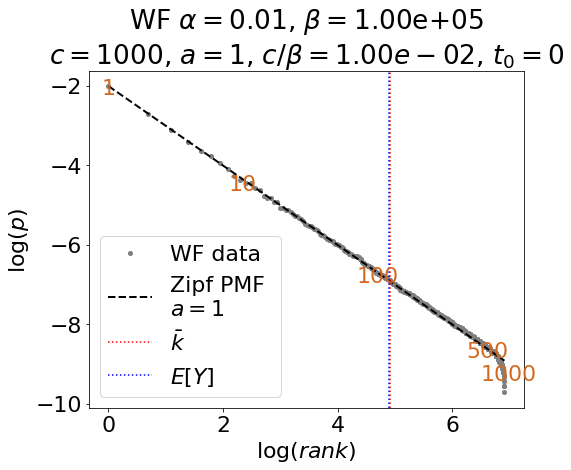

In [79]:
# FIGURE: WF visualization of the initial Zipf distribution
t = 0

fig, ax = plt.subplots(1,1,figsize=(8,7))
p_vect = P[t]
empirical_ranks = lc.return_ranks(p_vect)
er = np.array(list(empirical_ranks.values()),dtype=float)
er_keys = list(empirical_ranks.keys())
p_vect_sorted = np.array(list(p_vect.loc[er_keys].values),dtype=float)

zipf_pmf, zipf_cdf = wf20.zipf(er,a)

E_theory = wf20.zipf_E(er,a)
E_empirical = lc.zipf_E_data(er,p_vect)

example_words_p_vect = []
example_words_empirical_ranks = []
for ew in WF_example_words:
    example_words_p_vect.append(p_vect[ew])
    example_words_empirical_ranks.append(empirical_ranks[ew])

ax.plot(np.log(er),np.log(p_vect_sorted),'.',
                         markersize=8,color='gray',label='WF data')
for i, j in enumerate(WF_example_words):
    xy_vect = (np.log(example_words_empirical_ranks[i]), np.log(example_words_p_vect[i]))
    ax.annotate(j,
                xy=xy_vect, xycoords='data',
                xytext=(xy_vect[0], xy_vect[1]), textcoords='offset points',color='chocolate',
                horizontalalignment='center', verticalalignment='center')
ax.plot(np.log(er),np.log(zipf_pmf),
                         linewidth=2,linestyle='--',color='black',
                         label='Zipf PMF \n'+r'$a='+str(a)+'$')
ax.axvline(np.log(E_empirical),label=r'$\bar{k}$',linestyle=':',color='red')
ax.axvline(np.log(E_theory),label=r'$E[Y]$',linestyle=':',color='blue')
ax.set_xlabel(r'$\log{(rank)}$')
ax.set_ylabel(r'$\log{(p)}$')
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$'+r', $t_0='+str(t)+'$')
ax.legend(loc=3)
plt.tight_layout()
plt.savefig('figures/MAIN-1/initial-zipf_data-curve-fit_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

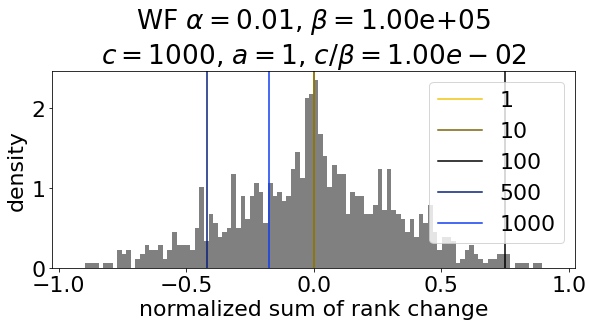

In [80]:
# define colormap given a color
color = '#F1C40F'
match_hex = re.search(r'^#(?:[0-9a-fA-F]{3}){1,2}$', color)
if not match_hex:
    try:
        color = colors_hex[color]
    except:
        print('Color '+str(color)+' not available. Try converting it to hexadecimal. Using default color...')
        color = colors_hex['red']
color_complement = lp.get_complementary(color)
c_conv = cl.ColorConverter().to_rgb
c_cmap = lp.make_colormap([c_conv(color), c_conv('black'), 0.50, c_conv('black'), c_conv(color_complement)])
index_color = c_cmap(np.linspace(0,1,len(WF_example_words)))

fig, ax = plt.subplots(1,1,figsize=(9,5))
ds_all = RK['drank-sum']
al_vals = {}
for i in ds_all.keys(): 
    al_vals[i] = ds_all[i]/len(ds_all)
al_vals = pd.DataFrame({'drank-sum':al_vals})

ax.hist(al_vals.values,bins=100,density=True,color='gray')
for i, j in enumerate(WF_example_words):
    ax.axvline(al_vals['drank-sum'][j],color=index_color[i],label=j)
ax.set_xlim(-1-0.025,1+0.025)
ax.set_xlabel('normalized sum of rank change')
ax.set_ylabel('density')
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$')
ax.legend(loc=1)

plt.tight_layout()
plt.savefig('figures/MAIN-1/rc-sum-distribution_list-of-words_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

In [81]:
# compute overlap vector
pmf_zipf, cdf_zipf = wf20.zipf(range(1,c+1),a)
ol_vect = []
for w in tqdm(range(1,c+1)):
    ol_vect.append(ol(w,beta,c,pmf_zipf)/c)

100%|██████████| 1000/1000 [00:09<00:00, 106.12it/s]


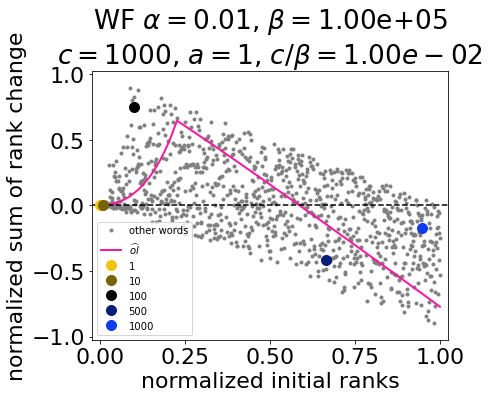

In [82]:
t = 0
dayta = RK

initial_ranks = dayta['ranks'][t].sort_index()
initial_ranks_normed = initial_ranks.values / len(initial_ranks.values)
drank_sum = dayta['drank-sum'].sort_index()
drank_sum_normed = np.array(drank_sum.values) / len(np.array(drank_sum.values))

fig, ax = plt.subplots(1,1,figsize=(7,6))
ax.plot(initial_ranks_normed,drank_sum_normed,'.',color='gray',label='other words')
ax.plot(np.linspace(0,1,len(ol_vect)),ol_vect,'-',linewidth=2,color='#F81AA1',label=r'$\widehat{ol}$')
ax.axhline(0,linestyle='--',color='black')
for i, j in enumerate(WF_example_words):
    plt.plot(initial_ranks_normed[j-1],drank_sum_normed[j-1],'.',markersize=20,label=j,color=index_color[i])
ax.set_xlim(0-0.025,1+0.025)
ax.set_ylim(-1-0.025,1+0.025)
ax.set_xlabel('normalized initial ranks')
ax.set_ylabel('normalized sum of rank change')
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$')
ax.legend(loc=3,fontsize=10)

plt.tight_layout()
plt.savefig('figures/MAIN-1/rc-sum_vs_initial-ranks_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

X = drank_sum_normed

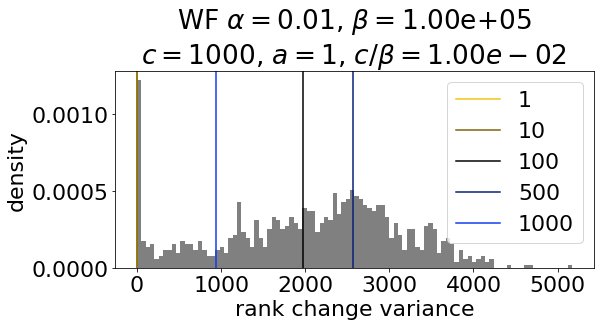

In [83]:
fig, ax = plt.subplots(1,1,figsize=(9,5))
al_vals = RK['drank-variance']
#al_vals = al_vals/np.max(abs(al_vals))

ax.hist(al_vals.values,bins=100,density=True,color='gray')
for i, j in enumerate(WF_example_words):
    ax.axvline(al_vals[j],color=index_color[i],label=j)
#ax.set_xlim(0-0.025,1+0.025)
ax.set_xlabel('rank change variance')
ax.set_ylabel('density')
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$')
ax.legend(loc=0)

plt.tight_layout()
plt.savefig('figures/MAIN-1/rc-variance-distribution_list-of-words_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

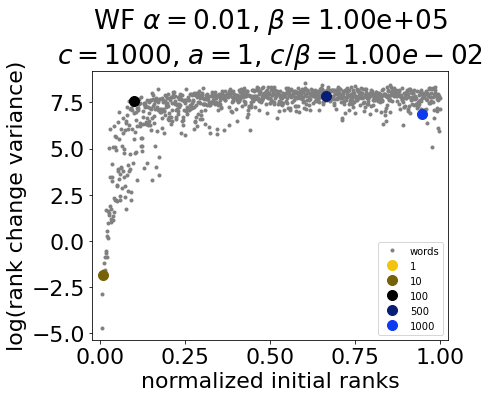

In [84]:
t = 0
dayta = RK

initial_ranks = dayta['ranks'][t].sort_index()
vocab_size = len(initial_ranks.values)
initial_ranks_normed = initial_ranks.values / vocab_size
drank_var = pd.DataFrame({'drank-variance':dayta['drank-variance']}).sort_index()
max_norm = np.max(abs(drank_var)).values[0]
drank_var_normed = np.log(drank_var) #drank_var / max_norm

fig, ax = plt.subplots(1,1,figsize=(7,6))
ax.plot(initial_ranks_normed,drank_var_normed,'.',color='gray',label='words')
for i, j in enumerate(WF_example_words):
    plt.plot(initial_ranks_normed[j-1],drank_var_normed['drank-variance'][j],'.',markersize=20,label=j,color=index_color[i])
ax.set_xlim(0-0.025,1+0.025)
#ax.set_ylim(0-0.025,1+0.025)
ax.set_xlabel('normalized initial ranks')
ax.set_ylabel('log(rank change variance)')
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$')
ax.legend(loc=4,fontsize=10)

plt.tight_layout()
plt.savefig('figures/MAIN-1/rc-variance_vs_initial-ranks_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

Y = drank_var_normed

In [85]:
WF_LIST = RK['olist']
t_initial = WF_LIST.columns[0]

# RBO t -- t+1
ttp1 = []
for i in list(WF_LIST.keys())[:-1]:
    ttp1.append(rbo.RankingSimilarity(WF_LIST[i+1].values,WF_LIST[i].values).rbo())
WF_RBO_ttp1 = ttp1

# delta RBO t -- t+1
ttp1_delta = []
for i in range(0,len(ttp1)-1):
    ttp1_delta.append(ttp1[i+1]-ttp1[i])
WF_RBO_ttp1_delta = ttp1_delta

# RBO t -- t+10
ttp10 = []
for i in list(WF_LIST.keys())[:-10]:
    ttp10.append(rbo.RankingSimilarity(WF_LIST[i+10].values,WF_LIST[i].values).rbo())
WF_RBO_ttp10 = ttp10

# delta RBO t -- t+10
ttp10_delta = []
for i in range(0,len(ttp10)-1):
    ttp10_delta.append(ttp10[i+1]-ttp10[i])
WF_RBO_ttp10_delta = ttp10_delta

# RBO 0 -- t
initt = []
for i in list(WF_LIST.keys()):
    initt.append(rbo.RankingSimilarity(WF_LIST[t_initial].values,WF_LIST[i].values).rbo())
WF_RBO_initt = initt

# delta RBO 0 -- t
initt_delta = []
for i in range(0,len(initt)-1):
    initt_delta.append(initt[i+1]-initt[i])
WF_RBO_initt_delta = initt_delta

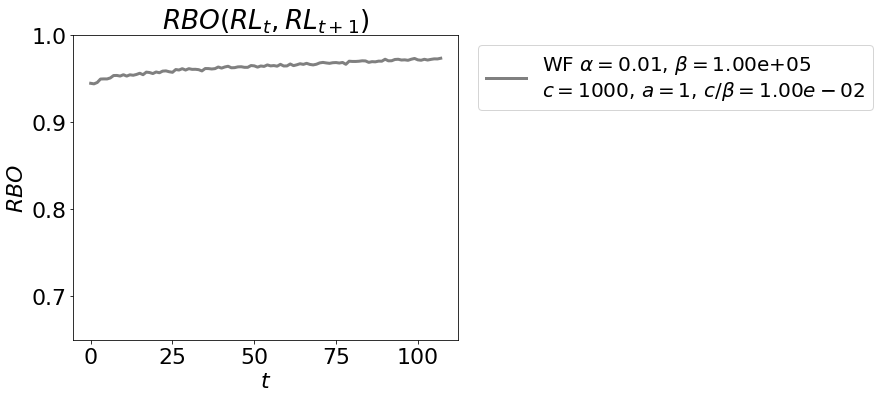

In [86]:
fig, ax = plt.subplots(1,1,figsize=(13,6))
ax.plot(WF_RBO_ttp1,color='gray',label=r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$',linewidth=3)
ax.set_xlabel(r'$t$')
ax.set_ylabel(r'$RBO$')
ax.set_ylim(0.65,1)
ax.set_title(r'$RBO(RL_{t},RL_{t+1})$')
ax.legend(fontsize=20, bbox_to_anchor=(1.025, 1), loc='upper left')
plt.tight_layout()
plt.savefig('figures/MAIN-1/rbo-ttp1_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

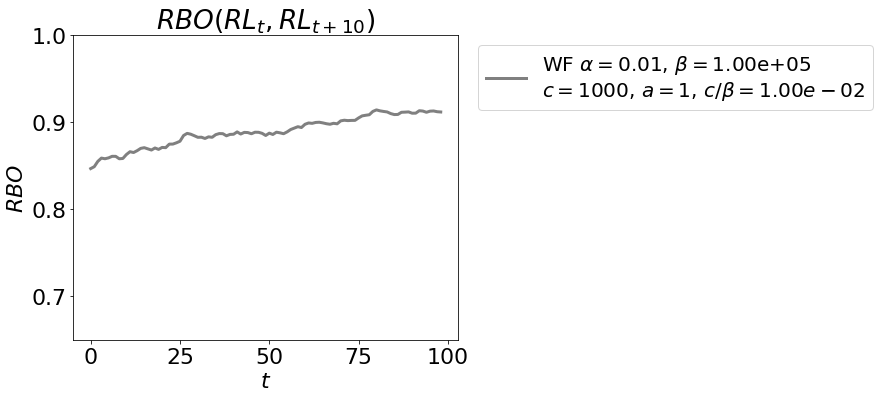

In [87]:
fig, ax = plt.subplots(1,1,figsize=(13,6))
ax.plot(WF_RBO_ttp10,color='gray',label=r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$',linewidth=3)
ax.set_xlabel(r'$t$')
ax.set_ylabel(r'$RBO$')
ax.set_ylim(0.65,1)
ax.set_title(r'$RBO(RL_{t},RL_{t+10})$')
ax.legend(fontsize=20, bbox_to_anchor=(1.025, 1), loc='upper left')
plt.tight_layout()
plt.savefig('figures/MAIN-1/rbo-ttp10_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

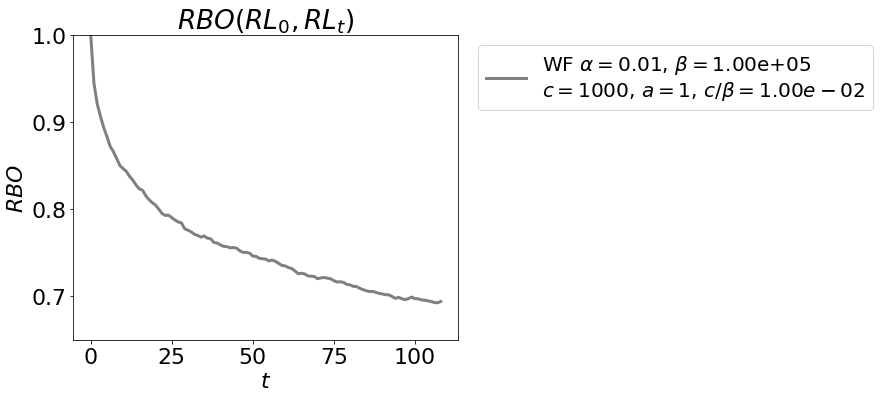

In [88]:
fig, ax = plt.subplots(1,1,figsize=(13,6))
ax.plot(WF_RBO_initt,color='gray',label=r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$',linewidth=3)
ax.set_xlabel(r'$t$')
ax.set_ylabel(r'$RBO$')
ax.set_ylim(0.65,1)
ax.set_title(r'$RBO(RL_{0},RL_{t})$')
ax.legend(fontsize=20, bbox_to_anchor=(1.025, 1), loc='upper left')
plt.tight_layout()
plt.savefig('figures/MAIN-1/rbo-initt_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

#### Extra Section - Turnover

In [89]:
# turnover equation (Evans and Giometto 2011 eq. 4), (Acerbi et. al. 2014 eq. 1) and/or (Ruck et. al. 2017 eq. 1)
# b = 0.86 means unbiased copying according to Acerbu i et. al. 2014 and Ruck et. al. 2017
def turnover(mu,y,n,d=1.38,a=0.55,b=0.86,c=0.13):
    return d*(np.power(mu,a))*(np.power(y,b))*(np.power(n,c))

# generic turnover equation
def turnover_gen(y,a,b=0.86):
    return a*(np.power(y,b))

In [90]:
y = list(range(0,100,1)) # top y list
a = 1
b = 0.86
z_theory = turnover_gen(y,a,b)

In [91]:
turnover_rates = {'y':[],'z':[],'z-theory':z_theory}

for i in y:
    new_words = []
    for j in range(1,109,1):
        t_turn = set(RK['olist'][0:i][j-1])
        t1_turn = set(RK['olist'][0:i][j])

        new_words.extend(list(t1_turn.difference(t_turn)))
        
    turnover_rates['y'].append(i)
    turnover_rates['z'].append(len(np.unique(new_words)))
    
TR = pd.DataFrame(turnover_rates)

In [92]:
# fit
parameters, covariance = curve_fit(turnover_gen, TR['y'], TR['z'])
a_fit = round(parameters[0],2)
b_fit = round(parameters[1],2)
TR['z-fit'] = turnover_gen(y,a=parameters[0],b=parameters[1])

In [93]:
# mean normalizations
TR['z-norm'] = TR['z']/np.mean(TR['z'])
TR['z-fit-norm'] = TR['z-fit']/np.mean(TR['z-fit'])
TR['z-theory-norm'] = TR['z-theory']/np.mean(TR['z-theory'])

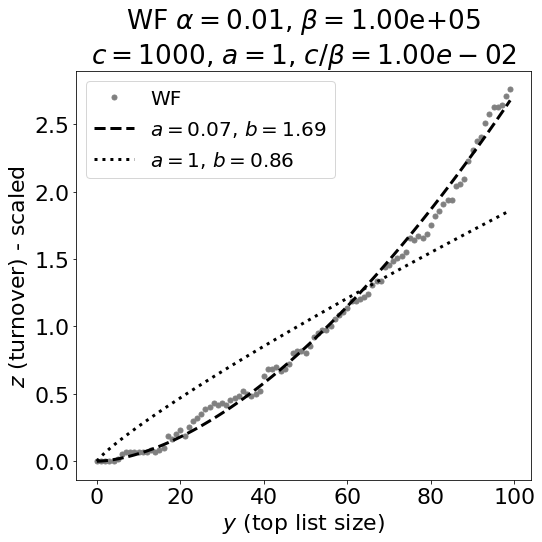

In [94]:
fig, ax = plt.subplots(1,1,figsize=(8,8))

ax.plot(TR['y'],TR['z-norm'],'.',markersize=10,color='gray',label='WF')
ax.plot(TR['y'],TR['z-fit-norm'],'--',linewidth=3,color='black',label=r'$a=$'+str(a_fit)+r', $b=$'+str(b_fit))
ax.plot(TR['y'],TR['z-theory-norm'],':',linewidth=3,label=r'$a=$'+str(a)+r', $b=$'+str(b),color='black')
ax.set_xlabel(r'$y$ (top list size)')
ax.set_ylabel(r'$z$ (turnover) - scaled')
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$')
ax.legend(fontsize=20, loc=2)
plt.tight_layout()
plt.savefig('figures/MAIN-1/turnover_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

#### 1.2.4. WF Multiple Simulations with Different Parameter Sets.

In [95]:
# fixed and varied parameters
c = 1000 # vocabulary words
a = 1 # Zipf parameter
alpha = 0.01 #0.024 # corpus size rate of change
beta = 100000 # initial corpus size
T = 109 # total time elapsed (years)
all_params = {}
all_labels = {}
all_variab = {}
WF = {}
WF_RANKS = {}
color_wf = '#F1C40F'

In [96]:
# alpha varies
print('alpha varies...')
alpha_vect = [0.01,0.015,0.020,0.025,0.030]
alpha_wf_vect = []
alpha_wf_ranks_vect = []
for i in alpha_vect:
    pre_sim = pkl.load(open(precomp_wf_dir+'/wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(i)+'_beta'+str(beta)+'_T'+str(T)+'.pkl','rb'))
    alpha_wf_vect.append(pre_sim)
    pre_sim = pkl.load(open(precomp_rc_dir+'/ranks_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(i)+'_beta'+str(beta)+'_T'+str(T)+'.pkl','rb'))
    alpha_wf_ranks_vect.append(pre_sim)
WF['alpha'] = alpha_wf_vect
WF_RANKS['alpha'] = alpha_wf_ranks_vect
all_params['alpha'] = alpha_vect
all_labels['alpha'] = 'WF CASE 1 \n*Corpus size rate varies*'+'\nFixed parameters:'+'\n'+r'$a = $'+str(a)+r', $c = $'+str(c)+'\n'+r'$\beta = $'+"{:.2e}".format(beta)+r', $T = $'+str(T)
all_variab['alpha'] = r'$\mathbf{\alpha = }$'

# beta varies
print('beta varies...')
beta_vect = [100000,200000,300000,400000,800000]
beta_wf_vect = []
beta_wf_ranks_vect = []
for i in beta_vect:
    pre_sim = pkl.load(open(precomp_wf_dir+'/wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(i)+'_T'+str(T)+'.pkl','rb'))
    beta_wf_vect.append(pre_sim)
    pre_sim = pkl.load(open(precomp_rc_dir+'/ranks_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(i)+'_T'+str(T)+'.pkl','rb'))
    beta_wf_ranks_vect.append(pre_sim)
WF['beta'] = beta_wf_vect
WF_RANKS['beta'] = beta_wf_ranks_vect
all_params['beta'] = beta_vect
all_labels['beta'] = 'WF CASE 2 \n*Initial corpus size varies*'+'\nFixed parameters:'+'\n'+r'$a = $'+str(a)+r', $c = $'+str(c)+'\n'+r'$\alpha = $'+str(alpha)+r', $T = $'+str(T)
all_variab['beta'] = r'$\mathbf{\beta = }$'

# c varies
print('c varies...')
c_vect = [1000,2000,3000,4000,8000]
c_wf_vect = []
c_wf_ranks_vect = []
for i in c_vect:
    pre_sim = pkl.load(open(precomp_wf_dir+'/wf_c'+str(i)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.pkl','rb'))
    c_wf_vect.append(pre_sim)
    pre_sim = pkl.load(open(precomp_rc_dir+'/ranks_wf_c'+str(i)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.pkl','rb'))
    c_wf_ranks_vect.append(pre_sim)
WF['c'] = c_wf_vect
WF_RANKS['c'] = c_wf_ranks_vect
all_params['c'] = c_vect
all_labels['c'] = 'WF CASE 3 \n*Vocabulary size varies*'+'\nFixed parameters:'+'\n'+r'$a = $'+str(a)+r', $\alpha = $'+str(alpha)+'\n'+r'$\beta = $'+"{:.2e}".format(beta)+r', $T = $'+str(T)
all_variab['c'] = r'$\mathbf{c = }$'

# ratio c/beta = 0.01
print('ratio c/beta = 0.01...')
ratio1_vect = [c_vect[i]/beta_vect[i] for i in range(len(c_vect))]
ratio1_wf_vect = []
ratio1_wf_ranks_vect = []
for i, j in enumerate(c_vect):
    pre_sim = pkl.load(open(precomp_wf_dir+'/wf_c'+str(j)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(int(beta_vect[i]))+'_T'+str(T)+'.pkl','rb'))
    ratio1_wf_vect.append(pre_sim)
    pre_sim = pkl.load(open(precomp_rc_dir+'/ranks_wf_c'+str(j)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(int(beta_vect[i]))+'_T'+str(T)+'.pkl','rb'))
    ratio1_wf_ranks_vect.append(pre_sim)
WF['ratio1'] = ratio1_wf_vect
WF_RANKS['ratio1'] = ratio1_wf_ranks_vect
all_params['ratio1'] = [str(c_vect[i])+'/'+"{:.2e}".format(beta_vect[i]) for i in range(len(c_vect))]
all_labels['ratio1'] = 'WF CASE 4 \n*Constant ratio (0.01)*'+'\nFixed parameters:'+'\n'+r'$a = $'+str(a)+r', $\alpha = $'+str(alpha)+'\n'+r'$T = $'+str(T)
all_variab['ratio1'] = r'$\mathbf{c/\beta = }$'

# ratio c/beta = 0.05
print('ratio c/beta = 0.05...')
beta2_vect = [i/0.05 for i in c_vect]
ratio2_vect = [c_vect[i]/beta2_vect[i] for i in range(len(c_vect))]
ratio2_wf_vect = []
ratio2_wf_ranks_vect = []
for i, j in enumerate(c_vect):
    pre_sim = pkl.load(open(precomp_wf_dir+'/wf_c'+str(j)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(int(beta2_vect[i]))+'_T'+str(T)+'.pkl','rb'))
    ratio2_wf_vect.append(pre_sim)
    pre_sim = pkl.load(open(precomp_rc_dir+'/ranks_wf_c'+str(j)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(int(beta2_vect[i]))+'_T'+str(T)+'.pkl','rb'))
    ratio2_wf_ranks_vect.append(pre_sim)
WF['ratio2'] = ratio2_wf_vect
WF_RANKS['ratio2'] = ratio2_wf_ranks_vect
all_params['ratio2'] = [str(c_vect[i])+'/'+"{:.2e}".format(beta2_vect[i]) for i in range(len(c_vect))]
all_labels['ratio2'] = 'WF CASE 5 \n*Constant ratio (0.05)*'+'\nFixed parameters:'+'\n'+r'$a = $'+str(a)+r', $\alpha = $'+str(alpha)+'\n'+r'$T = $'+str(T)
all_variab['ratio2'] = r'$\mathbf{c/\beta = }$'

# Zipf parameter varies
print('Zipf parameter varies...')
a_vect = [0.70,0.80,0.90,1,1.10]
a_wf_vect = []
a_wf_ranks_vect = []
for i in a_vect:
    pre_sim = pkl.load(open(precomp_wf_dir+'/wf_c'+str(c)+'_a'+str(i)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.pkl','rb'))
    a_wf_vect.append(pre_sim)
    pre_sim = pkl.load(open(precomp_rc_dir+'/ranks_wf_c'+str(c)+'_a'+str(i)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.pkl','rb'))
    a_wf_ranks_vect.append(pre_sim)
WF['a'] = a_wf_vect
WF_RANKS['a'] = a_wf_ranks_vect
all_params['a'] = a_vect
all_labels['a'] = 'WF CASE 6 \n*Zipf parameter varies*'+'\nFixed parameters:'+'\n'+r'$c = $'+str(c)+r', $\alpha = $'+str(alpha)+'\n'+r'$\beta = $'+"{:.2e}".format(beta)+r', $T = $'+str(T)
all_variab['a'] = r'$\mathbf{a = }$'

alpha varies...
beta varies...
c varies...
ratio c/beta = 0.01...
ratio c/beta = 0.05...
Zipf parameter varies...


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


alpha
beta
c
ratio1
ratio2
a


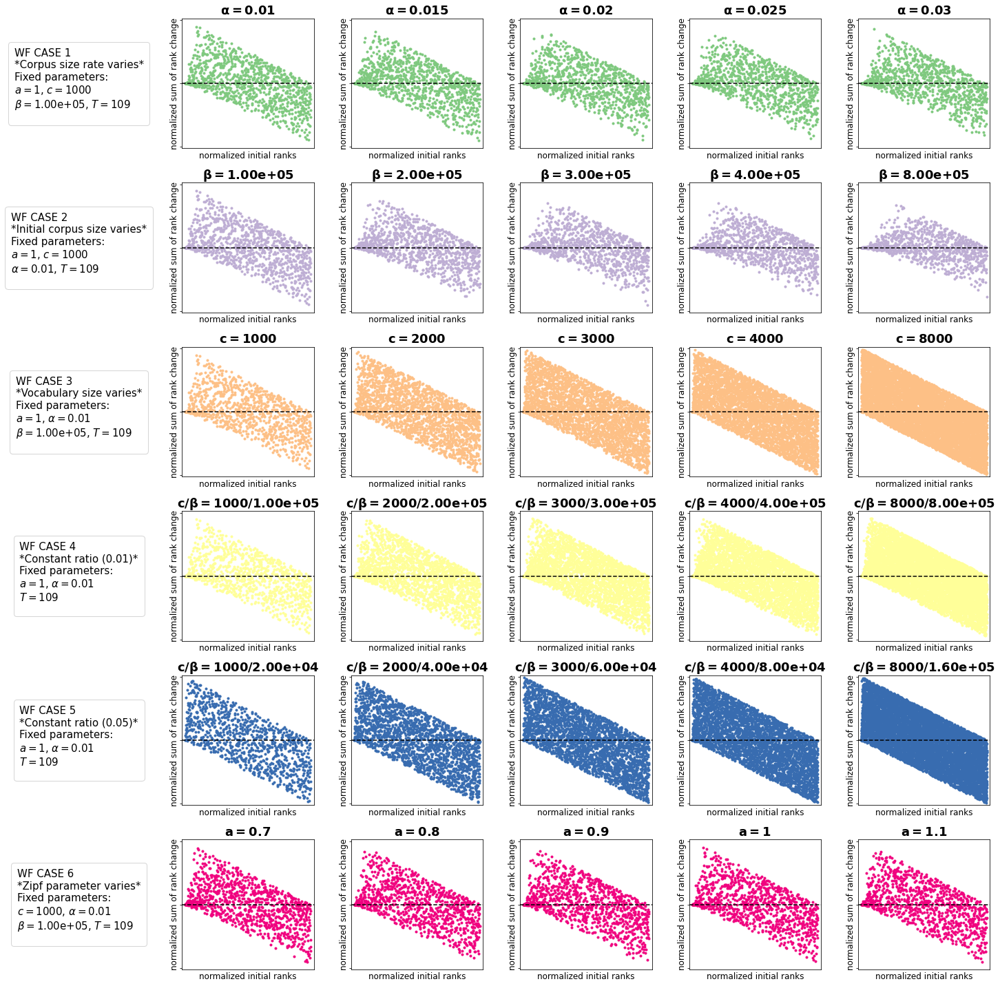

In [97]:
colors_accent = cm.get_cmap('Accent')
fig, ax = plt.subplots(6,6,figsize=(20.37,20),sharex=True,sharey=True)
for i, j in enumerate(WF_RANKS.keys()):
    ax[i,0].set_axis_off()
    ax[i,0].legend(loc=10,title=all_labels[j],title_fontsize=15)

for l, k in enumerate(WF_RANKS.keys()):
    print(k)
    for i, j in enumerate(all_params[k]):
        dayta = WF_RANKS[k][i]
        initial_ranks = dayta['ranks'][0].sort_index()
        initial_ranks_normed = initial_ranks.values / len(initial_ranks.values)
        drank_sum = dayta['drank-sum'].sort_index()
        drank_sum_normed = np.array(drank_sum.values) / len(np.array(drank_sum.values))

        ax[l,i+1].plot(initial_ranks_normed,drank_sum_normed,'.',color=colors_accent(l),label='all other words')
        ax[l,i+1].axhline(0,linestyle='--',color='black')
        ax[l,i+1].set_xlim(0-0.025,1+0.025)
        ax[l,i+1].set_ylim(-1-0.025,1+0.025)
        ax[l,i+1].set_xlabel('normalized initial ranks',fontsize=12)
        ax[l,i+1].set_ylabel('normalized sum of rank change',fontsize=12)
        if k == 'beta':
            ax[l,i+1].set_title(all_variab[k]+"{:.2e}".format(all_params[k][i]),fontweight='bold',fontsize=18)
        else:
            ax[l,i+1].set_title(all_variab[k]+str(all_params[k][i]),fontweight='bold',fontsize=18)
            
ax[5,i+1].axes.get_xaxis().set_ticks([])
plt.tight_layout(pad=0.50)
plt.savefig('figures/MAIN-1/rc-sum_vs_initial-ranks_wf_6x6.png')
plt.show()

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


alpha
beta
c
ratio1
ratio2
a


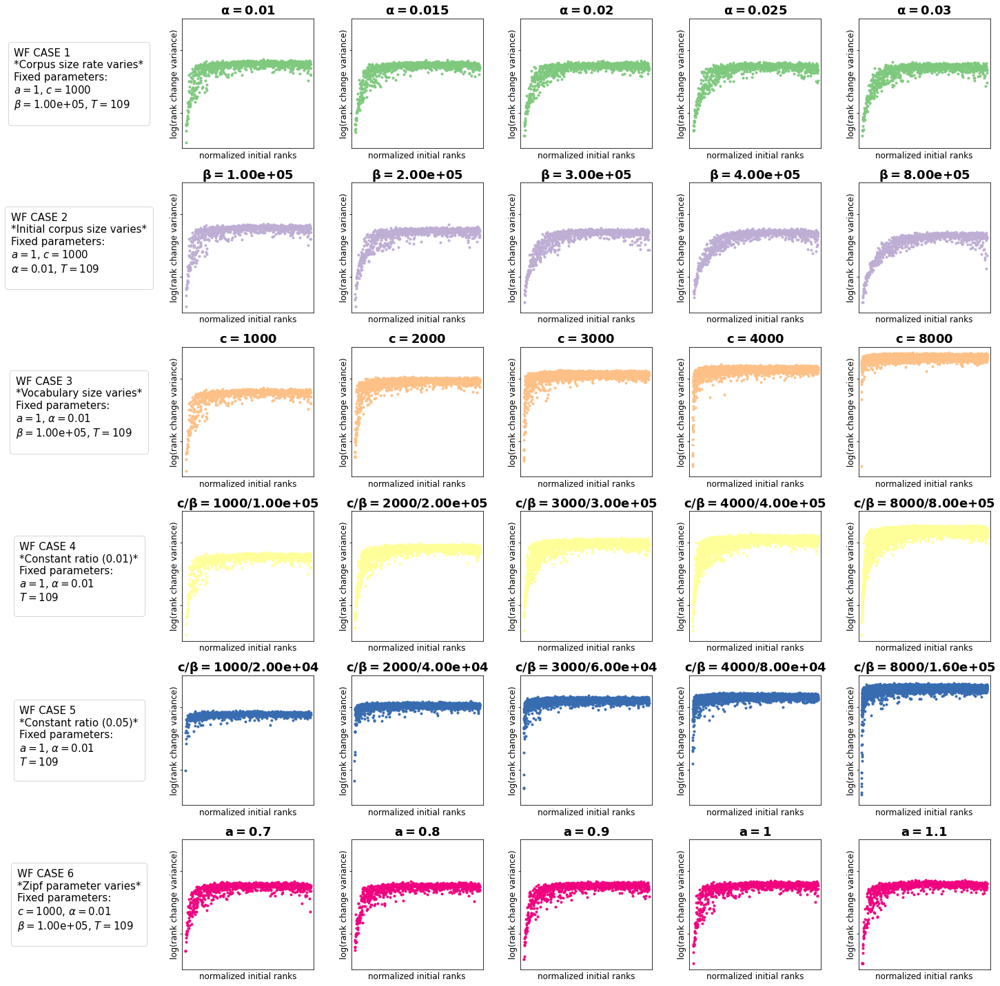

In [98]:
colors_accent = cm.get_cmap('Accent')
fig, ax = plt.subplots(6,6,figsize=(20.36,20),sharex=True,sharey=True)
for i, j in enumerate(WF_RANKS.keys()):
    ax[i,0].set_axis_off()
    ax[i,0].legend(loc=10,title=all_labels[j],title_fontsize=15)

for l, k in enumerate(WF_RANKS.keys()):
    print(k)
    for i, j in enumerate(all_params[k]):
        dayta = WF_RANKS[k][i]
        initial_ranks = dayta['ranks'][0].sort_index()
        initial_ranks_normed = initial_ranks.values / len(initial_ranks.values)
        drank_var = pd.DataFrame({'drank-variance':dayta['drank-variance']}).sort_index()
        drank_var_normed = np.log(drank_var) #drank_var / np.max(abs(drank_var)).values[0]

        ax[l,i+1].plot(initial_ranks_normed,drank_var_normed,'.',color=colors_accent(l),label='all other words')
        ax[l,i+1].set_xlim(0-0.025,1+0.025)
        #ax[l,i+1].set_ylim(0-0.025,1+0.025)
        ax[l,i+1].set_xlabel('normalized initial ranks',fontsize=12)
        ax[l,i+1].set_ylabel('log(rank change variance)',fontsize=12)
        if k == 'beta':
            ax[l,i+1].set_title(all_variab[k]+"{:.2e}".format(all_params[k][i]),fontweight='bold',fontsize=18)
        else:
            ax[l,i+1].set_title(all_variab[k]+str(all_params[k][i]),fontweight='bold',fontsize=18)

ax[5,i+1].axes.get_xaxis().set_ticks([])
plt.tight_layout(pad=0.50)
plt.savefig('figures/MAIN-1/rc-variance_vs_initial-ranks_wf_6x6.png')
plt.show()

In [99]:
WF_RBO_ttp1 = {}
WF_RBO_ttp1_delta = {}
WF_RBO_ttp10 = {}
WF_RBO_ttp10_delta = {}
WF_RBO_initt = {}
WF_RBO_initt_delta = {}
for wf_i in WF_RANKS.keys():
    WF_RBO_ttp1[wf_i] = {}
    WF_RBO_ttp1_delta[wf_i] = {}
    WF_RBO_ttp10[wf_i] = {}
    WF_RBO_ttp10_delta[wf_i] = {}
    WF_RBO_initt[wf_i] = {}
    WF_RBO_initt_delta[wf_i] = {}
    for wf_j in range(0,len(WF_RANKS[wf_i])):
        WF_LIST = WF_RANKS[wf_i][wf_j]['olist']
        t_initial = WF_LIST.columns[0]

        # RBO t -- t+1
        ttp1 = []
        for i in list(WF_LIST.keys())[:-1]:
            ttp1.append(rbo.RankingSimilarity(WF_LIST[i+1].values,WF_LIST[i].values).rbo())
        WF_RBO_ttp1[wf_i][wf_j] = ttp1

        # delta RBO t -- t+1
        ttp1_delta = []
        for i in range(0,len(ttp1)-1):
            ttp1_delta.append(ttp1[i+1]-ttp1[i])
        WF_RBO_ttp1_delta[wf_i][wf_j] = ttp1_delta

        # RBO t -- t+10
        ttp10 = []
        for i in list(WF_LIST.keys())[:-10]:
            ttp10.append(rbo.RankingSimilarity(WF_LIST[i+10].values,WF_LIST[i].values).rbo())
        WF_RBO_ttp10[wf_i][wf_j] = ttp10

        # delta RBO t -- t+10
        ttp10_delta = []
        for i in range(0,len(ttp10)-1):
            ttp10_delta.append(ttp10[i+1]-ttp10[i])
        WF_RBO_ttp10_delta[wf_i][wf_j] = ttp10_delta

        # RBO 0 -- t
        initt = []
        for i in list(WF_LIST.keys()):
            initt.append(rbo.RankingSimilarity(WF_LIST[t_initial].values,WF_LIST[i].values).rbo())
        WF_RBO_initt[wf_i][wf_j] = initt

        # delta RBO 0 -- t
        initt_delta = []
        for i in range(0,len(initt)-1):
            initt_delta.append(initt[i+1]-initt[i])
        WF_RBO_initt_delta[wf_i][wf_j] = initt_delta
        
WF_RBO_ttp1 = pd.DataFrame(WF_RBO_ttp1).T
WF_RBO_ttp1_delta = pd.DataFrame(WF_RBO_ttp1_delta).T
WF_RBO_ttp10 = pd.DataFrame(WF_RBO_ttp10).T
WF_RBO_ttp10_delta = pd.DataFrame(WF_RBO_ttp10_delta).T
WF_RBO_initt = pd.DataFrame(WF_RBO_initt).T
WF_RBO_initt_delta = pd.DataFrame(WF_RBO_initt_delta).T

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


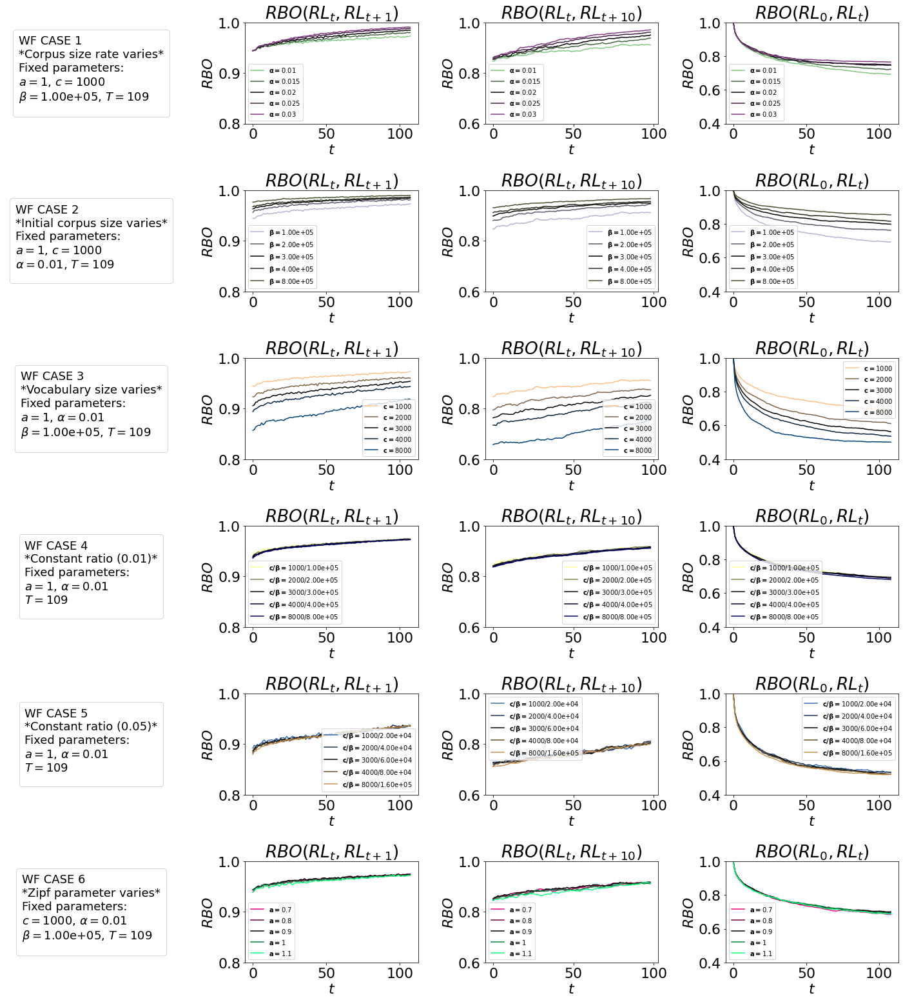

In [100]:
colors_accent = cm.get_cmap('Accent')
ax_vect = [(0,0),(0,1),(1,0),(1,1),(2,0),(2,1)]
linestyles = ['-','--','-.',':','-']
fig, ax = plt.subplots(6,4,figsize=(20,22))
for i, j in enumerate(WF_RBO_ttp1.T.keys()):
    ax[i,0].set_axis_off()
    ax[i,0].legend(loc=10,title=all_labels[j],title_fontsize=18)
for kk, k in enumerate(WF_RBO_ttp1.T.keys()):
    
    color = cl.to_hex(colors_accent(kk))
    color_complement = lp.get_complementary(color)
    c = cl.ColorConverter().to_rgb
    c_cmap = lp.make_colormap([c(color), c('black'), 0.50, c('black'), c(color_complement)])
    index_color = c_cmap(np.linspace(0,1,5))
    
    for j in range(0,5):
        rbo_ttp1_all = WF_RBO_ttp1.T[k][j]
        if k == 'beta':
            label_str = all_variab[k]+"{:.2e}".format(all_params[k][j])
        else:
            label_str = all_variab[k]+str(all_params[k][j])
        ax[kk,1].plot(rbo_ttp1_all,color=index_color[j],label=label_str)
    ax[kk,1].legend(loc=0,fontsize=10)
    ax[kk,1].set_xlabel(r'$t$')
    ax[kk,1].set_ylabel(r'$RBO$')
    ax[kk,1].set_ylim(0.80,1)
    ax[kk,1].set_title(r'$RBO(RL_{t},RL_{t+1})$')
    
    for j in range(0,5):
        rbo_ttp10_all = WF_RBO_ttp10.T[k][j]
        if k == 'beta':
            label_str = all_variab[k]+"{:.2e}".format(all_params[k][j])
        else:
            label_str = all_variab[k]+str(all_params[k][j])
        ax[kk,2].plot(rbo_ttp10_all,color=index_color[j],label=label_str)
    ax[kk,2].legend(loc=0,fontsize=10)
    ax[kk,2].set_xlabel(r'$t$')
    ax[kk,2].set_ylabel(r'$RBO$')
    ax[kk,2].set_ylim(0.60,1)
    ax[kk,2].set_title(r'$RBO(RL_{t},RL_{t+10})$')
    
    for j in range(0,5):
        rbo_initt_all = WF_RBO_initt.T[k][j]
        if k == 'beta':
            label_str = all_variab[k]+"{:.2e}".format(all_params[k][j])
        else:
            label_str = all_variab[k]+str(all_params[k][j])
        ax[kk,3].plot(rbo_initt_all,color=index_color[j],label=label_str)
    ax[kk,3].legend(loc=0,fontsize=10)
    ax[kk,3].set_xlabel(r'$t$')
    ax[kk,3].set_ylabel(r'$RBO$')
    ax[kk,3].set_ylim(0.40,1)
    ax[kk,3].set_title(r'$RBO(RL_{0},RL_{t})$')

plt.tight_layout()
plt.savefig('figures/MAIN-1/rbo-trajectories_wf_6x3.png')
plt.show()

#### 1.2.5. WF One Simulation with Parameter Set $\alpha=0.01$, $\beta=100000000$, $c=1000$, and $a=1$.

In [101]:
c = 1000 # vocabulary words
a = 1 # Zipf parameter
alpha = 0.01 # corpus size rate of change
beta = 100000000 # initial corpus size
T = 109 # total time elapsed (years)
color_wf = '#F1C40F'

# sampling of the next time step is the word proportions from the current time step
timer_start = time.process_time()
print('simulating one wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'...')
R, P, Z, S, N = wf20.wright_fisher(c,a,alpha,beta,0,0,T,[],[],0,set_seed=seed,steady=False)

# compute the ranks of the simulation
t_vect = P.columns
ranks = pd.DataFrame(np.zeros(P.shape,dtype=int),index=P.index,columns=P.columns)
olist = pd.DataFrame(np.zeros(P.shape,dtype=str),index=range(1,P.shape[0]+1),columns=P.columns)
for t in t_vect:
    val = lc.return_ranks(P[t])
    for ii, jj in val.items():
        ranks[t][ii] = jj
        olist[t][jj] = ii
dranks = lc.generate_delta(ranks)
rc_la = {'drank-variance':{},'drank-sum':{}}
drank_sum = np.sum(dranks,axis=1)
drank_var = np.var(dranks,axis=1)
RK = {'ranks':ranks,'dranks':dranks,'olist':olist,'drank-variance':drank_var,'drank-sum':drank_sum}
timer_end = time.process_time()
time_elapsed = timer_end - timer_start
print('Done in '+str(round(time_elapsed/60,2))+' minutes')

simulating one wf_c1000_a1_alpha0.01_beta100000000_T109...
Done in 27.94 minutes


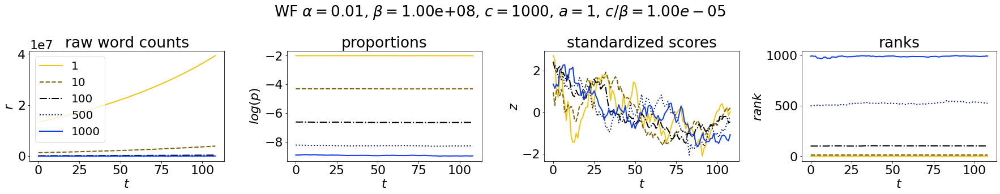

In [102]:
WF_example_words = [1,10,100,500,1000]

# FIGURE: selected time series
fig, ax = plt.subplots(1,4,figsize=(25,5))
lp.time_series_plot(data=R.loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$r$',title='raw word counts',color='#F1C40F',
               legend=True,annotation=False,ax=ax[0])
lp.time_series_plot(data=np.log(P.loc[WF_example_words,:].T),xlabel=r'$t$',ylabel=r'$log(p)$',title='proportions',color='#F1C40F',
               legend=True,annotation=False,ax=ax[1])
lp.time_series_plot(data=Z.loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$z$',title='standardized scores',color='#F1C40F',
               legend=True,annotation=False,ax=ax[2])
lp.time_series_plot(data=RK['ranks'].loc[WF_example_words,:].T,xlabel=r'$t$',ylabel=r'$rank$',title='ranks',color='#F1C40F',
               legend=True,annotation=False,ax=ax[3])
ax[0].legend(loc=2,fontsize=20)
ax[1].get_legend().remove()
ax[2].get_legend().remove()
ax[3].get_legend().remove()
plt.suptitle(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+r', $c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$'+'\n')
plt.tight_layout()
plt.subplots_adjust(top=0.75)
plt.savefig('figures/MAIN-1/multiple-time-series-rpz_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

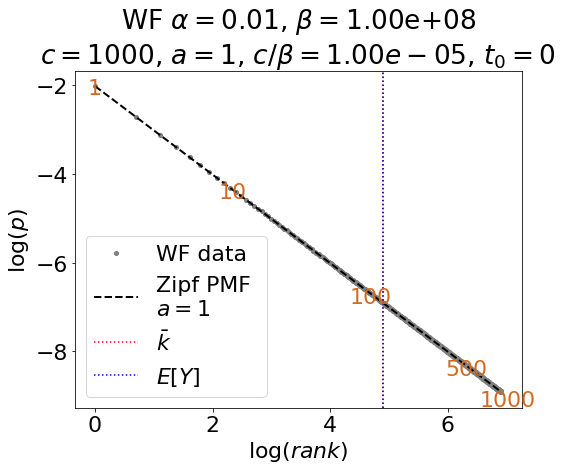

In [103]:
# FIGURE: WF visualization of the initial Zipf distribution
t = 0

fig, ax = plt.subplots(1,1,figsize=(8,7))
p_vect = P[t]
empirical_ranks = lc.return_ranks(p_vect)
er = np.array(list(empirical_ranks.values()),dtype=float)
er_keys = list(empirical_ranks.keys())
p_vect_sorted = np.array(list(p_vect.loc[er_keys].values),dtype=float)

zipf_pmf, zipf_cdf = wf20.zipf(er,a)

E_theory = wf20.zipf_E(er,a)
E_empirical = lc.zipf_E_data(er,p_vect)

example_words_p_vect = []
example_words_empirical_ranks = []
for ew in WF_example_words:
    example_words_p_vect.append(p_vect[ew])
    example_words_empirical_ranks.append(empirical_ranks[ew])

ax.plot(np.log(er),np.log(p_vect_sorted),'.',
                         markersize=8,color='gray',label='WF data')
for i, j in enumerate(WF_example_words):
    xy_vect = (np.log(example_words_empirical_ranks[i]), np.log(example_words_p_vect[i]))
    ax.annotate(j,
                xy=xy_vect, xycoords='data',
                xytext=(xy_vect[0], xy_vect[1]), textcoords='offset points',color='chocolate',
                horizontalalignment='center', verticalalignment='center')
ax.plot(np.log(er),np.log(zipf_pmf),
                         linewidth=2,linestyle='--',color='black',
                         label='Zipf PMF \n'+r'$a='+str(a)+'$')
ax.axvline(np.log(E_empirical),label=r'$\bar{k}$',linestyle=':',color='red')
ax.axvline(np.log(E_theory),label=r'$E[Y]$',linestyle=':',color='blue')
ax.set_xlabel(r'$\log{(rank)}$')
ax.set_ylabel(r'$\log{(p)}$')
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$'+r', $t_0='+str(t)+'$')
ax.legend(loc=3)
plt.tight_layout()
plt.savefig('figures/MAIN-1/initial-zipf_data-curve-fit_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

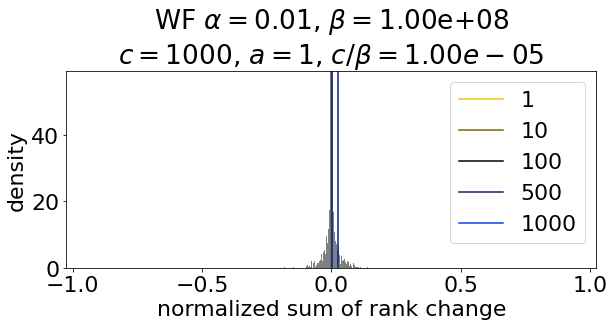

In [104]:
# define colormap given a color
color = '#F1C40F'
match_hex = re.search(r'^#(?:[0-9a-fA-F]{3}){1,2}$', color)
if not match_hex:
    try:
        color = colors_hex[color]
    except:
        print('Color '+str(color)+' not available. Try converting it to hexadecimal. Using default color...')
        color = colors_hex['red']
color_complement = lp.get_complementary(color)
c_conv = cl.ColorConverter().to_rgb
c_cmap = lp.make_colormap([c_conv(color), c_conv('black'), 0.50, c_conv('black'), c_conv(color_complement)])
index_color = c_cmap(np.linspace(0,1,len(WF_example_words)))

fig, ax = plt.subplots(1,1,figsize=(9,5))
ds_all = RK['drank-sum']
al_vals = {}
for i in ds_all.keys(): 
    al_vals[i] = ds_all[i]/len(ds_all)
al_vals = pd.DataFrame({'drank-sum':al_vals})

ax.hist(al_vals.values,bins=100,density=True,color='gray')
for i, j in enumerate(WF_example_words):
    ax.axvline(al_vals['drank-sum'][j],color=index_color[i],label=j)
ax.set_xlim(-1-0.025,1+0.025)
ax.set_xlabel('normalized sum of rank change')
ax.set_ylabel('density')
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$')
ax.legend(loc=1)

plt.tight_layout()
plt.savefig('figures/MAIN-1/rc-sum-distribution_list-of-words_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

In [105]:
def l(beta,c,pw,pv,z=4):
    N = beta-c
    mu_w = N*pw
    sigma_w = N*pw*(1-pw)
    mu_v = N*pv
    sigma_v = N*pv*(1-pv)
    return min(mu_w+z*np.sqrt(sigma_w),mu_v+z*np.sqrt(sigma_v)) - max(mu_w-z*np.sqrt(sigma_w),mu_v-z*np.sqrt(sigma_v))

def ol(w,beta,c,p_vect):
    ol_sum = 0
    for i, v in enumerate(p_vect):
        if (w-1) != i:
            if l(beta,c,p_vect[w-1],p_vect[i]) > 0:
                if w-1 < i:
                    ol_sum += 1
                elif w-1 > i:
                    ol_sum -= 1
    return ol_sum

# compute overlap vector
pmf_zipf, cdf_zipf = wf20.zipf(range(1,c+1),a)
ol_vect = []
for w in tqdm(range(1,c+1)):
    ol_vect.append(ol(w,beta,c,pmf_zipf)/c)

100%|██████████| 1000/1000 [00:09<00:00, 106.56it/s]


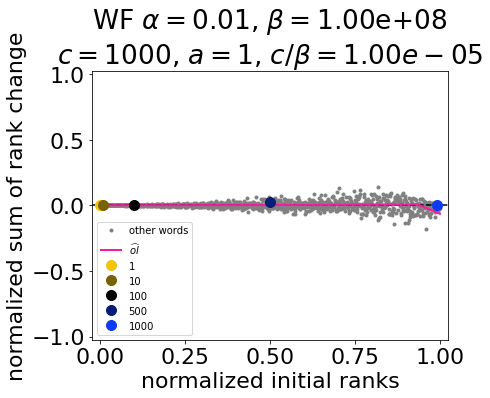

In [106]:
t = 0
dayta = RK

initial_ranks = dayta['ranks'][t].sort_index()
initial_ranks_normed = initial_ranks.values / len(initial_ranks.values)
drank_sum = dayta['drank-sum'].sort_index()
drank_sum_normed = np.array(drank_sum.values) / len(np.array(drank_sum.values))

fig, ax = plt.subplots(1,1,figsize=(7,6))
ax.plot(initial_ranks_normed,drank_sum_normed,'.',color='gray',label='other words')
ax.axhline(0,linestyle='--',color='black')
ax.plot(np.linspace(0,1,len(ol_vect)),ol_vect,'-',linewidth=2,color='#F81AA1',label=r'$\widehat{ol}$')
for i, j in enumerate(WF_example_words):
    plt.plot(initial_ranks_normed[j-1],drank_sum_normed[j-1],'.',markersize=20,label=j,color=index_color[i])
ax.set_xlim(0-0.025,1+0.025)
ax.set_ylim(-1-0.025,1+0.025)
ax.set_xlabel('normalized initial ranks')
ax.set_ylabel('normalized sum of rank change')
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$')
ax.legend(loc=3,fontsize=10)

plt.tight_layout()
plt.savefig('figures/MAIN-1/rc-sum_vs_initial-ranks_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

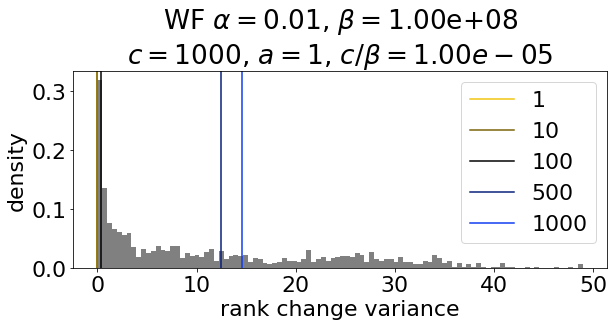

In [107]:
fig, ax = plt.subplots(1,1,figsize=(9,5))
al_vals = RK['drank-variance']
#al_vals = al_vals/np.max(abs(al_vals))

ax.hist(al_vals.values,bins=100,density=True,color='gray')
for i, j in enumerate(WF_example_words):
    ax.axvline(al_vals[j],color=index_color[i],label=j)
#ax.set_xlim(0-0.025,1+0.025)
ax.set_xlabel('rank change variance')
ax.set_ylabel('density')
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$')
ax.legend(loc=0)

plt.tight_layout()
plt.savefig('figures/MAIN-1/rc-variance-distribution_list-of-words_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

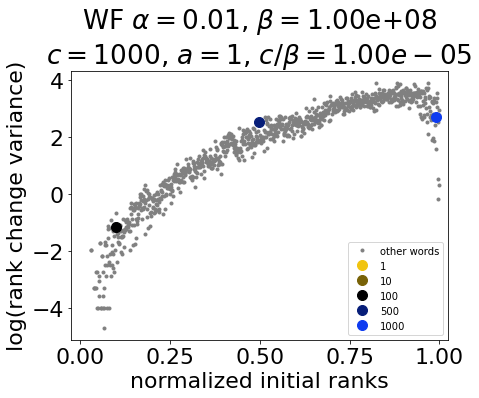

In [108]:
t = 0
dayta = RK

initial_ranks = dayta['ranks'][t].sort_index()
vocab_size = len(initial_ranks.values)
initial_ranks_normed = initial_ranks.values / vocab_size
drank_var = pd.DataFrame({'drank-variance':dayta['drank-variance']}).sort_index()
max_norm = np.max(abs(drank_var)).values[0]
drank_var_normed = np.log(drank_var) #drank_var / max_norm

fig, ax = plt.subplots(1,1,figsize=(7,6))
ax.plot(initial_ranks_normed,drank_var_normed,'.',color='gray',label='other words')
for i, j in enumerate(WF_example_words):
    plt.plot(initial_ranks_normed[j-1],drank_var_normed['drank-variance'][j],'.',markersize=20,label=j,color=index_color[i])
ax.set_xlim(0-0.025,1+0.025)
#ax.set_ylim(0-0.025,1+0.025)
ax.set_xlabel('normalized initial ranks')
ax.set_ylabel('log(rank change variance)')
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$')
ax.legend(loc=4,fontsize=10)

plt.tight_layout()
plt.savefig('figures/MAIN-1/rc-variance_vs_initial-ranks_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

In [109]:
WF_LIST = RK['olist']
t_initial = WF_LIST.columns[0]

# RBO t -- t+1
ttp1 = []
for i in list(WF_LIST.keys())[:-1]:
    ttp1.append(rbo.RankingSimilarity(WF_LIST[i+1].values,WF_LIST[i].values).rbo())
WF_RBO_ttp1 = ttp1

# delta RBO t -- t+1
ttp1_delta = []
for i in range(0,len(ttp1)-1):
    ttp1_delta.append(ttp1[i+1]-ttp1[i])
WF_RBO_ttp1_delta = ttp1_delta

# RBO t -- t+10
ttp10 = []
for i in list(WF_LIST.keys())[:-10]:
    ttp10.append(rbo.RankingSimilarity(WF_LIST[i+10].values,WF_LIST[i].values).rbo())
WF_RBO_ttp10 = ttp10

# delta RBO t -- t+10
ttp10_delta = []
for i in range(0,len(ttp10)-1):
    ttp10_delta.append(ttp10[i+1]-ttp10[i])
WF_RBO_ttp10_delta = ttp10_delta

# RBO 0 -- t
initt = []
for i in list(WF_LIST.keys()):
    initt.append(rbo.RankingSimilarity(WF_LIST[t_initial].values,WF_LIST[i].values).rbo())
WF_RBO_initt = initt

# delta RBO 0 -- t
initt_delta = []
for i in range(0,len(initt)-1):
    initt_delta.append(initt[i+1]-initt[i])
WF_RBO_initt_delta = initt_delta

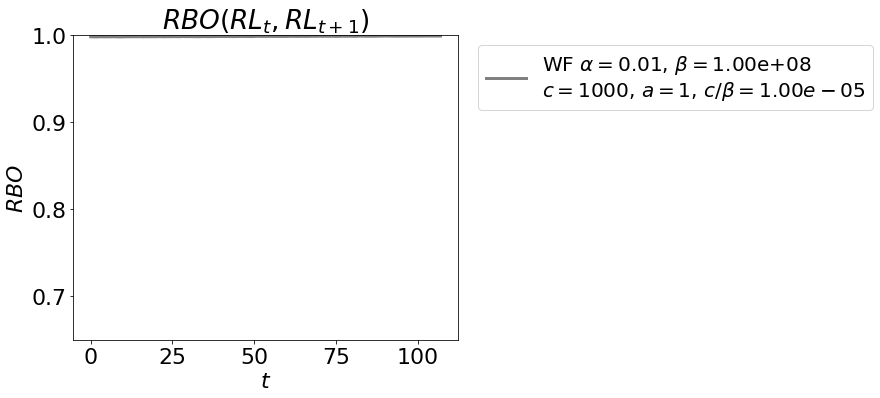

In [110]:
fig, ax = plt.subplots(1,1,figsize=(13,6))
ax.plot(WF_RBO_ttp1,color='gray',label=r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$',linewidth=3)
ax.set_xlabel(r'$t$')
ax.set_ylabel(r'$RBO$')
ax.set_ylim(0.65,1)
ax.set_title(r'$RBO(RL_{t},RL_{t+1})$')
ax.legend(fontsize=20, bbox_to_anchor=(1.025, 1), loc='upper left')
plt.tight_layout()
plt.savefig('figures/MAIN-1/rbo-ttp1_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

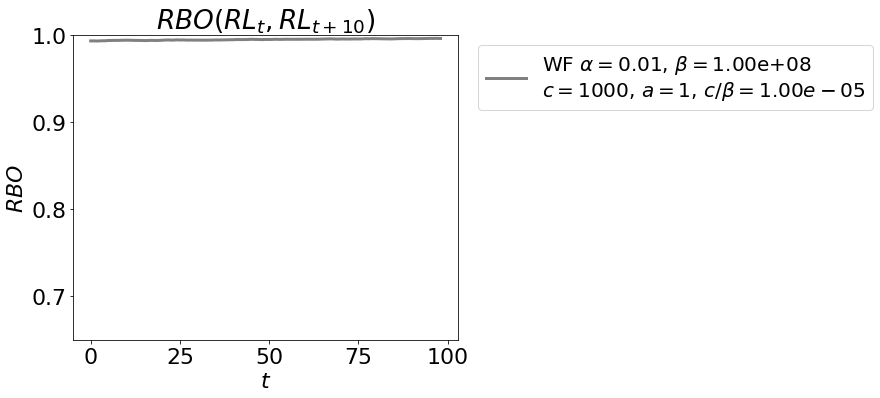

In [111]:
fig, ax = plt.subplots(1,1,figsize=(13,6))
ax.plot(WF_RBO_ttp10,color='gray',label=r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$',linewidth=3)
ax.set_xlabel(r'$t$')
ax.set_ylabel(r'$RBO$')
ax.set_ylim(0.65,1)
ax.set_title(r'$RBO(RL_{t},RL_{t+10})$')
ax.legend(fontsize=20, bbox_to_anchor=(1.025, 1), loc='upper left')
plt.tight_layout()
plt.savefig('figures/MAIN-1/rbo-ttp10_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

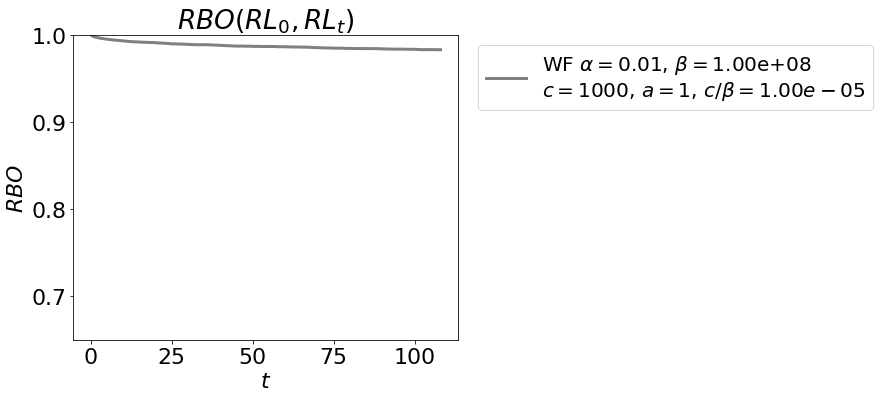

In [112]:
fig, ax = plt.subplots(1,1,figsize=(13,6))
ax.plot(WF_RBO_initt,color='gray',label=r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$',linewidth=3)
ax.set_xlabel(r'$t$')
ax.set_ylabel(r'$RBO$')
ax.set_ylim(0.65,1)
ax.set_title(r'$RBO(RL_{0},RL_{t})$')
ax.legend(fontsize=20, bbox_to_anchor=(1.025, 1), loc='upper left')
plt.tight_layout()
plt.savefig('figures/MAIN-1/rbo-initt_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

#### Extra Section - Turnover

In [113]:
# turnover equation (Evans and Giometto 2011 eq. 4), (Acerbi et. al. 2014 eq. 1) and/or (Ruck et. al. 2017 eq. 1)
# b = 0.86 means unbiased copying according to Acerbu i et. al. 2014 and Ruck et. al. 2017
def turnover(mu,y,n,d=1.38,a=0.55,b=0.86,c=0.13):
    return d*(np.power(mu,a))*(np.power(y,b))*(np.power(n,c))

# generic turnover equation
def turnover_gen(y,a,b=0.86):
    return a*(np.power(y,b))

In [114]:
y = list(range(0,100,1)) # top y list
a = 1
b = 0.86
z_theory = turnover_gen(y,a,b)

In [115]:
turnover_rates = {'y':[],'z':[],'z-theory':z_theory}

for i in y:
    new_words = []
    for j in range(1,109,1):
        t_turn = set(RK['olist'][0:i][j-1])
        t1_turn = set(RK['olist'][0:i][j])

        new_words.extend(list(t1_turn.difference(t_turn)))
        
    turnover_rates['y'].append(i)
    turnover_rates['z'].append(len(np.unique(new_words)))
    
TR = pd.DataFrame(turnover_rates)

In [116]:
# fit
parameters, covariance = curve_fit(turnover_gen, TR['y'], TR['z'])
a_fit = round(parameters[0],2)
b_fit = round(parameters[1],2)
TR['z-fit'] = turnover_gen(y,a=parameters[0],b=parameters[1])

In [117]:
# mean normalizations
TR['z-norm'] = TR['z']/np.mean(TR['z'])
TR['z-fit-norm'] = TR['z-fit']/np.mean(TR['z-fit'])
TR['z-theory-norm'] = TR['z-theory']/np.mean(TR['z-theory'])

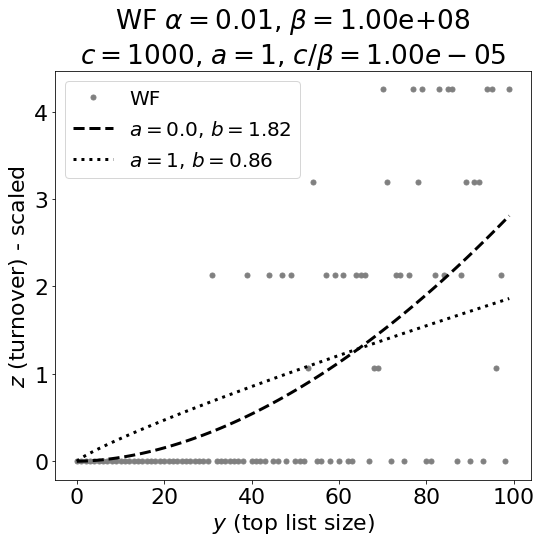

In [118]:
fig, ax = plt.subplots(1,1,figsize=(8,8))

ax.plot(TR['y'],TR['z-norm'],'.',markersize=10,color='gray',label='WF')
ax.plot(TR['y'],TR['z-fit-norm'],'--',linewidth=3,color='black',label=r'$a=$'+str(a_fit)+r', $b=$'+str(b_fit))
ax.plot(TR['y'],TR['z-theory-norm'],':',linewidth=3,label=r'$a=$'+str(a)+r', $b=$'+str(b),color='black')
ax.set_xlabel(r'$y$ (top list size)')
ax.set_ylabel(r'$z$ (turnover) - scaled')
ax.set_title(r'WF $\alpha=$'+str(alpha)+r', $\beta=$'+"{:.2e}".format(beta)+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+r', $c/\beta='+"{:.2e}".format(round(c/beta,5))+r'$')
ax.legend(fontsize=20, loc=2)
plt.tight_layout()
plt.savefig('figures/MAIN-1/turnover_wf_c'+str(c)+'_a'+str(a)+'_alpha'+str(alpha)+'_beta'+str(beta)+'_T'+str(T)+'.png')
plt.show()

## 2. The Google Unigram Data.

### 2.1. Load Processed Data.

In [147]:
# Google Ngram lists
n = '1'
l_codes = ['eng','eng-us','eng-gb','eng-fiction','chi-sim','fre','ger','ita','heb','rus','spa']
l_short_codes = {'eng':'en','chi-sim':'zh-cn','fre':'fr','ger':'de','ita':'it','heb':'he','rus':'ru','spa':'es'}
languages = ['English','American English','British English','English Fiction',
             'Simplified Chinese','French','German','Italian','Hebrew','Russian','Spanish']
l_plot_grids = {'eng':(0,0),'eng-us':(0,1),'eng-gb':(0,2),
                'eng-fiction':(1,0),'chi-sim':(1,1),'fre':(1,2),
               'ger':(2,0),'ita':(2,1),'heb':(2,2),
                'rus':(3,0),'spa':(3,1)}
l_labels = {j:languages[i] for i, j in enumerate(l_codes)}
colors_accent = cm.get_cmap('tab20')
l_colors = {j:colors_accent(i) for i, j in enumerate(l_codes)}

In [148]:
# load Google Ngram data
LA = {}
LA_RANKS = {}
for l in l_codes:
    print(l+'...')
    D = gn.read(n,l,ignore_case=True,restriction=True,annotation=False)
    for k in D.keys():
        try:
             D[k] = D[k].T.sort_index().T
        except:
             pass
    LA[l] = D
    LA_RANKS[l] = pkl.load(open(precomp_rc_dir+'/ranks_'+l+'.pkl','rb'))
LA_summary = pd.read_csv(precomp_gn_dir+'/data-summary.csv',index_col=0)
LA_summary

eng...
eng-us...
eng-gb...
eng-fiction...
chi-sim...
fre...
ger...
ita...
heb...
rus...
spa...


,language,c (data),beta (data),ln(beta) (data),c (data) / beta (data),T (data),min(r) (data),max(r) (data)
eng,English,18737,2088730069,21.4598,0.000009,109,580,99697894
eng-us,American English,16410,1802894507,21.3127,0.000009,109,612,81890411
eng-gb,British English,4759,652318376,20.2960,0.000007,109,884,18090596
eng-fiction,English Fiction,5651,188843546,19.0564,0.000030,109,284,6424749
chi-sim,Simplified Chinese,180,947267,13.7613,0.000190,109,1,1418
fre,French,12168,859870065,20.5723,0.000014,109,269,10910785
ger,German,5871,359840835,19.7012,0.000016,109,261,3596386
ita,Italian,4446,168812229,18.9443,0.000026,109,386,3745641
heb,Hebrew,3000,20838695,16.8523,0.000144,109,13,203957
rus,Russian,828,68919792,18.0485,0.000012,109,665,1492799


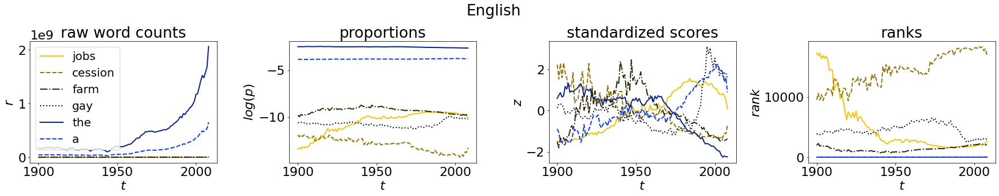

In [149]:
l = 'eng'

# example time-series
LA_example_words = ['jobs','cession','farm','gay','the','a']

# FIGURE: selected time series
fig, ax = plt.subplots(1,4,figsize=(25,5))
lp.time_series_plot(data=LA[l]['rscore'].loc[LA_example_words,:].T,xlabel=r'$t$',ylabel=r'$r$',title='raw word counts',color='#F1C40F',
               legend=True,annotation=False,ax=ax[0])
lp.time_series_plot(data=np.log(LA[l]['pscore'].loc[LA_example_words,:].T),xlabel=r'$t$',ylabel=r'$log(p)$',title='proportions',color='#F1C40F',
               legend=True,annotation=False,ax=ax[1])
lp.time_series_plot(data=LA[l]['zscore'].loc[LA_example_words,:].T,xlabel=r'$t$',ylabel=r'$z$',title='standardized scores',color='#F1C40F',
               legend=True,annotation=False,ax=ax[2])
lp.time_series_plot(data=LA_RANKS[l]['ranks'].loc[LA_example_words,:].T,xlabel=r'$t$',ylabel=r'$rank$',title='ranks',color='#F1C40F',
               legend=True,annotation=False,ax=ax[3])
ax[0].legend(loc=2,fontsize=20)
ax[1].get_legend().remove()
ax[2].get_legend().remove()
ax[3].get_legend().remove()
plt.suptitle(l_labels[l])
plt.tight_layout()
plt.subplots_adjust(top=0.80)
plt.savefig('figures/MAIN-1/multiple-time-series-rpz_'+l+'_with-selected-time-series.png')
plt.show()

### 2.2. Corpus Size.

In [150]:
# corpus size function
def corpus_size(t,alpha,beta):
    return np.ceil(beta*np.exp(alpha*t))

# log transformed exponential (no ceil function)
def corpus_size_log(t,alpha,beta):
    return alpha*t + np.log(beta)

In [151]:
# corpus size fitting
LA_corpusSize_fits = pd.read_csv(precomp_gn_dir+'/corpus-size-fits.csv',index_col=0)
LA_corpusSize_fits

,language,alpha (fit),alpha (99% CI),ln(beta) (fit),ln(beta) (99% CI),ln(beta) (data),c (data),c (data) / beta (fit),c (data) / beta (data)
eng,English,0.0239,"(0.021, 0.0267)",20.7866,"(20.5867, 20.953)",21.4598,18737,0.000018,0.000009
eng-us,American English,0.0215,"(0.0185, 0.0245)",20.6247,"(20.4173, 20.7964)",21.3127,16410,0.000018,0.000009
eng-gb,British English,0.0179,"(0.0142, 0.0215)",19.5205,"(19.2605, 19.7267)",20.2960,4759,0.000016,0.000007
eng-fiction,English Fiction,0.0306,"(0.0265, 0.0347)",18.0306,"(17.735, 18.2585)",19.0564,5651,0.000083,0.000030
chi-sim,Simplified Chinese,0.1068,"(0.0975, 0.1162)",9.4742,"(8.595, 9.9347)",13.7613,180,0.013826,0.000190
fre,French,0.0109,"(0.0075, 0.0142)",19.8126,"(19.5795, 20.0015)",20.5723,12168,0.000030,0.000014
ger,German,0.0120,"(0.0082, 0.0159)",19.3325,"(19.0549, 19.5496)",19.7012,5871,0.000024,0.000016
ita,Italian,0.0208,"(0.0181, 0.0235)",18.3050,"(18.1225, 18.4593)",18.9443,4446,0.000050,0.000026
heb,Hebrew,0.0342,"(0.03, 0.0383)",15.8291,"(15.5314, 16.0581)",16.8523,3000,0.000401,0.000144
rus,Russian,0.0319,"(0.0269, 0.0369)",17.3915,"(17.0154, 17.6642)",18.0485,828,0.000023,0.000012


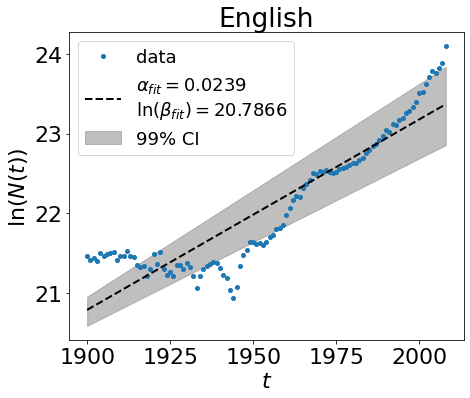

In [152]:
# FIGURE: english visualization of the corpus size fitted function into the actual data
l = 'eng'
fig, ax = plt.subplots(1,1,figsize=(7,6))
time_vect = np.array(range(0,LA[l]['rscore'].shape[1]))
time_vect_years = LA[l]['rscore'].columns
alpha_fit = LA_corpusSize_fits['alpha (fit)'][l]
alpha_ci = np.fromstring(LA_corpusSize_fits['alpha (99% CI)'][l].replace('(','').replace(')',''),sep=',')
beta_fit = LA_corpusSize_fits['ln(beta) (fit)'][l]
beta_ci = np.fromstring(LA_corpusSize_fits['ln(beta) (99% CI)'][l].replace('(','').replace(')',''),sep=',')
N_data = np.sum(LA[l]['rscore']).values
ax.plot(time_vect_years,np.log(N_data),'.',
                         markersize=8,color=l_colors[l],label='data')
ax.plot(time_vect_years,corpus_size_log(time_vect,alpha_fit,np.exp(beta_fit)),
                         linewidth=2,linestyle='--',color='black',
                         label=r'$\alpha_{fit}='+str(alpha_fit)+'$ \n'+r'$\ln{(\beta_{fit})}='+str(beta_fit)+'$')
ax.fill_between(time_vect_years,corpus_size_log(time_vect,alpha_ci[0],np.exp(beta_ci[0])),corpus_size_log(time_vect,alpha_ci[1],np.exp(beta_ci[1])),
                         color='gray',alpha=0.50,label='99% CI')
ax.set_xlabel(r'$t$')
ax.set_ylabel(r'$\ln{(N(t))}$')
ax.set_title(l_labels[l])
ax.legend(loc=0,fontsize=18)
plt.tight_layout()
plt.savefig('figures/MAIN-1/corpus-size_data-curve-fit_'+l+'.png')
plt.show()

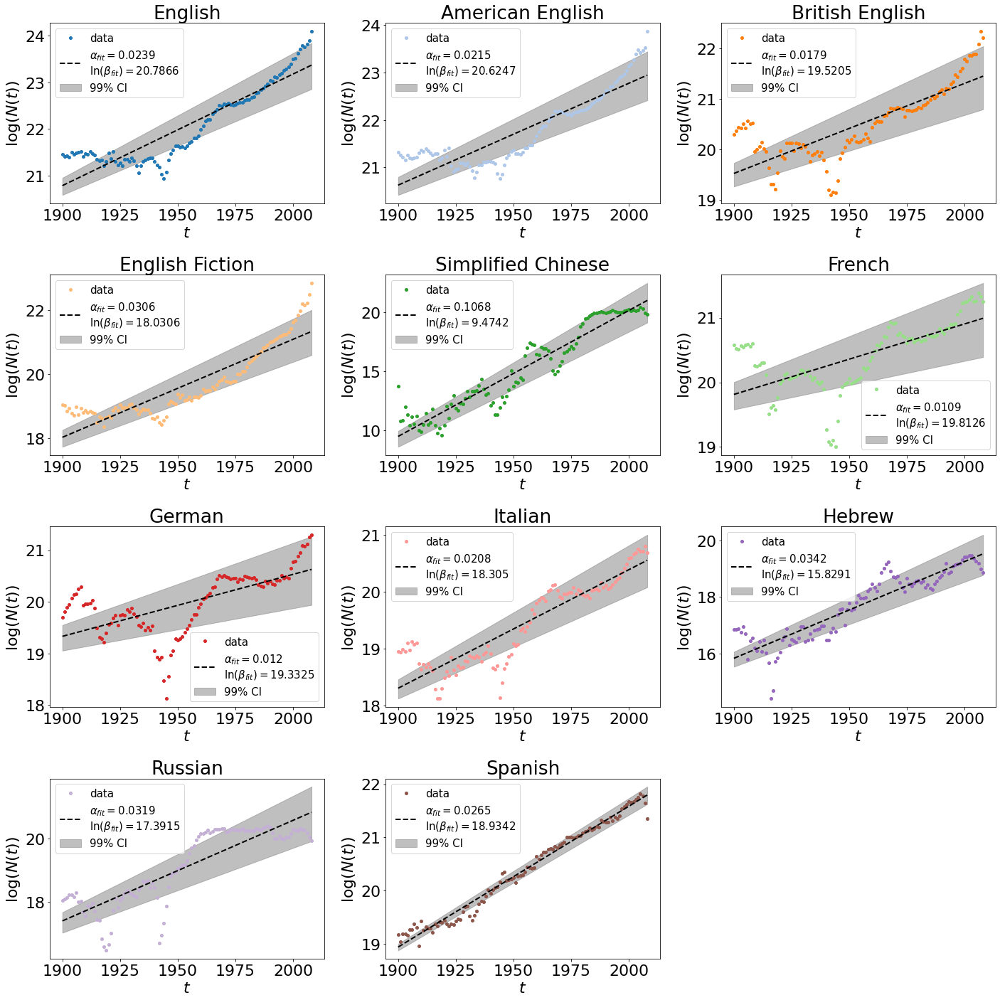

In [153]:
# FIGURE: visualization of the corpus size fitted function into the actual data
fig, ax = plt.subplots(4,3,figsize=(20,20))
for l_i, l in enumerate(l_codes):
    
    time_vect = np.array(range(0,LA[l]['rscore'].shape[1]))
    time_vect_years = LA[l]['rscore'].columns
    alpha_fit = LA_corpusSize_fits['alpha (fit)'][l]
    alpha_ci = np.fromstring(LA_corpusSize_fits['alpha (99% CI)'][l].replace('(','').replace(')',''),sep=',')
    beta_fit = LA_corpusSize_fits['ln(beta) (fit)'][l]
    beta_ci = np.fromstring(LA_corpusSize_fits['ln(beta) (99% CI)'][l].replace('(','').replace(')',''),sep=',')
    N_data = np.sum(LA[l]['rscore']).values
    ax[l_plot_grids[l]].plot(time_vect_years,np.log(N_data),'.',
                             markersize=8,color=l_colors[l],label='data')
    ax[l_plot_grids[l]].plot(time_vect_years,corpus_size_log(time_vect,alpha_fit,np.exp(beta_fit)),
                             linewidth=2,linestyle='--',color='black',
                             label=r'$\alpha_{fit}='+str(alpha_fit)+'$ \n'+r'$\ln{(\beta_{fit})}='+str(beta_fit)+'$')
    ax[l_plot_grids[l]].fill_between(time_vect_years,corpus_size_log(time_vect,alpha_ci[0],np.exp(beta_ci[0])),corpus_size_log(time_vect,alpha_ci[1],np.exp(beta_ci[1])),
                             color='gray',alpha=0.50,label='99% CI')
    ax[l_plot_grids[l]].set_xlabel(r'$t$')
    ax[l_plot_grids[l]].set_ylabel(r'$\log{(N(t))}$')
    ax[l_plot_grids[l]].set_title(l_labels[l])
    ax[l_plot_grids[l]].legend(loc=0,fontsize=15)
ax[3,2].axis('off')
plt.tight_layout()
plt.savefig('figures/MAIN-1/corpus-size_data-curve-fit_4x3.png')
plt.show()

### 2.3. The Initial Word Rank Distribution.

In [154]:
# zipf probabilities (log-log transform) this is the function used to fit the data
def zipf_loglog(x,a,b):
    return (-1*a*x)+b

In [155]:
# zipf distribution fitting
LA_zipfParameter_fits = pd.read_csv(precomp_gn_dir+'/initial-zipf-fits.csv',index_col=0)
LA_zipfParameter_fits

,language,c (data),a (fit),a (99% CI),b (fit),b (99% CI),E (data),E (theory)
eng,English,18737,0.9923,"(0.9879, 0.9967)",-2.339599,"(-2.367, -2.3122)",1219.73,1857.48
eng-us,American English,16410,1.0056,"(1.0016, 1.0095)",-2.250025,"(-2.2742, -2.2258)",1129.22,1559.32
eng-gb,British English,4759,1.0388,"(1.0316, 1.0461)",-2.004164,"(-2.042, -1.9663)",446.18,457.06
eng-fiction,English Fiction,5651,1.0776,"(1.0662, 1.0889)",-1.736749,"(-1.7958, -1.6777)",445.74,455.58
chi-sim,Simplified Chinese,180,0.8244,"(0.6986, 0.9501)",-2.122029,"(-2.4401, -1.8039)",27.92,42.21
fre,French,12168,0.9969,"(0.9881, 1.0058)",-2.308975,"(-2.3617, -2.2563)",954.15,1233.70
ger,German,5871,1.0317,"(1.0201, 1.0432)",-2.001860,"(-2.0643, -1.9394)",549.97,563.91
ita,Italian,4446,0.9948,"(0.9856, 1.0039)",-2.118907,"(-2.1668, -2.071)",462.50,504.34
heb,Hebrew,3000,0.9771,"(0.9664, 0.9878)",-2.272429,"(-2.3237, -2.2211)",293.16,376.28
rus,Russian,828,0.9151,"(0.8937, 0.9365)",-2.176063,"(-2.2586, -2.0936)",112.13,140.24


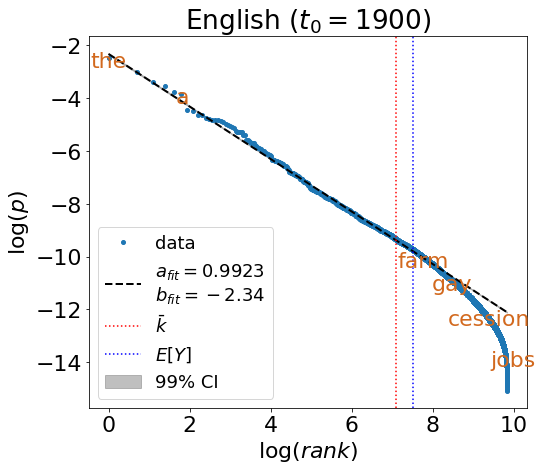

In [156]:
# FIGURE: english visualization of the Zipf fitted function into the actual data
l = 'eng'
t = 1900

fig, ax = plt.subplots(1,1,figsize=(8,7))
p_vect = LA[l]['pscore'][t]
empirical_ranks = lc.return_ranks(p_vect)
er = np.array(list(empirical_ranks.values()),dtype=float)
er_keys = list(empirical_ranks.keys())
p_vect_sorted = np.array(list(p_vect.loc[er_keys].values),dtype=float)

example_words_p_vect = []
example_words_empirical_ranks = []
for ew in LA_example_words:
    example_words_p_vect.append(p_vect[ew])
    example_words_empirical_ranks.append(empirical_ranks[ew])

a_fit = LA_zipfParameter_fits['a (fit)'][l]
a_ci = np.fromstring(LA_zipfParameter_fits['a (99% CI)'][l].replace('(','').replace(')',''),sep=',')
b_fit = LA_zipfParameter_fits['b (fit)'][l]
b_ci = np.fromstring(LA_zipfParameter_fits['b (99% CI)'][l].replace('(','').replace(')',''),sep=',')

ax.plot(np.log(er),np.log(p_vect_sorted),'.',
                         markersize=8,color=l_colors[l],label='data')
for i, j in enumerate(LA_example_words):
    xy_vect = (np.log(example_words_empirical_ranks[i]), np.log(example_words_p_vect[i]))
    ax.annotate(j,
                xy=xy_vect, xycoords='data',
                xytext=(xy_vect[0], xy_vect[1]), textcoords='offset points',color='chocolate',
                horizontalalignment='center', verticalalignment='center')
ax.plot(np.log(er),zipf_loglog(np.log(er),a_fit,b_fit),
                         linewidth=2,linestyle='--',color='black',
                         label=r'$a_{fit}='+str(a_fit)+'$ \n'+r'$b_{fit}='+str(round(b_fit,2))+'$')
ax.fill_between(np.log(er),zipf_loglog(np.log(er),a_ci[0],b_ci[0]),zipf_loglog(np.log(er),a_ci[1],b_ci[1]),
                         color='gray',alpha=0.50,label='99% CI')
ax.axvline(np.log(LA_zipfParameter_fits['E (data)'][l]),label=r'$\bar{k}$',linestyle=':',color='red')
ax.axvline(np.log(LA_zipfParameter_fits['E (theory)'][l]),label=r'$E[Y]$',linestyle=':',color='blue')
ax.set_xlabel(r'$\log{(rank)}$')
ax.set_ylabel(r'$\log{(p)}$')
ax.set_title(l_labels[l]+r' $(t_0='+str(t)+')$')
ax.legend(loc=3,fontsize=18)
plt.tight_layout()
plt.savefig('figures/MAIN-1/initial-zipf_data-curve-fit_'+l+'.png')
plt.show()

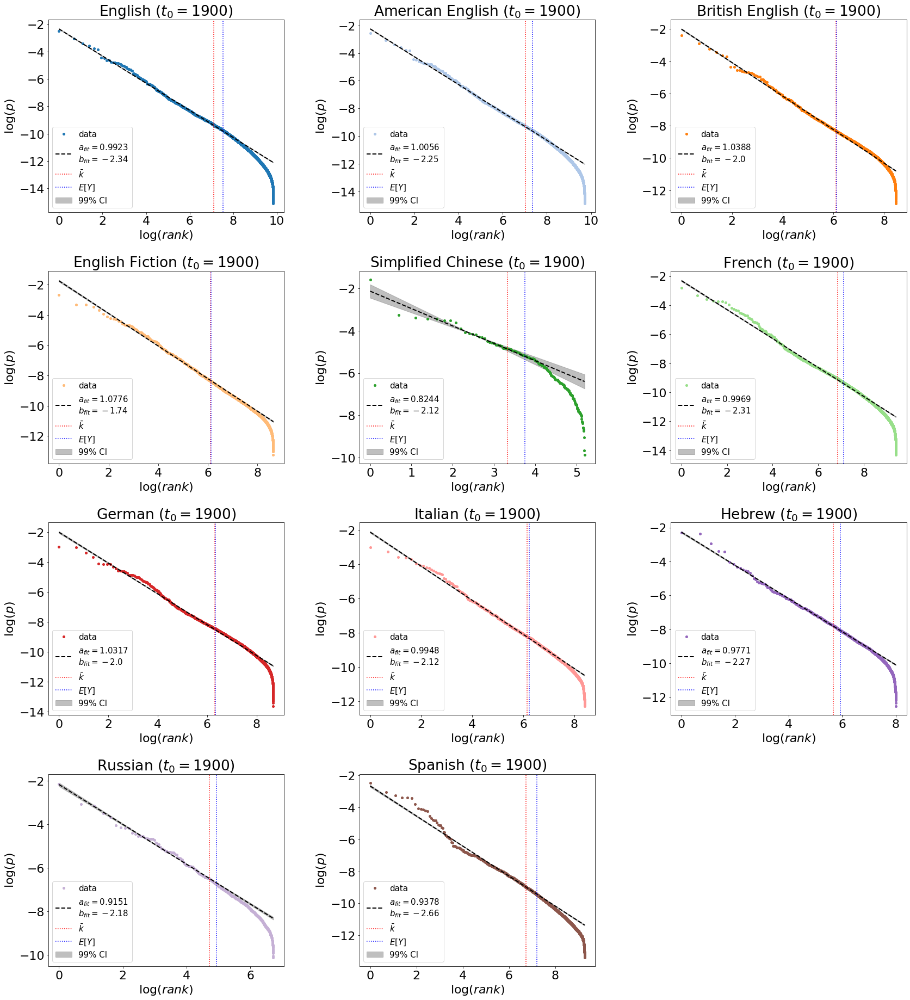

In [157]:
# FIGURE: visualization of the fitted function into the actual data
fig, ax = plt.subplots(4,3,figsize=(24,26))
for l in l_codes:
    t = 1900
    p_vect = LA[l]['pscore'][t]
    empirical_ranks = lc.return_ranks(p_vect)
    er = np.array(list(empirical_ranks.values()),dtype=float)
    er_keys = list(empirical_ranks.keys())
    p_vect_sorted = np.array(list(p_vect.loc[er_keys].values),dtype=float)
    
    a_fit = LA_zipfParameter_fits['a (fit)'][l]
    a_ci = np.fromstring(LA_zipfParameter_fits['a (99% CI)'][l].replace('(','').replace(')',''),sep=',')
    b_fit = LA_zipfParameter_fits['b (fit)'][l]
    b_ci = np.fromstring(LA_zipfParameter_fits['b (99% CI)'][l].replace('(','').replace(')',''),sep=',')
    
    ax[l_plot_grids[l]].plot(np.log(er),np.log(p_vect_sorted),'.',
                             markersize=8,color=l_colors[l],label='data')
    ax[l_plot_grids[l]].plot(np.log(er),zipf_loglog(np.log(er),a_fit,b_fit),
                             linewidth=2,linestyle='--',color='black',
                             label=r'$a_{fit}='+str(a_fit)+'$ \n'+r'$b_{fit}='+str(round(b_fit,2))+'$')
    ax[l_plot_grids[l]].fill_between(np.log(er),zipf_loglog(np.log(er),a_ci[0],b_ci[0]),zipf_loglog(np.log(er),a_ci[1],b_ci[1]),
                         color='gray',alpha=0.50,label='99% CI')
    ax[l_plot_grids[l]].axvline(np.log(LA_zipfParameter_fits['E (data)'][l]),label=r'$\bar{k}$',linestyle=':',color='red')
    ax[l_plot_grids[l]].axvline(np.log(LA_zipfParameter_fits['E (theory)'][l]),label=r'$E[Y]$',linestyle=':',color='blue')
    ax[l_plot_grids[l]].set_xlabel(r'$\log{(rank)}$')
    ax[l_plot_grids[l]].set_ylabel(r'$\log{(p)}$')
    ax[l_plot_grids[l]].set_title(l_labels[l]+r' $(t_0='+str(t)+')$')
    ax[l_plot_grids[l]].legend(loc=3,fontsize=15)
ax[3,2].axis('off')
plt.tight_layout()
plt.savefig('figures/MAIN-1/initial-zipf_data-curve-fit_4x3.png')
plt.show()

### 2.4. Stopwords and Swadesh Words.

In [158]:
SW_LA = {}
SD_LA = {}
LA_SWSD_summary = {'stopwords':{},'swadesh words':{}}
for l in l_codes:
    if l in ['eng','eng-us','eng-gb','eng-fiction']:
        ll = 'eng'
    else:
        ll = l
    R_temp = LA_RANKS[l]['ranks']    
        
    # stop-words
    with open('1gram-list/stopwords/'+l_short_codes[ll],encoding='utf8') as file:
        stopword_list = set(file.read().split('\n'))
    print(l,'stopwords before',len(stopword_list))
    R_subset = R_temp.loc[stopword_list.intersection(R_temp.index)]
    SW_LA[l] = R_subset.index
    LA_SWSD_summary['stopwords'][l] = len(SW_LA[l])
    print(l,'stopwords after',len(SW_LA[l]))
    print()
    # swadesh words
    with open('1gram-list/swadesh/'+l_short_codes[ll],encoding='utf8') as file:
        swadesh_list = set(file.read().split('\n'))
    print(l,'swadesh words before',len(swadesh_list))
    R_subset = R_temp.loc[swadesh_list.intersection(R_temp.index)]
    SD_LA[l] = R_subset.index
    LA_SWSD_summary['swadesh words'][l] = len(SD_LA[l])
    print(l,'swadesh words after',len(SD_LA[l]))
    print()
    
LA_SWSD_summary = pd.DataFrame(LA_SWSD_summary)

eng stopwords before 665
eng stopwords after 571

eng swadesh words before 207
eng swadesh words after 202

eng-us stopwords before 665
eng-us stopwords after 568

eng-us swadesh words before 207
eng-us swadesh words after 202

eng-gb stopwords before 665
eng-gb stopwords after 492

eng-gb swadesh words before 207
eng-gb swadesh words after 171

eng-fiction stopwords before 665
eng-fiction stopwords after 478

eng-fiction swadesh words before 207
eng-fiction swadesh words after 193

chi-sim stopwords before 119
chi-sim stopwords after 49

chi-sim swadesh words before 286
chi-sim swadesh words after 30

fre stopwords before 116
fre stopwords after 116

fre swadesh words before 219
fre swadesh words after 193

ger stopwords before 129
ger stopwords after 113

ger swadesh words before 216
ger swadesh words after 142

ita stopwords before 134
ita stopwords after 123

ita swadesh words before 216
ita swadesh words after 121

heb stopwords before 499
heb stopwords after 313

heb swadesh word

In [159]:
pd.options.display.max_columns = 10
display(LA_SWSD_summary)

,stopwords,swadesh words
eng,571,202
eng-us,568,202
eng-gb,492,171
eng-fiction,478,193
chi-sim,49,30
fre,116,193
ger,113,142
ita,123,121
heb,313,144
rus,238,53


In [160]:
for l in l_codes:
    try: print('Stopwords examples',l_labels[l],np.random.choice(SW_LA[l],5))
    except: pass
print()
for l in l_codes:
    try: print('Swadesh words examples',l_labels[l],np.random.choice(SD_LA[l],5))
    except: pass

Stopwords examples English ['fix' 'others' 'possibly' 'both' 'who']
Stopwords examples American English ['information' 'relatively' 'got' 'sorry' 'following']
Stopwords examples British English ['even' 'one' 'something' 'information' 'previously']
Stopwords examples English Fiction ['useful' 'having' 'known' 'arise' 'beyond']
Stopwords examples Simplified Chinese ['此' '如' '有' '为' '可']
Stopwords examples French ['devrait' 'avoir' 'donc' 'parce' 'mien']
Stopwords examples German ['dessen' 'doch' 'soweit' 'sind' 'nachdem']
Stopwords examples Italian ['da' 'quattro' 'su' 'sembra' 'nuovo']
Stopwords examples Hebrew ['אחרים' 'אביב' 'טובה' 'נושא' 'של']
Stopwords examples Russian ['со' 'менее' 'довольно' 'просто' 'ведь']
Stopwords examples Spanish ['estaba' 'fui' 'muy' 'verdad' 'usa']

Swadesh words examples English ['think' 'scratch' 'knee' 'i' 'moon']
Swadesh words examples American English ['sand' 'animal' 'we' 'woman' 'earth']
Swadesh words examples British English ['sleep' 'dull' 'white' 

### 2.5. Sum of Rank Change.

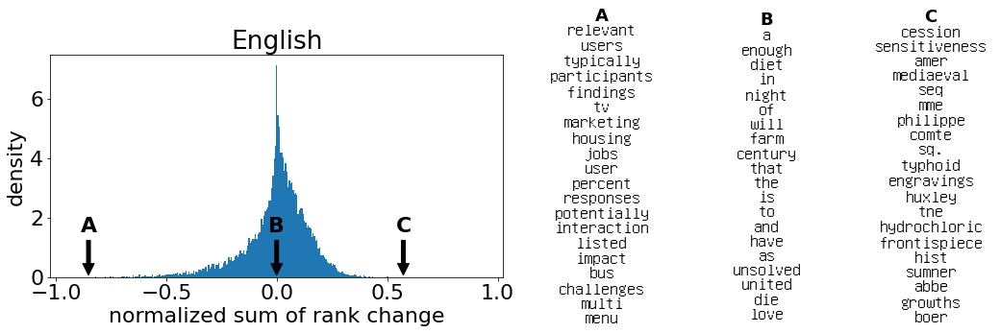

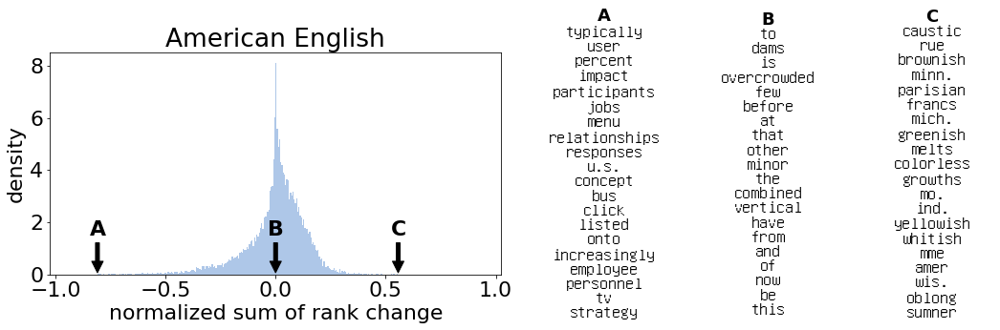

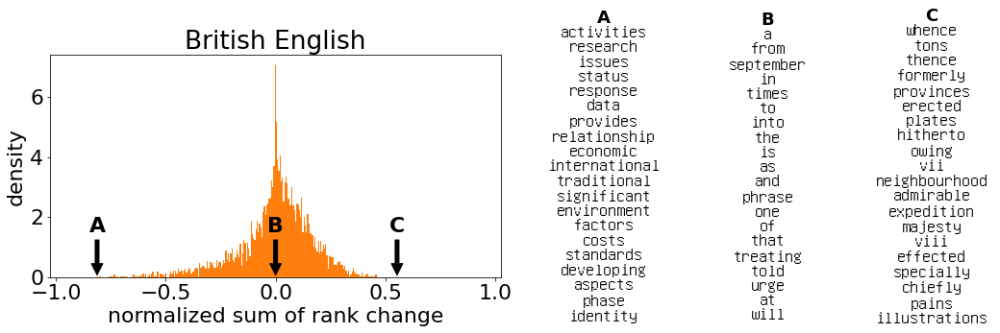

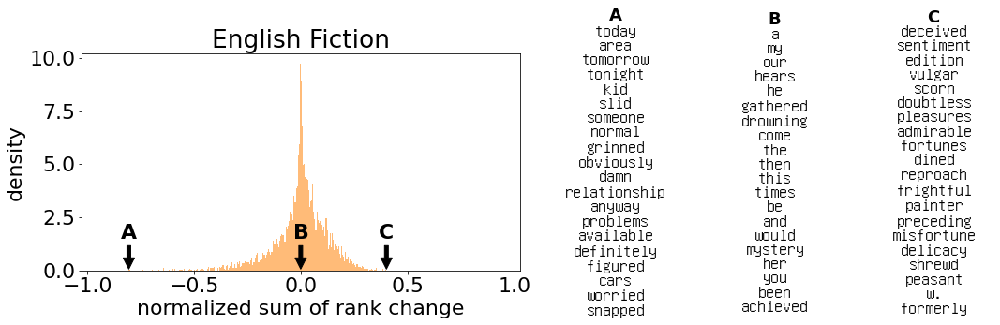

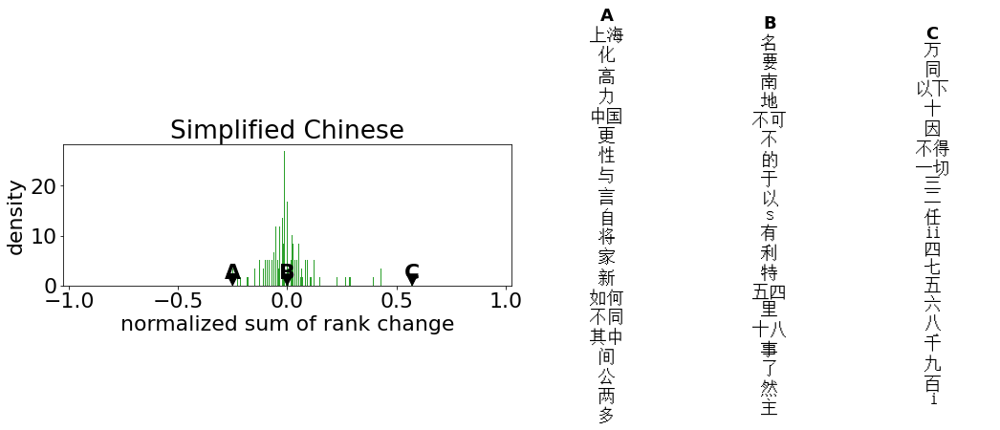

...

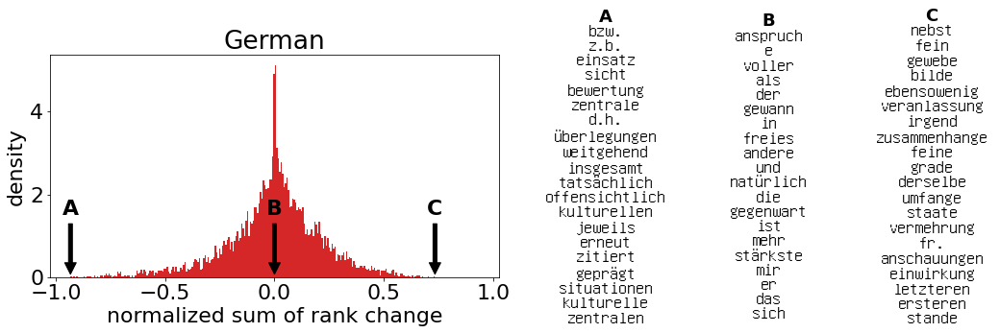

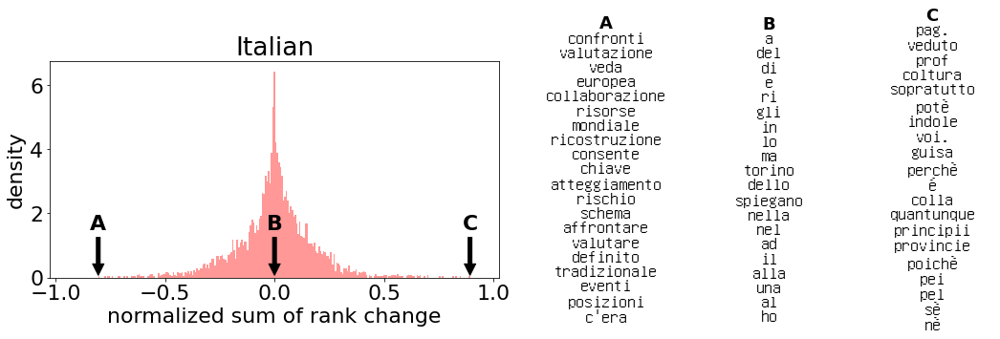

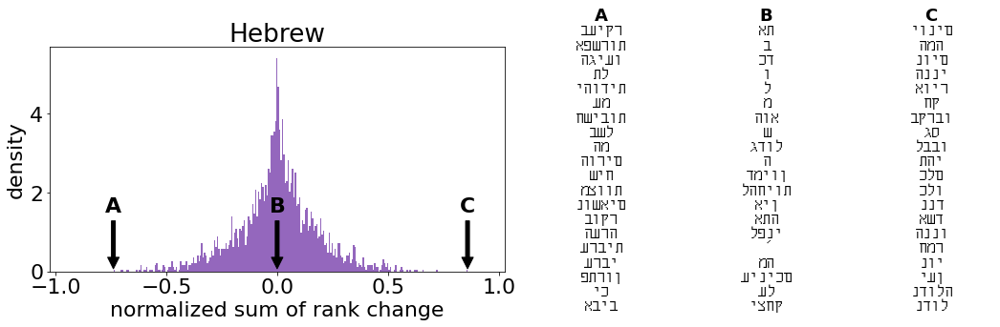

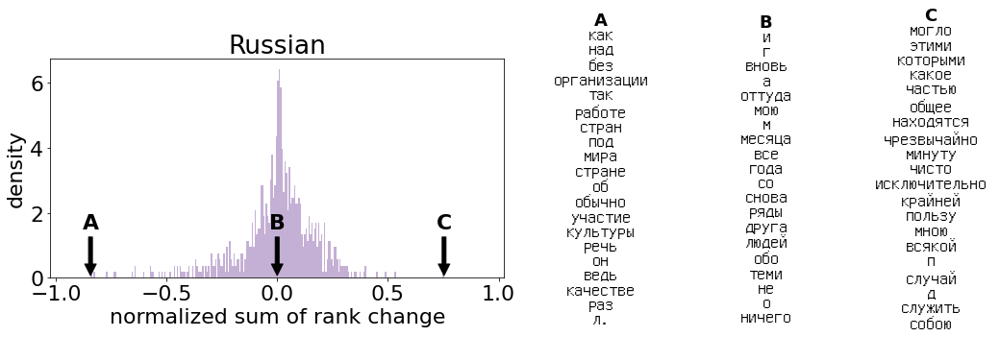

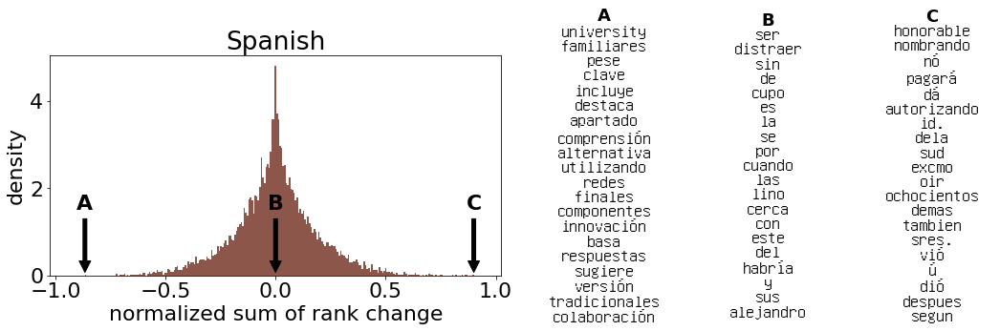

In [161]:
top_n = 20
middle_n = 20
bottom_n = 20
for l in l_codes:
    fig, ax = plt.subplots(1,2,figsize=(15,5))
    ds_all = LA_RANKS[l]['drank-sum']
    al_vals = {}
    for i in ds_all.keys(): 
        al_vals[i] = ds_all[i]/len(ds_all)
    al_vals = pd.DataFrame({'drank-sum':al_vals})
    sorted_al_vals = np.array(al_vals.sort_values(by='drank-sum').index)
    sorted_al_vals_abs = np.array(abs(al_vals).sort_values(by='drank-sum').index)
    min_val = np.min(al_vals).values
    max_val = np.max(al_vals).values
    
    text_bottom = r'$\mathbf{A}$'+' \n'+'\n'.join(sorted_al_vals[:bottom_n])
    text_middle = r'$\mathbf{B}$'+' \n'+'\n'.join(sorted_al_vals_abs[:middle_n])
    text_top = r'$\mathbf{C}$'+' \n'+'\n'.join(sorted_al_vals[-top_n:])
        
    ax[0].hist(al_vals.values,bins=250,density=True,color=l_colors[l])
    ax[0].annotate('A', xy=(min_val, 0), xytext=(min_val, 1.5),ha='center',
                   arrowprops=dict(facecolor='black', shrink=0.05),fontweight='bold')
    ax[0].annotate('B', xy=(0, 0), xytext=(0, 1.5),ha='center',
                   arrowprops=dict(facecolor='black', shrink=0.05),fontweight='bold')
    ax[0].annotate('C', xy=(max_val, 0), xytext=(max_val, 1.5),ha='center',
                   arrowprops=dict(facecolor='black', shrink=0.05),fontweight='bold')
    ax[0].set_xlim(-1-0.025,1+0.025)
    ax[0].set_xlabel('normalized sum of rank change')
    ax[0].set_ylabel('density')
    ax[0].set_title(l_labels[l])
    ax[1].plot()
    ax[1].text(-0.04, 0, text_bottom, ha='center',va='center', wrap=True,fontproperties=fontP)
    ax[1].text(0, 0, text_middle, ha='center',va='center', wrap=True,fontproperties=fontP)
    ax[1].text(0.04, 0, text_top, ha='center',va='center', wrap=True,fontproperties=fontP)
    ax[1].axis('off')
    
    plt.tight_layout()
    plt.savefig('figures/MAIN-1/rc-sum-distribution_list-of-words_'+l+'_1x2.png', bbox_inches="tight")
    plt.show()

In [162]:
def length(beta,c,pw,pv,z=4):
    N = beta-c
    mu_w = N*pw
    sigma_w = N*pw*(1-pw)
    mu_v = N*pv
    sigma_v = N*pv*(1-pv)
    return min(mu_w+z*np.sqrt(sigma_w),mu_v+z*np.sqrt(sigma_v)) - max(mu_w-z*np.sqrt(sigma_w),mu_v-z*np.sqrt(sigma_v))

def ol(w,beta,c,p_vect):
    ol_sum = 0
    for i, v in enumerate(p_vect):
        if (w-1) != i:
            if length(beta,c,p_vect[w-1],p_vect[i]) > 0:
                if w-1 < i:
                    ol_sum += 1
                elif w-1 > i:
                    ol_sum -= 1
    return ol_sum

# compute overlap vector
pmf_zipf, cdf_zipf = wf20.zipf(range(1,c+1),a)
ol_vect_wf = []
for w in tqdm(range(1,c+1)):
    ol_vect_wf.append(ol(w,beta,c,pmf_zipf)/c)

100%|██████████| 1000/1000 [00:11<00:00, 87.83it/s]


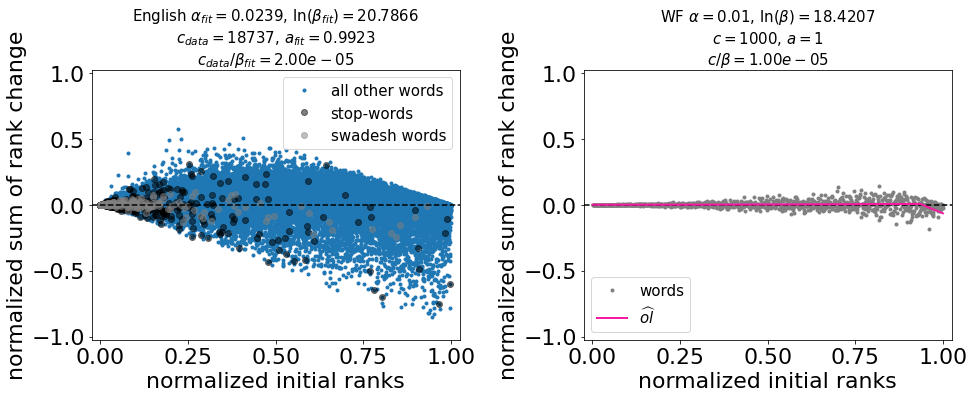

In [163]:
# figure
fig, ax = plt.subplots(1,2,figsize=(7*2,6))
l = 'eng'
t = 1900
dayta = LA_RANKS[l]

alpha_fit = LA_corpusSize_fits['alpha (fit)'][l]
beta_fit = LA_corpusSize_fits['ln(beta) (fit)'][l]
N_data = np.sum(LA[l]['rscore']).values
c_data = dayta['ranks'].shape[0]
a_fit = LA_zipfParameter_fits['a (fit)'][l]
b_fit = LA_zipfParameter_fits['b (fit)'][l]

initial_ranks = dayta['ranks'][t].sort_index()
initial_ranks_normed = initial_ranks.values / len(initial_ranks.values)
initial_ranks_sw = initial_ranks[SW_LA[l]]
initial_ranks_sw_normed = initial_ranks_sw.values / len(initial_ranks.values)
initial_ranks_sd = initial_ranks[SD_LA[l]]
initial_ranks_sd_normed = initial_ranks_sd.values / len(initial_ranks.values)
drank_sum = dayta['drank-sum'].sort_index()
drank_sum_normed = np.array(drank_sum.values) / len(np.array(drank_sum.values))
drank_sum_sw = drank_sum[SW_LA[l]]
drank_sum_sw_normed = np.array(drank_sum_sw.values) / len(np.array(drank_sum.values))
drank_sum_sd = drank_sum[SD_LA[l]]
drank_sum_sd_normed = np.array(drank_sum_sd.values) / len(np.array(drank_sum.values))

ax[0].plot(initial_ranks_normed,drank_sum_normed,'.',color=l_colors[l],label='all other words')
ax[0].plot(initial_ranks_sw_normed,drank_sum_sw_normed,'.',color='black',label='stop-words',markersize=12,alpha=0.50)
ax[0].plot(initial_ranks_sd_normed,drank_sum_sd_normed,'.',color='gray',label='swadesh words',markersize=12,alpha=0.50)
ax[0].axhline(0,linestyle='--',color='black')
ax[0].set_xlim(0-0.025,1+0.025)
ax[0].set_ylim(-1-0.025,1+0.025)
ax[0].set_xlabel('normalized initial ranks')
ax[0].set_ylabel('normalized sum of rank change')
ax[0].set_title(l_labels[l]+r' $\alpha_{fit}='+str(alpha_fit)+r'$'+r', $\ln{(\beta_{fit})}='+str(beta_fit)+r'$'+'\n'+r'$c_{data}=$'+str(c_data)+r', $a_{fit}=$'+str(a_fit)+'\n'+r'$c_{data}/\beta_{fit}='+str("{:.2e}".format(round(c_data/np.exp(beta_fit),5)))+r'$',fontsize=15)
ax[0].legend(loc=1,fontsize=15)

t = 0
dayta = RK
initial_ranks = dayta['ranks'][t].sort_index()
initial_ranks_normed = initial_ranks.values / len(initial_ranks.values)
drank_sum = dayta['drank-sum'].sort_index()
drank_sum_normed = np.array(drank_sum.values) / len(np.array(drank_sum.values))

ax[1].plot(initial_ranks_normed,drank_sum_normed,'.',color='gray',label='words')
ax[1].axhline(0,linestyle='--',color='black')
ax[1].plot(np.linspace(0,1,len(ol_vect_wf)),ol_vect_wf,'-',linewidth=2,color='#F81AA1',label=r'$\widehat{ol}$')
ax[1].set_xlim(0-0.025,1+0.025)
ax[1].set_ylim(-1-0.025,1+0.025)
ax[1].set_xlabel('normalized initial ranks')
ax[1].set_ylabel('normalized sum of rank change')
ax[1].set_title(r'WF $\alpha=$'+str(alpha)+r', $\ln{(\beta)}=$'+str(round(np.log(beta),4))+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+'\n'+r'$c/\beta='+str("{:.2e}".format(round(c/beta,5)))+r'$',fontsize=15)
ax[1].legend(loc=3,fontsize=15)

plt.tight_layout()
plt.savefig('figures/MAIN-1/rc-sum_vs_initial-ranks_'+l+'.png')
plt.show()

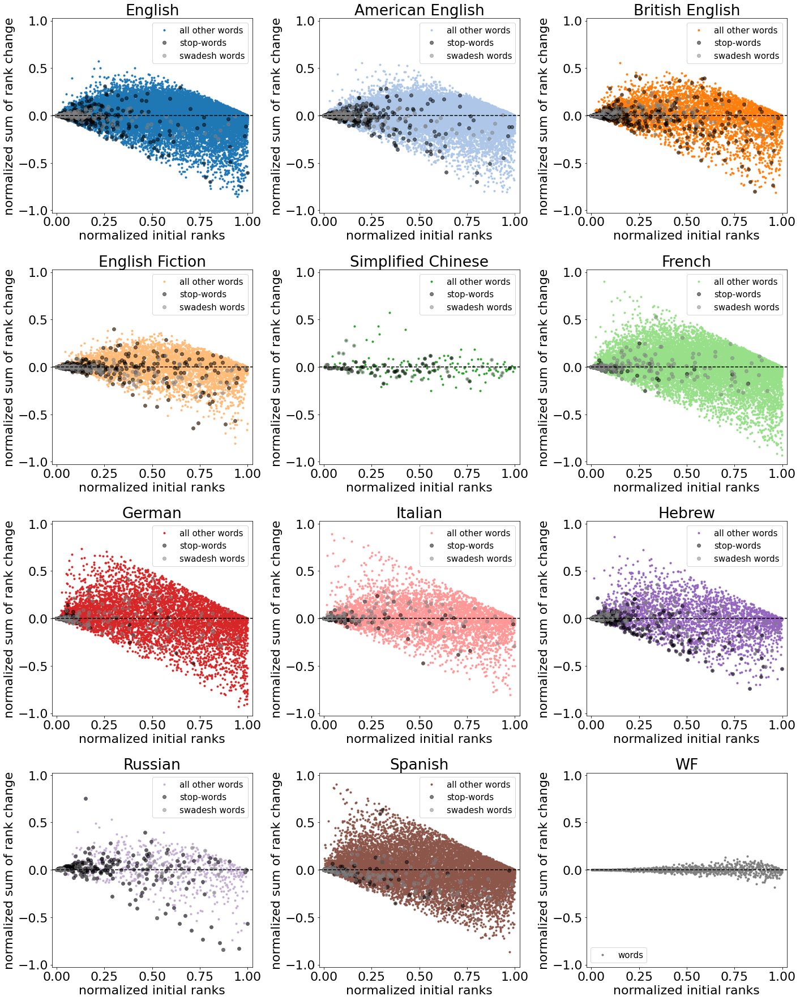

In [164]:
t = 1900

fig, ax = plt.subplots(4,3,figsize=(20,25))
for l in l_codes:
    dayta = LA_RANKS[l]

    initial_ranks = dayta['ranks'][t].sort_index()
    initial_ranks_normed = initial_ranks.values / len(initial_ranks.values)
    initial_ranks_sw = initial_ranks[SW_LA[l]]
    initial_ranks_sw_normed = initial_ranks_sw.values / len(initial_ranks.values)
    initial_ranks_sd = initial_ranks[SD_LA[l]]
    initial_ranks_sd_normed = initial_ranks_sd.values / len(initial_ranks.values)
    drank_sum = dayta['drank-sum'].sort_index()
    drank_sum_normed = np.array(drank_sum.values) / len(np.array(drank_sum.values))
    drank_sum_sw = drank_sum[SW_LA[l]]
    drank_sum_sw_normed = np.array(drank_sum_sw.values) / len(np.array(drank_sum.values))
    drank_sum_sd = drank_sum[SD_LA[l]]
    drank_sum_sd_normed = np.array(drank_sum_sd.values) / len(np.array(drank_sum.values))
    
    # compute overlap vector
    #pmf_zipf, cdf_zipf = wf20.zipf(range(1,c_data+1),a_fit)
    #ol_vect_la = []
    #for w in tqdm(range(1,c_data+1)):
    #    ol_vect_la.append(ol(w,int(np.exp(beta_fit)),c_data,pmf_zipf)/c_data)

    ax[l_plot_grids[l]].plot(initial_ranks_normed,drank_sum_normed,'.',color=l_colors[l],label='all other words')
    ax[l_plot_grids[l]].plot(initial_ranks_sw_normed,drank_sum_sw_normed,'.',color='black',label='stop-words',markersize=12,alpha=0.50)
    ax[l_plot_grids[l]].plot(initial_ranks_sd_normed,drank_sum_sd_normed,'.',color='gray',label='swadesh words',markersize=12,alpha=0.50)
    ax[l_plot_grids[l]].axhline(0,linestyle='--',color='black')
    ax[l_plot_grids[l]].set_xlim(0-0.025,1+0.025)
    ax[l_plot_grids[l]].set_ylim(-1-0.025,1+0.025)
    ax[l_plot_grids[l]].set_xlabel('normalized initial ranks')
    ax[l_plot_grids[l]].set_ylabel('normalized sum of rank change')
    ax[l_plot_grids[l]].set_title(l_labels[l])
    ax[l_plot_grids[l]].legend(loc=1,fontsize=15)

t = 0
dayta = RK
initial_ranks = dayta['ranks'][t].sort_index()
initial_ranks_normed = initial_ranks.values / len(initial_ranks.values)
drank_sum = dayta['drank-sum'].sort_index()
drank_sum_normed = np.array(drank_sum.values) / len(np.array(drank_sum.values))

ax[3,2].plot(initial_ranks_normed,drank_sum_normed,'.',color='gray',label='words')
ax[3,2].axhline(0,linestyle='--',color='black')
ax[3,2].set_xlim(0-0.025,1+0.025)
ax[3,2].set_ylim(-1-0.025,1+0.025)
ax[3,2].set_xlabel('normalized initial ranks')
ax[3,2].set_ylabel('normalized sum of rank change')
ax[3,2].set_title(r'WF')
ax[3,2].legend(loc=3,fontsize=15)

plt.tight_layout()
plt.savefig('figures/MAIN-1/rc-sum_vs_initial-ranks_la_4x3.png')
plt.show()

### 2.6. Rank Change Variance.

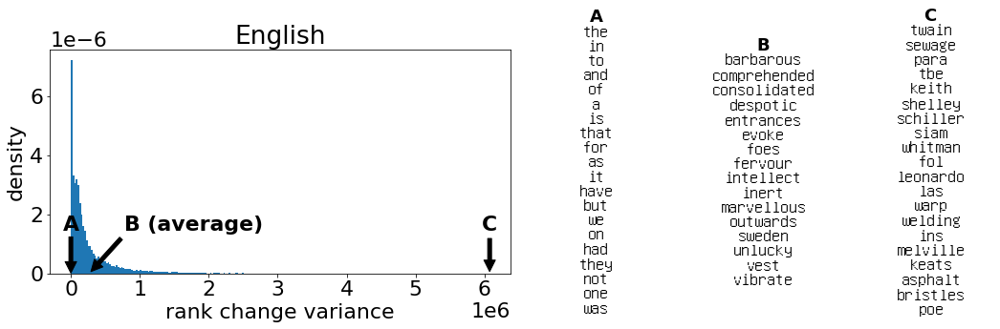

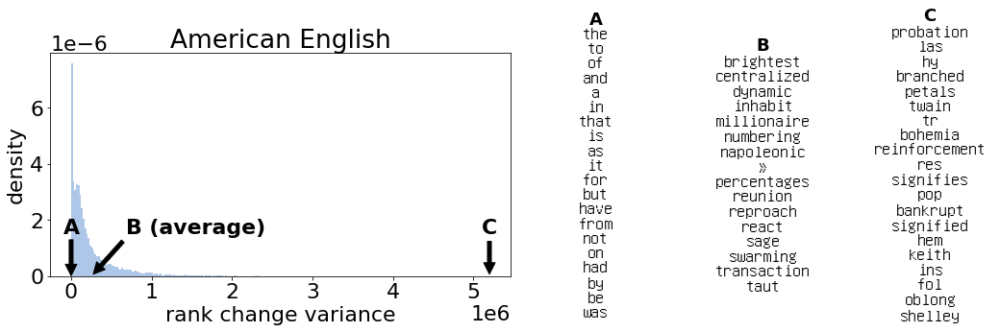

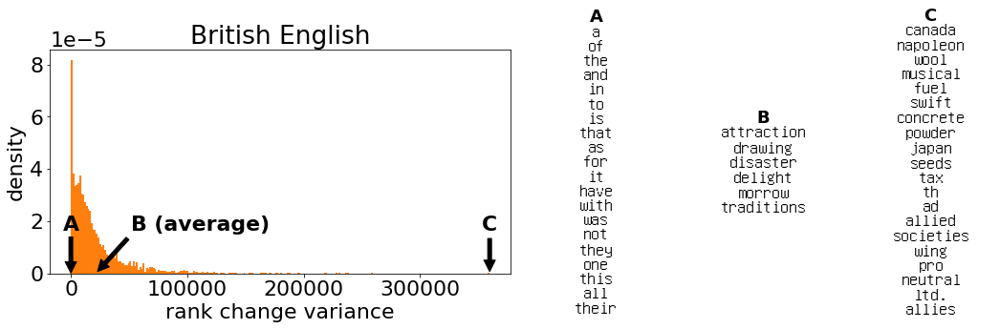

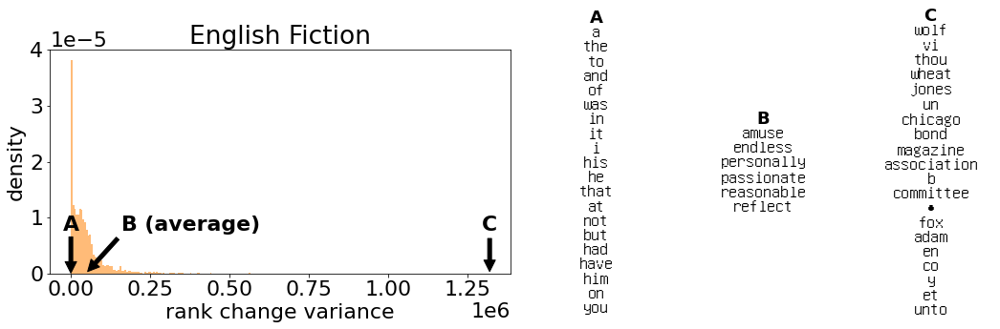

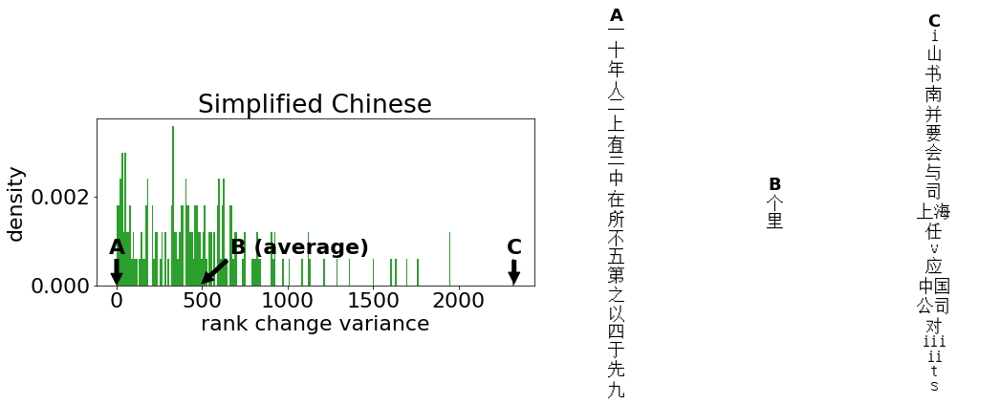

...

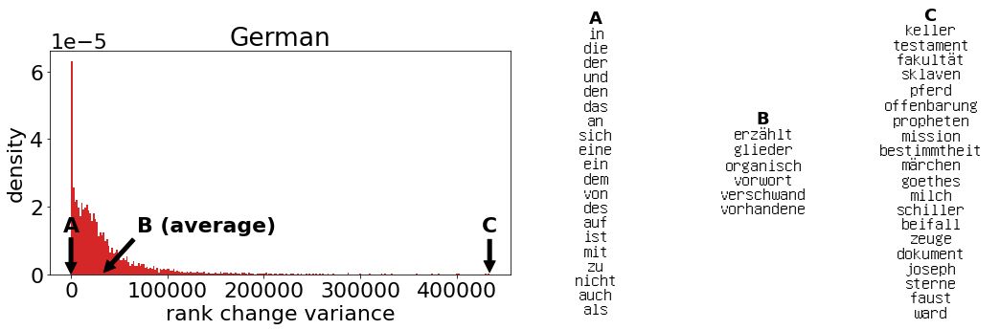

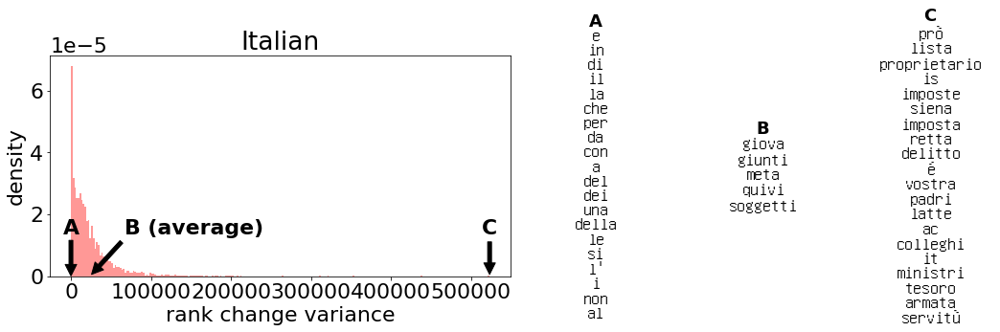

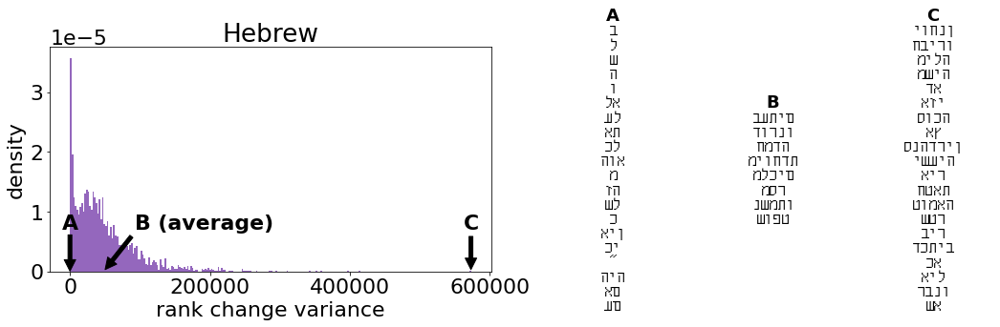

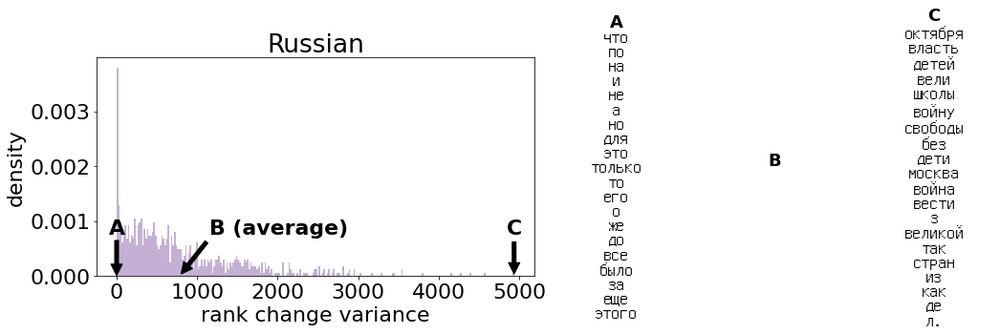

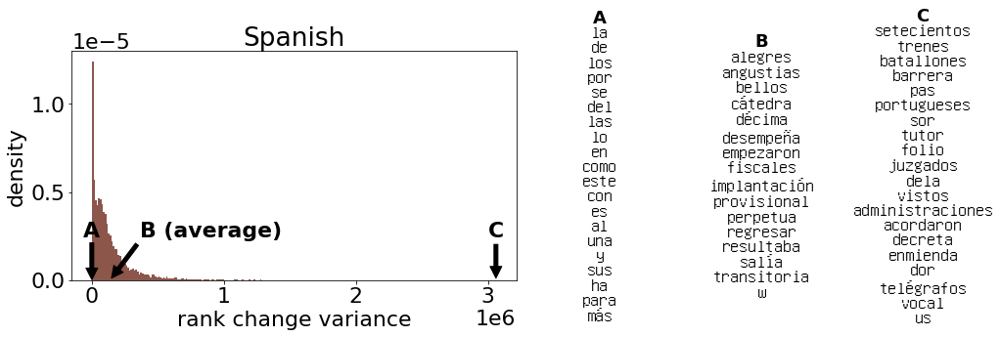

In [165]:
top_n = 20
percent_range = 0.0016
bottom_n = 20
for l in l_codes:
    fig, ax = plt.subplots(1,2,figsize=(15,5))
    al_vals = LA_RANKS[l]['drank-variance']
    #al_vals = al_vals/np.max(abs(al_vals))
    sorted_al_vals = np.array(al_vals.sort_values().index)
    min_val = np.min(al_vals)
    mean_val = np.mean(al_vals)
    max_val = np.max(al_vals)
    
    range_logic = np.logical_and(al_vals>=mean_val-mean_val*percent_range, al_vals<=mean_val+mean_val*percent_range)
    mean_range_al_vals = np.array(al_vals[range_logic == True].index)
    
    text_bottom = r'$\mathbf{A}$'+' \n'+'\n'.join(sorted_al_vals[:bottom_n])
    text_mean = r'$\mathbf{B}$'+' \n'+'\n'.join(mean_range_al_vals)
    text_top = r'$\mathbf{C}$'+' \n'+'\n'.join(sorted_al_vals[-top_n:])
        
    s = ax[0].hist(al_vals.values,bins=250,density=True,color=l_colors[l])
    max_s = np.max(s[0])
    ax[0].annotate('A', xy=(min_val, 0), xytext=(min_val, 0.20*max_s),ha='center',
                  arrowprops=dict(facecolor='black', shrink=0.01),fontweight='bold')
    ax[0].annotate('B (average)', xy=(mean_val, 0), xytext=(mean_val+0.25*max_val, 0.20*max_s),ha='center',
                  arrowprops=dict(facecolor='black', shrink=0.05),fontweight='bold')
    ax[0].annotate('C', xy=(max_val, 0), xytext=(max_val, 0.20*max_s),ha='center',
                  arrowprops=dict(facecolor='black', shrink=0.05),fontweight='bold')
    ax[0].set_xlabel('rank change variance')
    ax[0].set_ylabel('density')
    ax[0].set_title(l_labels[l])
    ax[1].plot()
    ax[1].text(-0.04, 0, text_bottom, ha='center',va='center', wrap=True,fontproperties=fontP)
    ax[1].text(0, 0, text_mean, ha='center',va='center', wrap=True,fontproperties=fontP)
    ax[1].text(0.04, 0, text_top, ha='center',va='center', wrap=True,fontproperties=fontP)
    ax[1].axis('off')
    
    plt.tight_layout()
    plt.savefig('figures/MAIN-1/rc-variance-distribution_list-of-words_'+l+'_1x2.png', bbox_inches="tight")
    plt.show()

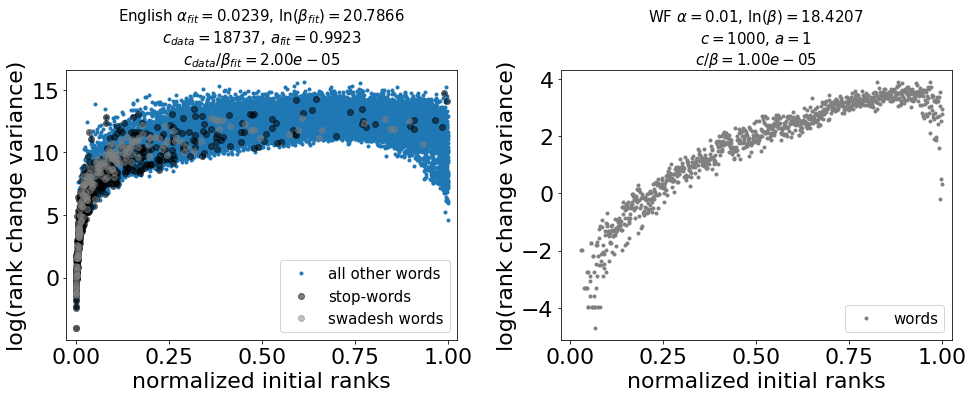

In [166]:
fig, ax = plt.subplots(1,2,figsize=(7*2,6),sharey=False)
l = 'eng'
t = 1900
dayta = LA_RANKS[l]

initial_ranks = dayta['ranks'][t].sort_index()
vocab_size = len(initial_ranks.values)
initial_ranks_normed = initial_ranks.values / vocab_size
initial_ranks_sw = initial_ranks[SW_LA[l]]
initial_ranks_sw_normed = initial_ranks_sw.values / vocab_size
initial_ranks_sd = initial_ranks[SD_LA[l]]
initial_ranks_sd_normed = initial_ranks_sd.values / vocab_size
drank_var = np.log(pd.DataFrame({'drank-variance':dayta['drank-variance']}).sort_index())
max_norm = np.max(abs(drank_var)).values[0]
drank_var_normed = drank_var # / max_norm
drank_var_sw = drank_var['drank-variance'][SW_LA[l]]
drank_var_sw_normed = drank_var_sw # / max_norm
drank_var_sd = drank_var['drank-variance'][SD_LA[l]]
drank_var_sd_normed = drank_var_sd # / max_norm

ax[0].plot(initial_ranks_normed,drank_var_normed,'.',color=l_colors[l],label='all other words')
ax[0].plot(initial_ranks_sw_normed,drank_var_sw_normed,'.',color='black',label='stop-words',markersize=12,alpha=0.50)
ax[0].plot(initial_ranks_sd_normed,drank_var_sd_normed,'.',color='gray',label='swadesh words',markersize=12,alpha=0.50)
ax[0].set_xlim(0-0.025,1+0.025)
#ax[0].set_ylim(0-0.025,1+0.025)
ax[0].set_xlabel('normalized initial ranks')
ax[0].set_ylabel('log(rank change variance)')
ax[0].set_title(l_labels[l]+r' $\alpha_{fit}='+str(alpha_fit)+r'$'+r', $\ln{(\beta_{fit})}='+str(beta_fit)+r'$'+'\n'+r'$c_{data}=$'+str(c_data)+r', $a_{fit}=$'+str(a_fit)+'\n'+r'$c_{data}/\beta_{fit}='+str("{:.2e}".format(round(c_data/np.exp(beta_fit),5)))+r'$',fontsize=15)
ax[0].legend(loc=4,fontsize=15)

t = 0
dayta = RK
initial_ranks = dayta['ranks'][t].sort_index()
vocab_size = len(initial_ranks.values)
initial_ranks_normed = initial_ranks.values / vocab_size
drank_var = np.log(pd.DataFrame({'drank-variance':dayta['drank-variance']}).sort_index())
max_norm = np.max(abs(drank_var)).values[0]
drank_var_normed = drank_var # / max_norm

ax[1].plot(initial_ranks_normed,drank_var_normed,'.',color='gray',label='words')
ax[1].set_xlim(0-0.025,1+0.025)
#ax[1].set_ylim(0-0.025,1+0.025)
ax[1].set_xlabel('normalized initial ranks')
ax[1].set_ylabel('log(rank change variance)')
ax[1].set_title(r'WF $\alpha=$'+str(alpha)+r', $\ln{(\beta)}=$'+str(round(np.log(beta),4))+'\n'+r'$c=$'+str(c)+r', $a=$'+str(a)+'\n'+r'$c/\beta='+str("{:.2e}".format(round(c/beta,5)))+r'$',fontsize=15)
ax[1].legend(loc=4,fontsize=15)

plt.tight_layout()
plt.savefig('figures/MAIN-1/rc-variance_vs_initial-ranks_'+l+'.png')
plt.show()

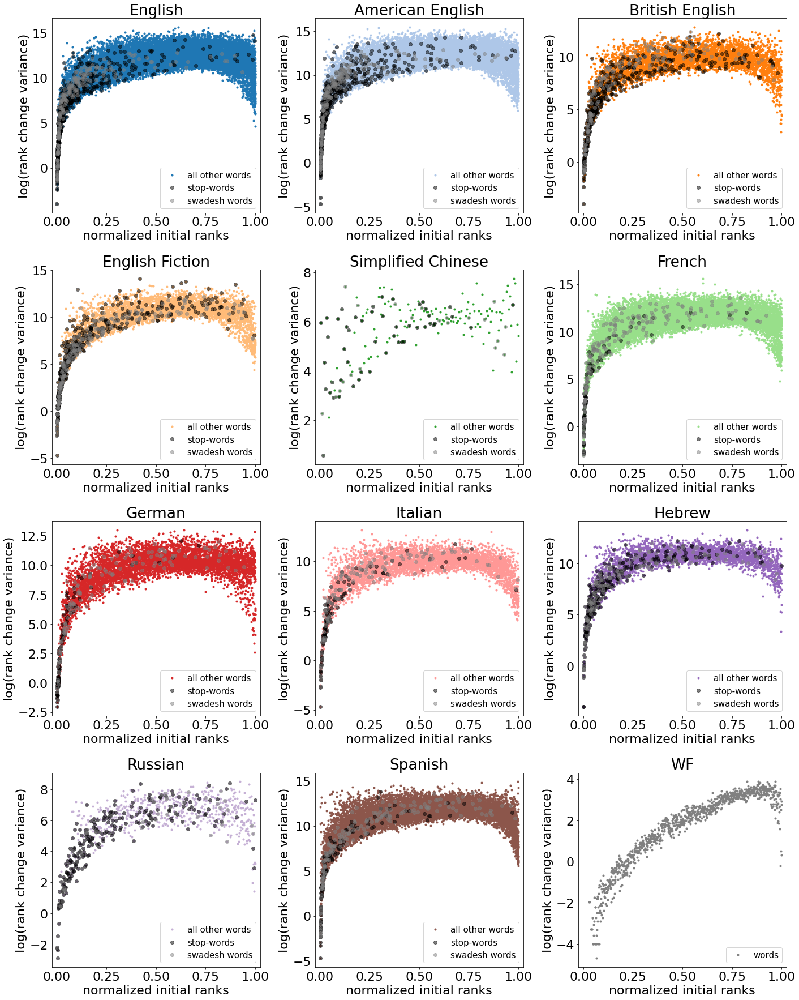

In [167]:
l = 'eng'
t = 1900

fig, ax = plt.subplots(4,3,figsize=(20,25),sharey=False)
for l in l_codes:
    dayta = LA_RANKS[l]

    initial_ranks = dayta['ranks'][t].sort_index()
    vocab_size = len(initial_ranks.values)
    initial_ranks_normed = initial_ranks.values / vocab_size
    initial_ranks_sw = initial_ranks[SW_LA[l]]
    initial_ranks_sw_normed = initial_ranks_sw.values / vocab_size
    initial_ranks_sd = initial_ranks[SD_LA[l]]
    initial_ranks_sd_normed = initial_ranks_sd.values / vocab_size
    drank_var = np.log(pd.DataFrame({'drank-variance':dayta['drank-variance']}).sort_index())
    max_norm = np.max(abs(drank_var)).values[0]
    drank_var_normed = drank_var # / max_norm
    drank_var_sw = drank_var['drank-variance'][SW_LA[l]]
    drank_var_sw_normed = drank_var_sw # / max_norm
    drank_var_sd = drank_var['drank-variance'][SD_LA[l]]
    drank_var_sd_normed = drank_var_sd # / max_norm

    ax[l_plot_grids[l]].plot(initial_ranks_normed,drank_var_normed,'.',color=l_colors[l],label='all other words')
    ax[l_plot_grids[l]].plot(initial_ranks_sw_normed,drank_var_sw_normed,'.',color='black',label='stop-words',markersize=12,alpha=0.50)
    ax[l_plot_grids[l]].plot(initial_ranks_sd_normed,drank_var_sd_normed,'.',color='gray',label='swadesh words',markersize=12,alpha=0.50)
    ax[l_plot_grids[l]].set_xlim(0-0.025,1+0.025)
    #ax[l_plot_grids[l]].set_ylim(0-0.025,1+0.025)
    ax[l_plot_grids[l]].set_xlabel('normalized initial ranks')
    ax[l_plot_grids[l]].set_ylabel('log(rank change variance)')
    ax[l_plot_grids[l]].set_title(l_labels[l])
    ax[l_plot_grids[l]].legend(loc=4,fontsize=15)

t = 0
dayta = RK
initial_ranks = dayta['ranks'][t].sort_index()
vocab_size = len(initial_ranks.values)
initial_ranks_normed = initial_ranks.values / vocab_size
drank_var = np.log(pd.DataFrame({'drank-variance':dayta['drank-variance']}).sort_index())
max_norm = np.max(abs(drank_var)).values[0]
drank_var_normed = drank_var # / max_norm

ax[3,2].plot(initial_ranks_normed,drank_var_normed,'.',color='gray',label='words')
ax[3,2].set_xlim(0-0.025,1+0.025)
#ax[3,2].set_ylim(0-0.025,1+0.025)
ax[3,2].set_xlabel('normalized initial ranks')
ax[3,2].set_ylabel('log(rank change variance)')
ax[3,2].set_title(r'WF')
ax[3,2].legend(loc=4,fontsize=15)

plt.tight_layout()
plt.savefig('figures/MAIN-1/rc-variance_vs_initial-ranks_la_4x3.png')
plt.show()

### 2.7. Rank Biased Overlap.

In [168]:
LA_RBO_ttp1 = {}
LA_RBO_ttp1_delta = {}
LA_RBO_ttp10 = {}
LA_RBO_ttp10_delta = {}
LA_RBO_initt = {}
LA_RBO_initt_delta = {}
for l in l_codes:
    LA_LIST = LA_RANKS[l]['olist']
    t_initial = LA_LIST.columns[0]
    
    # RBO t -- t+1
    ttp1 = []
    for i in list(LA_LIST.keys())[:-1]:
        ttp1.append(rbo.RankingSimilarity(LA_LIST[i+1].values,LA_LIST[i].values).rbo())
    LA_RBO_ttp1[l] = ttp1

    # delta RBO t -- t+1
    ttp1_delta = []
    for i in range(0,len(ttp1)-1):
        ttp1_delta.append(ttp1[i+1]-ttp1[i])
    LA_RBO_ttp1_delta[l] = ttp1_delta
    
    # RBO t -- t+10
    ttp10 = []
    for i in list(LA_LIST.keys())[:-10]:
        ttp10.append(rbo.RankingSimilarity(LA_LIST[i+10].values,LA_LIST[i].values).rbo())
    LA_RBO_ttp10[l] = ttp10

    # delta RBO t -- t+10
    ttp10_delta = []
    for i in range(0,len(ttp10)-10):
        ttp10_delta.append(ttp10[i+10]-ttp10[i])
    LA_RBO_ttp10_delta[l] = ttp10_delta
    
    # RBO 0 -- t
    initt = []
    for i in list(LA_LIST.keys()):
        initt.append(rbo.RankingSimilarity(LA_LIST[t_initial].values,LA_LIST[i].values).rbo())
    LA_RBO_initt[l] = initt
    
    # delta RBO 0 -- t
    initt_delta = []
    for i in range(0,len(initt)-1):
        initt_delta.append(initt[i+1]-initt[i])
    LA_RBO_initt_delta[l] = initt_delta
    
LA_RBO_ttp1 = pd.DataFrame(LA_RBO_ttp1).T
LA_RBO_ttp1_delta = pd.DataFrame(LA_RBO_ttp1_delta).T
LA_RBO_ttp10 = pd.DataFrame(LA_RBO_ttp10).T
LA_RBO_ttp10_delta = pd.DataFrame(LA_RBO_ttp10_delta).T
LA_RBO_initt = pd.DataFrame(LA_RBO_initt).T
LA_RBO_initt_delta = pd.DataFrame(LA_RBO_initt_delta).T

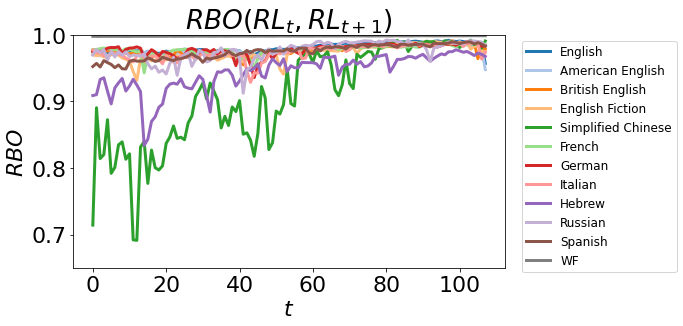

In [169]:
fig, ax = plt.subplots(1,1,figsize=(10,5))
for l in l_codes:
    ax.plot(LA_RBO_ttp1.loc[l,:],color=l_colors[l],label=l_labels[l],linewidth=3)
ax.plot(WF_RBO_ttp1,color='gray',label=r'WF',linewidth=3)
ax.set_xlabel(r'$t$')
ax.set_ylabel(r'$RBO$')
ax.set_ylim(0.65,1)
ax.set_title(r'$RBO(RL_{t},RL_{t+1})$')
ax.legend(fontsize=12, bbox_to_anchor=(1.025, 1), loc='upper left')
plt.tight_layout()
plt.savefig('figures/MAIN-1/rbo-ttp1_la.png')
plt.show()

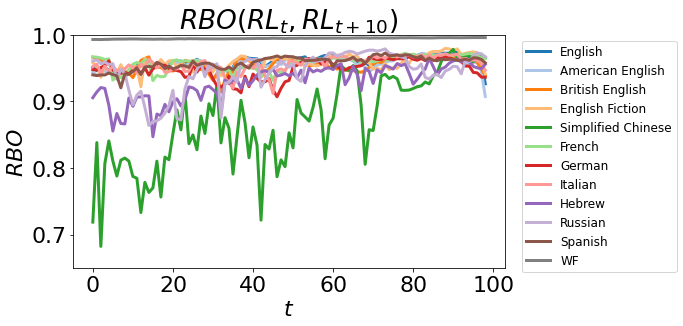

In [170]:
fig, ax = plt.subplots(1,1,figsize=(10,5))
for l in l_codes:
    ax.plot(LA_RBO_ttp10.loc[l,:],color=l_colors[l],label=l_labels[l],linewidth=3)
ax.plot(WF_RBO_ttp10,color='gray',label=r'WF',linewidth=3)
ax.set_xlabel(r'$t$')
ax.set_ylabel(r'$RBO$')
ax.set_ylim(0.65,1)
ax.set_title(r'$RBO(RL_{t},RL_{t+10})$')
ax.legend(fontsize=12, bbox_to_anchor=(1.025, 1), loc='upper left')
plt.tight_layout()
plt.savefig('figures/MAIN-1/rbo-ttp10_la.png')
plt.show()

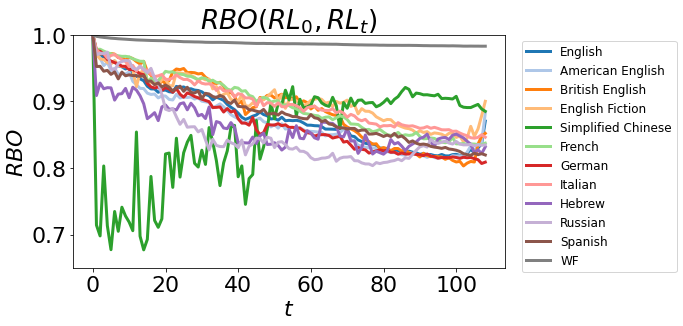

In [171]:
fig, ax = plt.subplots(1,1,figsize=(10,5))
for l in l_codes:
    ax.plot(LA_RBO_initt.loc[l,:],color=l_colors[l],label=l_labels[l],linewidth=3)
ax.plot(WF_RBO_initt,color='gray',label=r'WF',linewidth=3)
ax.set_xlabel(r'$t$')
ax.set_ylabel(r'$RBO$')
ax.set_ylim(0.65,1)
ax.set_title(r'$RBO(RL_{0},RL_{t})$')
ax.legend(fontsize=12, bbox_to_anchor=(1.025, 1), loc='upper left')
plt.tight_layout()
plt.savefig('figures/MAIN-1/rbo-initt_la.png')
plt.show()

#### Extra Section - Turnover

In [172]:
# turnover equation (Evans and Giometto 2011 eq. 4), (Acerbi et. al. 2014 eq. 1) and/or (Ruck et. al. 2017 eq. 1)
# b = 0.86 means unbiased copying according to Acerbu i et. al. 2014 and Ruck et. al. 2017
def turnover(mu,y,n,d=1.38,a=0.55,b=0.86,c=0.13):
    return d*(np.power(mu,a))*(np.power(y,b))*(np.power(n,c))

# generic turnover equation
def turnover_gen(y,a,b=0.86):
    return a*(np.power(y,b))

In [173]:
y = list(range(0,100,1)) # top y list
a = 1
b = 0.86
z_theory = turnover_gen(y,a,b)

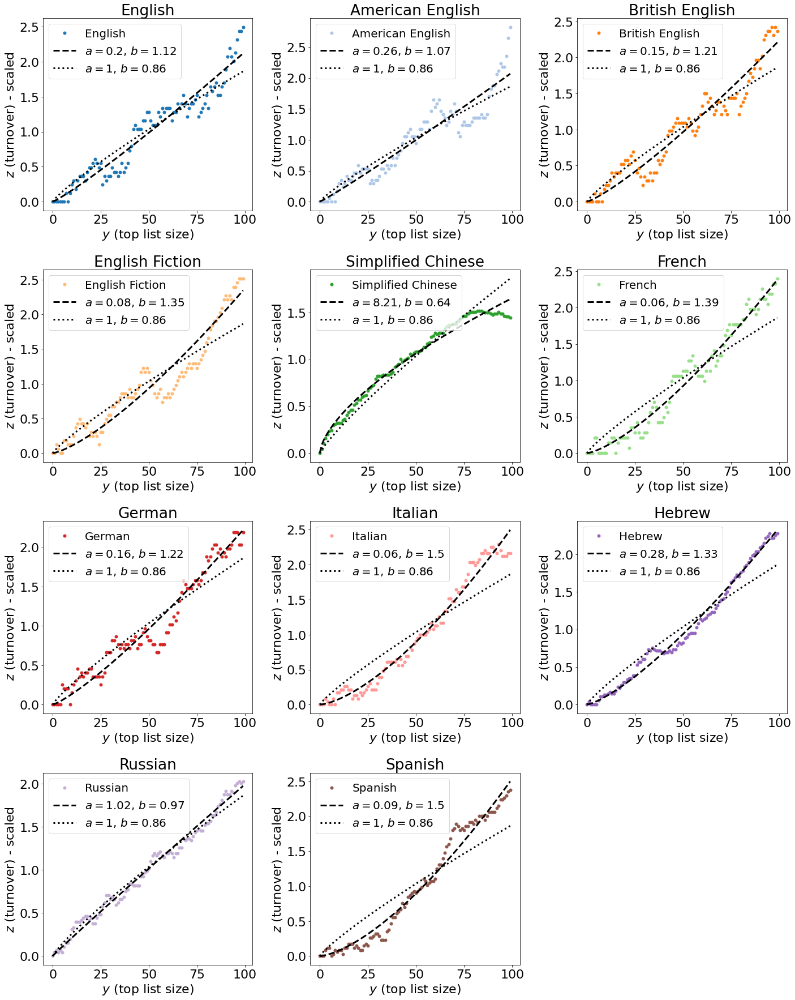

In [174]:
fig, ax = plt.subplots(4,3,figsize=(20,25))
for l in l_codes:
    turnover_rates = {'y':[],'z':[],'z-theory':z_theory}

    for i in y:
        new_words = []
        for j in range(1901,2009,1):
            t_turn = set(LA_RANKS[l]['olist'][0:i][j-1])
            t1_turn = set(LA_RANKS[l]['olist'][0:i][j])

            new_words.extend(list(t1_turn.difference(t_turn)))

        turnover_rates['y'].append(i)
        turnover_rates['z'].append(len(np.unique(new_words)))

    TR = pd.DataFrame(turnover_rates)

    # fit
    parameters, covariance = curve_fit(turnover_gen, TR['y'], TR['z'])
    a_fit = round(parameters[0],2)
    b_fit = round(parameters[1],2)
    TR['z-fit'] = turnover_gen(y,a=parameters[0],b=parameters[1])

    # mean normalizations
    TR['z-norm'] = TR['z']/np.mean(TR['z'])
    TR['z-fit-norm'] = TR['z-fit']/np.mean(TR['z-fit'])
    TR['z-theory-norm'] = TR['z-theory']/np.mean(TR['z-theory'])

    ax[l_plot_grids[l]].plot(TR['y'],TR['z-norm'],'.',markersize=10,color=l_colors[l],label=l_labels[l])
    ax[l_plot_grids[l]].plot(TR['y'],TR['z-fit-norm'],'--',linewidth=3,color='black',label=r'$a=$'+str(a_fit)+r', $b=$'+str(b_fit))
    ax[l_plot_grids[l]].plot(TR['y'],TR['z-theory-norm'],':',linewidth=3,label=r'$a=$'+str(a)+r', $b=$'+str(b),color='black')
    ax[l_plot_grids[l]].set_xlabel(r'$y$ (top list size)')
    ax[l_plot_grids[l]].set_ylabel(r'$z$ (turnover) - scaled')
    ax[l_plot_grids[l]].set_title(l_labels[l])
    ax[l_plot_grids[l]].legend(fontsize=20, loc=2)
    
ax[3,2].axis('off')
    
plt.tight_layout()
plt.savefig('figures/MAIN-1/turnover_la_4x3.png')
plt.show()